In [1]:
import subprocess
import os
import shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm 
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import glob
import re
import time
import holoviews as hv 
import MDAnalysis as mda
import seaborn as sns
from MDAnalysis.analysis import distances, contacts, align, rms
from MDAnalysis.analysis.pca import PCA
from MDAnalysis.coordinates.memory import MemoryReader
import nglview as nv
from nglview.contrib.movie import MovieMaker
import mdtraj as md

/opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/lib/python3.11/site-packages/MDAnalysis/topology/TPRParser.py:161: DeprecationWarning: 'xdrlib' is deprecated and slated for removal in Python 3.13
  import xdrlib


You have to install moviepy, imageio and ffmeg
pip install moviepy==0.2.2.11
pip install imageio==1.6


In [6]:
workdir = '/Volumes/ExFAT/Lab/CaTEV'

# Background

_"We also tested alternative CaM-binding peptides (CaMbps) within the insert module in an attempt to further optimize CaTEV (SI Appendix, Fig. S2). In addition to the original “M13” CaMbp derived from Ca2+/CaM-dependent protein kinase kinase, we screened seven additional variants (13) of the M13 CaMbp (14) derived from skeletal muscle myosin light-chain kinase. In the context of scFLARE, CKK gave the best calcium- and light-dependent turn on."_

<b>So, we should expect a conformational change in presence of calcium for the CKK but not for M13. The Ca2+ concentration used is 6mM.</b>

As these are Alpha-fold models, I would run them for 50ns to allow them to truly relax in a production run with standard conditions (37°, NaCl 150 mM). We should see them reaching a rMSD plateau. If they don't reach a plateau, we should extend these initial simulations.

From the last MD snapshot for each construct, let's run without (0mM) and with (6mM) Calcium, 2 replicates of 300ns for each condition (i.e. 4 replicates / construct).

## Color coding
En azul está la secuencia de la proteasa (y la triada catalítica en negrita azul), en rojo la calmodulina, en amarillo el calmodulin-binding peptide, y finalmente en verde, los linkers entre los 3 componentes. Ahora estoy haciendo versiones sin los linkers de manera sistemática, por lo que siente libre de correr simulaciones es su ausencia. También te adjunto el modelo generado por alphafold.

## Protein info
Following residues will be considered for part of the analysis (excl. N and C flappy terms)
- Ile 18 - Leu 386 (CKK)
- Ile 18 - Leu 377 (M13)

Calmodulin residues:
- 64-240 (CKK)
- 65-231 (M13)

Calmodulin-only residues (excl. CaM BP and linkers)
- 64-141  172-240 (CKK)
- 65-141  163-231 (M13)

CaM binding peptide residues :
- 144-169 (CKK)
- 144-160 (M13)

CaM binding peptide alpha-helix residues:
- 150-161 (CKK)
- 152-158 (M13)

# Generate input files

In [3]:
init = 'step3_input'
mini_prefix = 'step4.0_minimization'
equi_prefix = 'step4.1_equilibration'
prod_prefix = 'step5_production'

## Non-calcium trajectories: CKK, M13

In [6]:
# NON-CALCIUM TRAJECTORIES
dirs = ["CKK", "M13"]

for dir in dirs:
    reps = ["r1", "r2", "r3"]
    # Note: ckeck that step3_input.gro was previously copied to r2 r3
    mergedir = os.path.join(workdir, dir, 'merged')
    os.makedirs(mergedir, exist_ok=True)

    for rep in reps:
        repdir = os.path.join(workdir, dir, rep)
        os.chdir(repdir)

        # protein-only structure for VMD visualization
        subprocess.run(['gmx', 'editconf', '-f', f'{init}.gro', '-o', f'mdstr_{init}_prot.gro', '-ndef'], input='1\n', text=True)

        # PROCESS TRAJECTORY
        subprocess.run(['gmx', 'trjconv', '-f', f'{prod_prefix}.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_prot_cut.xtc', '-pbc', 'whole', '-dt', '1000'], input='1\n', text=True)
        subprocess.run(['gmx', 'trjconv', '-f', f'mdtrj_{rep}_prot_cut.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_prot_nojump.xtc', '-pbc', 'nojump'], input='1\n', text=True)
        subprocess.run(['gmx', 'trjconv', '-f', f'mdtrj_{rep}_prot_nojump.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_prot_cent.xtc', '-pbc', 'mol', '-center'], input='1 1\n', text=True)
        subprocess.run(['gmx', 'trjconv', '-f', f'mdtrj_{rep}_prot_cent.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_prot_fit.xtc', '-fit', 'rot+trans'], input='1 1\n', text=True)
        os.remove(f'mdtrj_{rep}_prot_cut.xtc')
        os.remove(f'mdtrj_{rep}_prot_nojump.xtc')
        os.remove(f'mdtrj_{rep}_prot_cent.xtc')
        shutil.copy(f'mdtrj_{rep}_prot_fit.xtc', mergedir)

        # RMSD RMSF
        subprocess.run(['gmx', 'rms', '-s', f'{init}.gro', '-f', f'mdtrj_{rep}_prot_fit.xtc', '-o', f'rmsd_{rep}_init_bb.xvg', '-tu', 'ns'], input='4 4\n', text=True)
        subprocess.run(['gmx', 'rms', '-s', f'{init}.gro', '-f', f'mdtrj_{rep}_prot_fit.xtc', '-o', f'rmsd_{rep}_init_ca.xvg', '-tu', 'ns'], input='3 3\n', text=True)
        subprocess.run(['gmx', 'rmsf', '-s', f'{init}.gro', '-f', f'mdtrj_{rep}_prot_fit.xtc', '-o', f'rmsf_{rep}_init_ca.xvg', '-res'], input='3\n', text=True)

    # MERGED
    rep1 = reps[0]
    rep2 = reps[1]
    rep3 = reps[2]

    os.chdir(mergedir)
    # Copy structure files only from replicate 1
    for file in [f'{init}.gro', f'{prod_prefix}.gro', f'mdstr_{init}_prot.gro']:
        shutil.copy(os.path.join('..', rep1, file), '.')

    # Merge
    subprocess.run(['gmx', 'trjcat', '-f', f'mdtrj_{rep1}_prot_fit.xtc', f'mdtrj_{rep2}_prot_fit.xtc', f'mdtrj_{rep3}_prot_fit.xtc', '-o', 'mdtrj_merged_prot_fit.xtc', '-cat'], text=True)
    os.remove(f'mdtrj_{rep1}_prot_fit.xtc')
    os.remove(f'mdtrj_{rep2}_prot_fit.xtc')
    os.remove(f'mdtrj_{rep3}_prot_fit.xtc')
    
#
    ## PDB CA-only trajectory for Elastic Network Model Normal Mode Analysis
    #subprocess.run(['gmx', 'trjconv', '-f', 'mdtrj_merged_prot_fit.xtc', '-s', f'{init}.gro', '-o', 'mdtrj_merged_ca_fit.pdb'], input='3\n', text=True)
#
    ## PCA input files
    #subprocess.run(['gmx', 'covar', '-f', 'mdtrj_merged_prot_fit.xtc', '-s', f'{prod_prefix}.gro', '-o', 'eigenval_merged_ca.xvg', '-tu', 'ns'], input='3 3\n', text=True)
    #subprocess.run(['gmx', 'anaeig', '-v', 'eigenvec.trr', '-f', 'mdtrj_merged_prot_fit.xtc', '-s', f'{prod_prefix}.gro', '-comp', 'eigcomp_merged.xvg', '-rmsf', 
    #                'eigrmsf_merged.xvg', '-2d', '2d_merged.xvg', '-tu', 'ns', '-first', '1', '-last', '2', '-filt', 'filtered_merged.xtc', '-extr', 'extreme_merged_.pdb', 
    #                '-nframes', '10'], input='3 3\n', text=True)
#
    ## VMD Salt Bridges output
    #vmd_tcl_pathway= '/Users/federicopozzani/Desktop/Lab/Scripts/vmd_saltbridges_hbonds_analysis.tcl'
    #saltbrdir= os.path.join(mergedir, 'salt_bridges')
    #os.makedirs(saltbrdir, exist_ok=True)
#
    #vmd_executable = '/Applications/VMD 1.9.4a51-x86_64-Rev9.app/Contents/MacOS/startup.command'
    #vmd_tcl_pathway = '/Users/federicopozzani/Desktop/Lab/Scripts/vmd_saltbridges_hbonds_analysis.tcl'
    #vmd_command = [vmd_executable,f'{mergedir}/mdstr_{init}_prot.gro','mdtrj_merged_prot_fit.xtc','-e',vmd_tcl_pathway,'-dispdev','text']
    #
    #subprocess.run(vmd_command, text=True)
    #
    #file_list = os.listdir(saltbrdir)
    #with open("ls_saltbridges.txt", "w") as txt_file:
    #    txt_file.write("\n".join(file_list))

    

               :-) GROMACS - gmx editconf, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK/r1
Command line:
  gmx editconf -f step3_input.gro -o mdstr_step3_input_prot.gro -ndef


Select a group for output:
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Othe

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 111564 atoms
Volume: 1191.02 nm^3, corresponds to roughly 535900 electrons
No velocities found
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK/r1
Command line:
  gmx trjconv -f step5_production.xtc -s step4.1_equilibration.gro -o mdtrj_r1_prot_cut.xtc -pbc whole -dt 1000

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has 

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK/r1
Command line:
  gmx trjconv -f mdtrj_r1_prot_cut.xtc -s step4.1_equilibration.gro -o mdtrj_r1_prot_nojump.xtc -pbc nojump

Will write xtc: Compressed trajectory (portable xdr format): xtc
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Gro

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "I Am a Poor Lonesome Cowboy" (Lucky Luke)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK/r1
Command line:
  gmx trjconv -f mdtrj_r1_prot_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r1_prot_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Group     0 (         System) has 1

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


Select group for least squares fit
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
      


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'



Select a group for output:
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: 
GROMACS reminds you: "I Need a Little Poison" (Throwing Muses)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 111564 atoms
Volume: 1191.02 nm^3, corresponds to roughly 535900 electrons
No velocities found
Selected 1: 'Protein'


Reading frame       0 time    0.000   
Precision of step5_production.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame       5000 time 500000.000    ->  frame    400 time 400000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "What's the point, yo, what's the spread?" (Red Hot Chili Peppers)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK/r2
Command line:
  gmx trjconv -f mdtrj_r2_prot_cut.xtc -s step4.1_equilibration.gro -o mdtrj_r2_prot_nojump.xtc -pbc nojump

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Reading frame       0 time    0.000   
Precision of mdtrj_r2_prot_cut.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  fr

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Group     0 (         System) has 1

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Group     0 (         System) has 1

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK/r2
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r2_prot_fit.xtc -o rmsd_r2_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
      


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Note that major changes are planned in future for editconf, to improve usability and utility.
Read 111564 atoms
Volume: 1191.02 nm^3, corresponds to roughly 535900 electrons
No velocities found
Selected 1: 'Protein'



Select a group for output:
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: 
GROMACS reminds you: "You Own the Sun" (Throwing Muses)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/minifor

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Reading frame       0 time    0.000   
Precision of mdtrj_r3_prot_cut.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  fr

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Group     0 (         System) has 1

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


Select group for least squares fit
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 111564 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105317 elements
Group    12 (          Other) has 105317 elements
Group    13 (            POT) has   116 elements
Group    14 (            CLA) has    99 elements
Group    15 (           TIP3) has 105102 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
      


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'


                :-) GROMACS - gmx trjcat, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK/merged
Command line:
  gmx trjcat -f mdtrj_r1_prot_fit.xtc mdtrj_r2_prot_fit.xtc mdtrj_r3_prot_fit.xtc -o mdtrj_merged_prot_fit.xtc -cat

Reading frame       1 time 1000.000   

Summary of files and start times used:

          File                Start time       Time step
---------------------------------------------------------
    mdtrj_r1_prot_fit.xtc        0.000 ps     1000.000 ps
    mdtrj_r2_prot_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous
    mdtrj_r3_prot_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous

Reading frame       0 time    0.000   
Continue writing frames from mdtrj_r1_prot_fit.xtc t=0 ps, frame=0      
Last frame        500 time 500000.000   

Note that major changes are planned in future for trjcat, to improve usability and utility.
lasttime 0

lasttime 500000

lasttime 500000
Note that major changes are planned in future for editconf, to improve usability and utility.
Read 93195 atoms
Volume: 1000 nm^3, corresponds to roughly 450000 electrons
No velocities found
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r1
Command line:
  gmx trjconv -f step5_production.xtc -s step4.1_equilibration.gro -o mdtrj_r1_prot_cut.xtc -pbc whole -dt 1000

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Reading frame       0 time    0.000   
Precision of mdtrj_r1_prot_cut.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame 

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "I hadn't been aware that there were doors closed to me until I started knocking on them." (Gertrude Elion)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r1
Command line:
  gmx trjconv -f mdtrj_r1_prot_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r1_prot_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Select a group: Group     0 (         System) has 93195

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r1
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r1_prot_fit.xtc -o rmsd_r1_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         y


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'



Select a group for output:
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Select a group: 
GROMACS reminds you: "Once Again Let Me Do This" (Urban Dance Squad)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroo

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 93195 atoms
Volume: 1000 nm^3, corresponds to roughly 450000 electrons
No velocities found
Selected 1: 'Protein'


Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Reading frame       0 time    0.000   
Precision of step5_production.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame       5000 time 500000.000    ->  frame    400 time 400000.000      
 ->  frame  

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r2
Command line:
  gmx trjconv -f mdtrj_r2_prot_cut.xtc -s step4.1_equilibration.gro -o mdtrj_r2_prot_nojump.xtc -pbc nojump

Will write xtc: Compressed trajectory (portable xdr format): xtc
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Grou

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "printf("%d is the year of the linux desktop", year+1);" (Anonymous)



Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r2
Command line:
  gmx trjconv -f mdtrj_r2_prot_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r2_prot_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  194

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r2
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r2_prot_fit.xtc -o rmsd_r2_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         y


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Note that major changes are planned in future for editconf, to improve usability and utility.
Read 93195 atoms
Volume: 1000 nm^3, corresponds to roughly 450000 electrons
No velocities found
Selected 1: 'Protein'



Select a group for output:
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Select a group: 
GROMACS reminds you: "Nothing is more anarchic than power." (Pier Paolo Pasolini)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/hom

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r3
Command line:
  gmx trjconv -f mdtrj_r3_prot_cut.xtc -s step4.1_equilibration.gro -o mdtrj_r3_prot_nojump.xtc -pbc nojump

Will write xtc: Compressed trajectory (portable xdr format): xtc
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Grou

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "But in my opinion, all things in nature occur mathematically." (Rene Decartes)



Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/r3
Command line:
  gmx trjconv -f mdtrj_r3_prot_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r3_prot_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  194

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 1: 'Protein'


Select group for least squares fit
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 93195 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87099 elements
Group    12 (          Other) has 87099 elements
Group    13 (            POT) has    98 elements
Group    14 (            CLA) has    82 elements
Group    15 (           TIP3) has 86919 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         y


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'


                :-) GROMACS - gmx trjcat, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13/merged
Command line:
  gmx trjcat -f mdtrj_r1_prot_fit.xtc mdtrj_r2_prot_fit.xtc mdtrj_r3_prot_fit.xtc -o mdtrj_merged_prot_fit.xtc -cat

Reading frame       1 time 1000.000   

Summary of files and start times used:

          File                Start time       Time step
---------------------------------------------------------
    mdtrj_r1_prot_fit.xtc        0.000 ps     1000.000 ps
    mdtrj_r2_prot_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous
    mdtrj_r3_prot_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous

Reading frame       0 time    0.000   
Continue writing frames from mdtrj_r1_prot_fit.xtc t=0 ps, frame=0      
Last frame        500 time 500000.000   

Note that major changes are planned in future for trjcat, to improve usability and utility.
lasttime 0

lasttime 500000

lasttime 500000



Last frame written was 1502, time 500000.000000 ps

GROMACS reminds you: "You Hear Footsteps Coming From Behind" (Colossal Cave)



## Calcium trajectories: CKK_ca2+, M13_ca2+

In [7]:
# CALCIUM TRAJECTORIES
dirs = ["CKK_ca2+", "M13_ca2+"]

for dir in dirs:
    reps = ["r1", "r2", "r3"]
    # Note: ckeck that step3_input.gro was previously copied to r2 r3
    mergedir = os.path.join(workdir, dir, 'merged')
    os.makedirs(mergedir, exist_ok=True)

    for rep in reps:
        repdir = os.path.join(workdir, dir, rep)
        os.chdir(repdir)
        
        # protein-only structure for VMD visualization
        subprocess.run(['gmx', 'editconf', '-f', f'{init}.gro', '-o', f'mdstr_{init}_prot.gro', '-ndef'], input='1\n', text=True)
#
        ## PROCESS TRAJECTORY
        subprocess.run(['gmx', 'trjconv', '-f', f'{prod_prefix}.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_syst_cut.xtc', '-pbc', 'whole', '-dt', '1000'], input='0\n', text=True)
        subprocess.run(['gmx', 'trjconv', '-f', f'mdtrj_{rep}_syst_cut.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_syst_nojump.xtc', '-pbc', 'nojump'], input='0\n', text=True)
        subprocess.run(['gmx', 'trjconv', '-f', f'mdtrj_{rep}_syst_nojump.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_syst_cent.xtc', '-pbc', 'mol', '-center'], input='1 0\n', text=True)
        subprocess.run(['gmx', 'trjconv', '-f', f'mdtrj_{rep}_syst_cent.xtc', '-s', f'{equi_prefix}.gro', '-o', f'mdtrj_{rep}_syst_fit.xtc', '-fit', 'rot+trans'], input='1 0\n', text=True)
        os.remove(f'mdtrj_{rep}_syst_cut.xtc')
        os.remove(f'mdtrj_{rep}_syst_nojump.xtc')
        os.remove(f'mdtrj_{rep}_syst_cent.xtc')
        shutil.copy(f'mdtrj_{rep}_syst_fit.xtc', mergedir)
#
        ## RMSD RMSF
        subprocess.run(['gmx', 'rms', '-s', f'{init}.gro', '-f', f'mdtrj_{rep}_syst_fit.xtc', '-o', f'rmsd_{rep}_init_bb.xvg', '-tu', 'ns'], input='4 4\n', text=True)
        subprocess.run(['gmx', 'rms', '-s', f'{init}.gro', '-f', f'mdtrj_{rep}_syst_fit.xtc', '-o', f'rmsd_{rep}_init_ca.xvg', '-tu', 'ns'], input='3 3\n', text=True)
        subprocess.run(['gmx', 'rmsf', '-s', f'{init}.gro', '-f', f'mdtrj_{rep}_syst_fit.xtc', '-o', f'rmsf_{rep}_init_ca.xvg', '-res'], input='3\n', text=True)

    ## MERGED
    rep1 = reps[0]
    rep2 = reps[1]
    rep3 = reps[2]

    os.chdir(mergedir)
    for file in [f'{init}.gro', f'{prod_prefix}.gro', f'mdstr_{init}_prot.gro']:
        shutil.copy(os.path.join('..', rep1, file), '.')

    # Merge
    subprocess.run(['gmx', 'trjcat', '-f', f'mdtrj_{rep1}_syst_fit.xtc', f'mdtrj_{rep2}_syst_fit.xtc', f'mdtrj_{rep3}_syst_fit.xtc', '-o', 'mdtrj_merged_syst_fit.xtc', '-cat'], text=True)
    os.remove(f'mdtrj_{rep1}_syst_fit.xtc')
    os.remove(f'mdtrj_{rep2}_syst_fit.xtc')
    os.remove(f'mdtrj_{rep3}_syst_fit.xtc')
    
    # Protein-only trajectory
    subprocess.run(['gmx', 'trjconv', '-f', 'mdtrj_merged_syst_fit.xtc', '-s', f'{init}.gro', '-o', 'mdtrj_merged_prot_fit.xtc'], input='1\n', text=True)
#
    ## PDB CA-only trajectory for Elastic Network Model Normal Mode Analysis
    #subprocess.run(['gmx', 'trjconv', '-f', 'mdtrj_merged_syst_fit.xtc', '-s', f'{init}.gro', '-o', 'mdtrj_merged_ca_fit.pdb'], input='3\n', text=True)
#
    ## PCA input files
    #subprocess.run(['gmx', 'covar', '-f', 'mdtrj_merged_syst_fit.xtc', '-s', f'{prod_prefix}.gro', '-o', 'eigenval_merged_ca.xvg', '-tu', 'ns'], input='3 3\n', text=True)
    #subprocess.run(['gmx', 'anaeig', '-v', 'eigenvec.trr', '-f', 'mdtrj_merged_syst_fit.xtc', '-s', f'{prod_prefix}.gro', '-comp', 'eigcomp_merged.xvg', '-rmsf', 
    #                'eigrmsf_merged.xvg', '-2d', '2d_merged.xvg', '-tu', 'ns', '-first', '1', '-last', '2', '-filt', 'filtered_merged.xtc', '-extr', 'extreme_merged_.pdb', 
    #                '-nframes', '10'], input='3 3\n', text=True)
#
    ## VMD Salt Bridges output
    #vmd_tcl_pathway= '/Users/federicopozzani/Desktop/Lab/Scripts/vmd_saltbridges_hbonds_analysis.tcl'
    #saltbrdir= os.path.join(mergedir, 'salt_bridges')
    #os.makedirs(saltbrdir, exist_ok=True)
#
    #vmd_executable = '/Applications/VMD 1.9.4a51-x86_64-Rev9.app/Contents/MacOS/startup.command'
    #vmd_tcl_pathway = '/Users/federicopozzani/Desktop/Lab/Scripts/vmd_saltbridges_hbonds_analysis.tcl'
    #vmd_command = [vmd_executable,f'{mergedir}/mdstr_{init}_prot.gro','mdtrj_merged_prot_fit.xtc','-e',vmd_tcl_pathway,'-dispdev','text']
    #
    #subprocess.run(vmd_command, text=True)
    #
    #file_list = os.listdir(saltbrdir)
    #with open("ls_saltbridges.txt", "w") as txt_file:
    #    txt_file.write("\n".join(file_list))

               :-) GROMACS - gmx editconf, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r1
Command line:
  gmx editconf -f step3_input.gro -o mdstr_step3_input_prot.gro -ndef


Select a group for output:
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (         

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 111537 atoms
Volume: 1191.02 nm^3, corresponds to roughly 535900 electrons
No velocities found
Selected 1: 'Protein'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r1
Command line:
  gmx trjconv -f step5_production.xtc -s step4.1_equilibration.gro -o mdtrj_r1_syst_cut.xtc -pbc whole -dt 1000

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H)

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Reading frame       0 time    0.000   
Precision of mdtrj_r1_syst_cut.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "I ought to warn you, I have no faith" (Jane Eyre in Jane Eyre by Charlotte Bronte)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r1
Command line:
  gmx trjconv -f mdtrj_r1_syst_nojump.xtc -s step4.1_equilibration.gro -o mdtrj_r1_syst_cent.xtc -pbc mol -center

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you prov

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Reading frame       0 time    0.000   
Precision of mdtrj_r1_syst_nojump.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame        500 time 500000.000    ->  frame    499 time 499000.000      >  frame     69 time 69000.000       ->  frame     89 time 89000.000       ->  frame    159 time 159000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "They don't have half hours in the north" (Carl Caleman)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r1
Command line:
  gmx trjconv -f mdtrj_r1_syst_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r1_syst_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Se

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r1
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r1_syst_fit.xtc -o rmsd_r1_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Grou


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111537 elements
Group     1 (        Protein


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot b


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Note that major changes are planned in future for editconf, to improve usability and utility.
Read 111537 atoms
Volume: 1191.02 nm^3, corresponds to roughly 535900 electrons
No velocities found
Selected 1: 'Protein'



GROMACS reminds you: "Shaken, not Stirred" (J. Bond)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r2
Command line:
  gmx trjconv -f step5_production.xtc -s step4.1_equilibration.gro -o mdtrj_r2_syst_cut.xtc -pbc whole -dt 1000

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainCha

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Reading frame       0 time    0.000   
Precision of mdtrj_r2_syst_cut.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame        500 time 500000.000 

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "Mathematics is a game played according to certain rules with meaningless marks on paper." (David Hilbert)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r2
Command line:
  gmx trjconv -f mdtrj_r2_syst_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r2_syst_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Se

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r2
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r2_syst_fit.xtc -o rmsd_r2_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Grou


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111537 elements
Group     1 (        Protein


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot b


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'



Select a group for output:
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Select a group: 
GROMACS reminds you: "Wild Pointers Couldn't Drag Me Away" (K.A. Feenstra)

               :-) GROMACS - gmx trjconv, 

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 111537 atoms
Volume: 1191.02 nm^3, corresponds to roughly 535900 electrons
No velocities found
Selected 1: 'Protein'


Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Reading frame       0 time    0.000   
Precision of step5_production.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame       5000 time 500000.000  

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      >  frame     16 time 16000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "To dissimulate is to feign not to have what one has. To simulate is to feign to have what one hasn't." (Jean Baudrillard)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r3
Command line:
  gmx trjconv -f mdtrj_r3_syst_nojump.xtc -s step4.1_equilibration.gro -o mdtrj_r3_syst_cent.xtc -pbc mol -center

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         Sys

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      >  frame     39 time 39000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "There's a limit to how many times you can read how great you are and what an inspiration you are, but I'm not there yet." (Randy Pausch)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r3
Command line:
  gmx trjconv -f mdtrj_r3_syst_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r3_syst_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Se

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r3
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r3_syst_fit.xtc -o rmsd_r3_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Grou


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 111537 elements
Group     1 (        Protein


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11 (    non-Protein) has 105290 elements
Group    12 (          Other) has 105290 elements
Group    13 (            POT) has   116 elements
Group    14 (            CAL) has     5 elements
Group    15 (            CLA) has   109 elements
Group    16 (           TIP3) has 105060 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot b


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'


                :-) GROMACS - gmx trjcat, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/merged
Command line:
  gmx trjcat -f mdtrj_r1_syst_fit.xtc mdtrj_r2_syst_fit.xtc mdtrj_r3_syst_fit.xtc -o mdtrj_merged_syst_fit.xtc -cat

Reading frame       1 time 1000.000   

Summary of files and start times used:

          File                Start time       Time step
---------------------------------------------------------
    mdtrj_r1_syst_fit.xtc        0.000 ps     1000.000 ps
    mdtrj_r2_syst_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous
    mdtrj_r3_syst_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous

Reading frame       0 time    0.000   
Continue writing frames from mdtrj_r1_syst_fit.xtc t=0 ps, frame=0      
Last frame        500 time 500000.0

Note that major changes are planned in future for trjcat, to improve usability and utility.
lasttime 0

lasttime 500000

lasttime 500000


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/merged
Command line:
  gmx trjconv -f mdtrj_merged_syst_fit.xtc -s step3_input.gro -o mdtrj_merged_prot_fit.xtc

Will write xtc: Compressed trajectory (portable xdr format): xtc
Group     0 (         System) has 111537 elements
Group     1 (        Protein) has  6247 elements
Group     2 (      Protein-H) has  3169 elements
Group     3 (        C-alpha) has   401 elements
Group     4 (       Backbone) has  1203 elements
Group     5 (      MainChain) has  1603 elements
Group     6 (   MainChain+Cb) has  1970 elements
Group     7 (    MainChain+H) has  1988 elements
Group     8 (      SideChain) has  4259 elements
Group     9 (    SideChain-H) has  1566 elements
Group    10 (    Prot-Masses) has  6247 elements
Group    11

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'



Select a group for output:
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select a group: 
GROMACS reminds you: "What's Your Definition Of Dirty ?" (G. Michael)

               :-) GROMACS - gmx trjconv, 2023.3-co

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 93105 atoms
Volume: 1000 nm^3, corresponds to roughly 450000 electrons
No velocities found
Selected 1: 'Protein'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Readin

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "Calling a system 'non-linear' is like calling all wild animals 'non-elephants'." (Stan Ulam)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r1
Command line:
  gmx trjconv -f mdtrj_r1_syst_nojump.xtc -s step4.1_equilibration.gro -o mdtrj_r1_syst_cent.xtc -pbc mol -center

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 e

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Reading frame       0 time    0.000   
Precision of mdtrj_r1_syst_nojump.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "Love is Like Moby Dick, Get Chewed and Get Spat Out" (Urban Dance Squad)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r1
Command line:
  gmx trjconv -f mdtrj_r1_syst_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r1_syst_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r1
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r1_syst_fit.xtc -o rmsd_r1_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group 


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be ma


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'



GROMACS reminds you: "Can someone please tell Icarus that he's not the only one falling from the sky?" (Urban Dance Squad)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r2
Command line:
  gmx trjconv -f step5_production.xtc -s step4.1_equilibration.gro -o mdtrj_r2_syst_cut.xtc -pbc whole -dt 1000

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Gro

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 93105 atoms
Volume: 1000 nm^3, corresponds to roughly 450000 electrons
No velocities found
Selected 1: 'Protein'


Reading frame       0 time    0.000   
Precision of step5_production.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Last frame       5000 time 500000.000    ->  frame    400 time 400000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "It is not critical to add the next quote to a patch release" (Paul Bauer)



Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r2
Command line:
  gmx trjconv -f mdtrj_r2_syst_cut.xtc -s step4.1_equilibration.gro -o mdtrj_r2_syst_nojump.xtc -pbc nojump

Will write xtc: Compressed trajectory (portable xdr format): xtc
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Last frame        500 time 500000.000    ->  frame    499 time 499000.000      
 ->  frame    500 time 500000.000      
Last written: frame    500 time 500000.000


GROMACS reminds you: "The best way to obtain plausible negative examples is to run a docking program with a biophysics-based function." (Julie Bernauer)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r2
Command line:
  gmx trjconv -f mdtrj_r2_syst_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r2_syst_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r2
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r2_syst_fit.xtc -o rmsd_r2_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group 


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be ma


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'



Select a group for output:
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select a group: 
GROMACS reminds you: "Everything Must Go" (Red Hot Chili Peppers)

               :-) GROMACS - gmx trjconv, 2023.3-conda_

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 93105 atoms
Volume: 1000 nm^3, corresponds to roughly 450000 electrons
No velocities found
Selected 1: 'Protein'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Readin

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Reading frame       0 time    0.000   
Precision of mdtrj_r3_syst_cut.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)
Reading frame     400 time 400000.000    ->  frame    399 time 399000.000      

Last written: frame    486 time 486000.000


GROMACS reminds you: "I had a polynomial once. My doctor removed it." (Michael Grant)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r3
Command line:
  gmx trjconv -f mdtrj_r3_syst_nojump.xtc -s step4.1_equilibration.gro -o mdtrj_r3_syst_cent.xtc -pbc mol -center

Will write xtc: Compressed trajectory (portable xdr format): xtc

         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has

Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 0: 'System'


Reading frame     400 time 400000.000    ->  frame    399 time 399000.000      

Last written: frame    486 time 486000.000


GROMACS reminds you: "Throughout my academic career, I'd given some pretty good talks. But being considered the best speaker in the computer science department is like being known as the tallest of the Seven Dwarfs." (Randy Pausch)

               :-) GROMACS - gmx trjconv, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r3
Command line:
  gmx trjconv -f mdtrj_r3_syst_cent.xtc -s step4.1_equilibration.gro -o mdtrj_r3_syst_fit.xtc -fit rot+trans

Will write xtc: Compressed trajectory (portable xdr format): xtc


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for centering
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'



         that are broken across periodic boundaries, they
         cannot be made whole (or treated as whole) without
         you providing a run input file.

Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select

Note that major changes are planned in future for trjconv, to improve usability and utility.

         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Select group for least squares fit
Selected 1: 'Protein'
Select group for output
Selected 0: 'System'


                 :-) GROMACS - gmx rms, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/r3
Command line:
  gmx rms -s step3_input.gro -f mdtrj_r3_syst_fit.xtc -o rmsd_r3_init_bb.xvg -tu ns

Select group for least squares fit
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group 


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 4: 'Backbone'
Selected 4: 'Backbone'


Select group for least squares fit
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Select a group: Select group for RMSD calculation
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'
Selected 3: 'C-alpha'


Select group(s) for root mean square calculation
Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Reading frame       0 time    0.000   
         that are broken across periodic boundaries, they
         cannot be ma


         based on residue and atom names, since they could not be
         definitively assigned from the information in your input
         files. These guessed numbers might deviate from the mass
         and radius of the atom type. Please check the output
         files if necessary. Note, that this functionality may
         be removed in a future GROMACS version. Please, consider
         using another file format for your input.

Selected 3: 'C-alpha'


                :-) GROMACS - gmx trjcat, 2023.3-conda_forge (-:

Executable:   /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV/bin.ARM_NEON_ASIMD/gmx
Data prefix:  /opt/homebrew/Caskroom/miniforge/base/envs/env_CaTEV
Working dir:  /Volumes/ExFAT/Lab/CaTEV/M13_ca2+/merged
Command line:
  gmx trjcat -f mdtrj_r1_syst_fit.xtc mdtrj_r2_syst_fit.xtc mdtrj_r3_syst_fit.xtc -o mdtrj_merged_syst_fit.xtc -cat

Reading frame       1 time 1000.000   

Summary of files and start times used:

          File                Start time       Time step
---------------------------------------------------------
    mdtrj_r1_syst_fit.xtc        0.000 ps     1000.000 ps
    mdtrj_r2_syst_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous
    mdtrj_r3_syst_fit.xtc        0.000 ps     1000.000 ps WARNING: same Start time as previous

Reading frame       0 time    0.000   
Continue writing frames from mdtrj_r1_syst_fit.xtc t=0 ps, frame=0      
Last frame        500 time 500000.0

Note that major changes are planned in future for trjcat, to improve usability and utility.
lasttime 0

lasttime 500000

lasttime 500000


Group     0 (         System) has 93105 elements
Group     1 (        Protein) has  6096 elements
Group     2 (      Protein-H) has  3099 elements
Group     3 (        C-alpha) has   392 elements
Group     4 (       Backbone) has  1176 elements
Group     5 (      MainChain) has  1567 elements
Group     6 (   MainChain+Cb) has  1924 elements
Group     7 (    MainChain+H) has  1945 elements
Group     8 (      SideChain) has  4151 elements
Group     9 (    SideChain-H) has  1532 elements
Group    10 (    Prot-Masses) has  6096 elements
Group    11 (    non-Protein) has 87009 elements
Group    12 (          Other) has 87009 elements
Group    13 (            POT) has    98 elements
Group    14 (            CAL) has     4 elements
Group    15 (            CLA) has    90 elements
Group    16 (           TIP3) has 86817 elements
Reading frame       0 time    0.000   
Precision of mdtrj_merged_syst_fit.xtc is 0.001 (nm)
Using output precision of 0.001 (nm)


Note that major changes are planned in future for trjconv, to improve usability and utility.
Select group for output
Selected 1: 'Protein'




Last written: frame   1488 time 486000.000


GROMACS reminds you: "The biggest lie in science is 'data and code available upon request'" (Michael Eisen)



# Visualize Pymol

In [59]:
def visualize_py(group: str, rep: str = 'merged'):
    pymol_ex= '/Applications/PyMOL.app/Contents/MacOS/PyMOL'
    memory_opt= 'set defer_builds_mode, 3'

    print ('ca2+ absent: loading protein only\n')
    if group.startswith('CKK'):
        pymol_session= "/Users/fede/Desktop/Lab/Projects/CaTEV/Data/step_1/CaTEV_CKK_scFLARE2.pse"
    if group.startswith('M13'):
        pymol_session= "/Users/fede/Desktop/Lab/Projects/CaTEV/Data/step_1/CaTEV_M13_scFLARE2.pse"        

    py_command = [
        pymol_ex,
        pymol_session,
        '-d',
        f'{memory_opt}; load_traj {workdir}/{group}/{rep}/mdtrj_{rep}_prot_fit.xtc, CATEV_{group[:3]}, 1, start=1, stop=-1, interval=1; zoom',
    ]
    
    print (" ".join(py_command))
    # Start pymol as a separate process and detach it from the Python script, then wait for it to complete
    process = subprocess.Popen(py_command, text=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE, stdin=subprocess.PIPE, preexec_fn=os.setpgrp)
    process.wait()
    

In [47]:
def visualize_py(group: str, rep: str = 'merged'):
    pymol_ex= '/Applications/PyMOL.app/Contents/MacOS/PyMOL'
    memory_opt= 'set defer_builds_mode, 3'

    print ('ca2+ present: loading whole system\n')
    if group.startswith('CKK'):
        pymol_session= "/Users/fede/Desktop/Lab/Projects/CaTEV/Data/step_1/CaTEV_CKK_scFLARE2.pse"
    if group.startswith('M13'):
        pymol_session= "/Users/fede/Desktop/Lab/Projects/CaTEV/Data/step_1/CaTEV_M13_scFLARE2.pse"        

    py_command = [
        pymol_ex,
        '-d',
        f'{memory_opt}; load {workdir}/{group}/{rep}/step3_input.gro; load_traj {workdir}/{group}/{rep}/mdtrj_{rep}_syst_fit.xtc, start=1, stop=-1, interval=1',
    ]
    
    print (" ".join(py_command))
    # Start pymol as a separate process and detach it from the Python script, then wait for it to complete
    process = subprocess.Popen(py_command, text=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE, stdin=subprocess.PIPE, preexec_fn=os.setpgrp)
    process.wait()
    

In [ ]:
remove resn CLA or resn POT or resn TIP3;
show spheres, resn CAL;
color yellow, resn CAL

In [60]:
visualize_py('CKK', 'r1')

ca2+ absent: loading protein only

/Applications/PyMOL.app/Contents/MacOS/PyMOL /Users/fede/Desktop/Lab/Projects/CaTEV/Data/step_1/CaTEV_CKK_scFLARE2.pse -d set defer_builds_mode, 3; load_traj /Volumes/ExFAT/Lab/CaTEV/CKK/r1/mdtrj_r1_prot_fit.xtc, CATEV_CKK, 1, start=1, stop=-1, interval=1; zoom


# Visualize VMD

Ca2+ binding sites color coding: 
- EF1 = _green_
- EF2 = _pink_
- EF3 = _red_
- EF4 = _orange_

In [4]:
vmd_executable = '/Applications/VMD 1.9.4a51-x86_64-Rev9.app/Contents/MacOS/startup.command'

def visualize_MD(group: str, rep: str = 'merged'):
    if group.endswith('ca2+'):
        print ('ca2+ present: loading whole system\n')
        if group.startswith('CKK'):
            vmd_tcl= '/Users/federicopozzani/Desktop/Lab/Git/project_orellana_lab/fede/CaTEV/vmd_CKK_ca2+.tcl'
        if group.startswith('M13'):
            vmd_tcl= '/Users/federicopozzani/Desktop/Lab/Git/project_orellana_lab/fede/CaTEV/vmd_M13_ca2+.tcl'
            
            
            
        vmd_command = [
            vmd_executable,
            f'{workdir}/{group}/{rep}/step3_input.gro',
            f'{workdir}/{group}/{rep}/mdtrj_{rep}_syst_fit.xtc',
            '-e',
            vmd_tcl
        ]
        
    else:
        vmd_command = [
            vmd_executable,
            f'{workdir}/{group}/{rep}/mdstr_step3_input_prot.gro',
            f'{workdir}/{group}/{rep}/mdtrj_{rep}_prot_fit.xtc'
        ]
        print ('ca2+ absent: loading protein only\n')
    
    print (" ".join(vmd_command))
    # Start VMD as a separate process and detach it from the Python script, then wait for it to complete
    process = subprocess.Popen(vmd_command, text=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE, stdin=subprocess.PIPE, preexec_fn=os.setpgrp)
    process.wait()

In [5]:
visualize_MD('CKK', 'r1')

ca2+ absent: loading protein only

/Applications/VMD 1.9.4a51-x86_64-Rev9.app/Contents/MacOS/startup.command /Volumes/ExFAT/Lab/CaTEV/CKK/r1/mdstr_step3_input_prot.gro /Volumes/ExFAT/Lab/CaTEV/CKK/r1/mdtrj_r1_prot_fit.xtc


# Analysis

In [3]:
datadir= '/Volumes/ExFAT/Lab/CaTEV'
outdir= '/Users/federicopozzani/Desktop/Lab/Projects/CaTEV/Analyses'

In [4]:
#folder names
groups= ['CKK', 'CKK_ca2+', 'M13', 'M13_ca2+']
#output plot names
groupnames= ['CKK','CKK Ca²⁺','M13','M13 Ca²⁺']

In [5]:
def univ_merged_create(group: str):
    pdb=f'{workdir}/{group}/merged/mdstr_step3_input_prot.gro'
    xtc=f'{workdir}/{group}/merged/mdtrj_merged_prot_fit.xtc'
    
    u= (mda.Universe(pdb, xtc))
    print (f'Created universe for {group} merged:\t{u}')
    return u

In [6]:
all_merged_univs = [univ_merged_create(group) for group in groups]
print (f'\nAll {len(all_merged_univs)} universes stored in all_merged_univs\n')

CKK_merged_univ= all_merged_univs[0]
CKK_ca2_merged_univ= all_merged_univs[1]
M13_merged_univ= all_merged_univs[2]
M13_ca2_merged_univ= all_merged_univs[3]

Created universe for CKK merged:	<Universe with 6247 atoms>
Created universe for CKK_ca2+ merged:	<Universe with 6247 atoms>
Created universe for M13 merged:	<Universe with 6096 atoms>
Created universe for M13_ca2+ merged:	<Universe with 6096 atoms>

All 4 universes stored in all_merged_univs



In [11]:
def univ_reps_create(group: str, rep: str):
    if group.endswith('ca2+'):
        pdb=f'{workdir}/{group}/{rep}/step3_input.gro'
        xtc=f'{workdir}/{group}/{rep}/mdtrj_{rep}_syst_fit.xtc'
    else:    
        pdb=f'{workdir}/{group}/{rep}/mdstr_step3_input_prot.gro'
        xtc=f'{workdir}/{group}/{rep}/mdtrj_{rep}_prot_fit.xtc'
        
    u= (mda.Universe(pdb, xtc))
    print (f'Created universe for {group} {rep}:\t{u}')
    return u

In [12]:
input_rep_groups = [('CKK', 'r1'), ('CKK', 'r2'), 
                ('M13', 'r1'), ('M13', 'r2'), 
                ('CKK_ca2+', 'r1'), ('CKK_ca2+', 'r2'), 
                ('M13_ca2+', 'r1'), ('M13_ca2+', 'r2')]

all_rep_univs = [univ_reps_create(group, rep) for group, rep in input_rep_groups]
print (f'\nAll {len(all_rep_univs)} universes stored in all_rep_univs\n')

CKK_univs = all_rep_univs[:2]
M13_univs = all_rep_univs[2:4]
CKK_ca2_univs = all_rep_univs[4:6]
M13_ca2_univs = all_rep_univs[6:]

Created universe for CKK r1:	<Universe with 6247 atoms>
Created universe for CKK r2:	<Universe with 6247 atoms>
Created universe for M13 r1:	<Universe with 6096 atoms>
Created universe for M13 r2:	<Universe with 6096 atoms>
Created universe for CKK_ca2+ r1:	<Universe with 111537 atoms>
Created universe for CKK_ca2+ r2:	<Universe with 111537 atoms>
Created universe for M13_ca2+ r1:	<Universe with 93105 atoms>
Created universe for M13_ca2+ r2:	<Universe with 93105 atoms>

All 8 universes stored in all_rep_univs



In [7]:
"""Selections to exclude flappy C- and N- Ters
"""
select_CKK= "protein and (resid 18-386) and name CA"
select_M13= "protein and (resid 18-377) and name CA"

In [8]:
def import_xvg(file,x_column, y_column):
    x, y = [], []
    with open(file) as f:
        for line in f:
            cols = line.split()
            try:
                x.append(float(cols[x_column]))
                y.append(float(cols[y_column]))
            except: pass
    return np.array(x),np.array(y)

def read_eigenval(file, x_column, y_column):
    # reads eigenvalues from GROMACS "gmx covar" output
    # e.g. gmx covar -f merged.xtc -s step4.1_equilibration.gro 
    # -o eigenval_merg_wt_ca.xvg -tu ns
    # extracts eigenvector variance
    x, y= [], []
    with open(file) as f:
        for line in f:
            cols = line.split()
            try:
                x.append(float(cols[x_column])) #eigenvector index
                y.append(float(cols[y_column])) #eigenvalues 
            except: pass
    
    t= (sum(y))
    var= [] #variance
    for ele in y:
        n=(ele/t*100)
        var.append(round(n, 2))
    return x, var

## RMSD BB (_GROMACS_)

In [42]:
def rmsd_plot_2reps(group: str, groupname: str, selection: str):
    if selection not in ('bb', 'ca'):
        raise TypeError('selection must be bb (backbone) or ca (alpha carbons)')
    
    filename = f'{datadir}/{group}/r1/rmsd_r1_init_{selection}.xvg'
    x1,y1=import_xvg(filename,0,1)
    filename = f'{datadir}/{group}/r2/rmsd_r2_init_{selection}.xvg'
    x2,y2=import_xvg(filename,0,1)

    #plot data
    fig = plt.figure(figsize=[18,6])
    ax1 = fig.add_subplot(111)
    ax1.set_title(f"RMSD of {selection.upper()} atoms: {groupname}", fontsize=20)    
    ax1.set_xlabel('Time (ns)', fontsize=16, labelpad=20)
    ax1.set_ylabel('RMSD (nm)', fontsize=16, labelpad=20)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    ax1.plot(x1,y1,c='r',label='r1')
    ax1.plot(x2,y2,c='b',label='r2')

    #ax1.axis(xmin=0,xmax=4000, ymin=0, ymax=3.9)

    leg = ax1.legend()

    #plt.grid()
    fout= f'{outdir}/rmsd_{group}_{selection}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
    plt.show()

In [43]:
def rmsd_plot_4reps(twogroups: list, twogroupnames: list, selection: str):
    """
    Plot RMSD for four replicates of two groups.
    """
    if selection not in ('bb', 'ca'):
        raise TypeError('selection must be bb (backbone) or ca (alpha carbons)')
    
    if len(twogroups) != 2:
        raise ValueError("twogroups must be a list containing exactly two group names.")

    filename = f'{datadir}/{twogroups[0]}/r1/rmsd_r1_init_{selection}.xvg'
    x1,y1=import_xvg(filename,0,1)
    filename = f'{datadir}/{twogroups[0]}/r2/rmsd_r2_init_{selection}.xvg'
    x2,y2=import_xvg(filename,0,1)
    
    filename = f'{datadir}/{twogroups[1]}/r1/rmsd_r1_init_{selection}.xvg'
    x3,y3=import_xvg(filename,0,1)
    filename = f'{datadir}/{twogroups[1]}/r2/rmsd_r2_init_{selection}.xvg'
    x4,y4=import_xvg(filename,0,1)
    
    #plot data
    fig = plt.figure(figsize=[18,6])
    ax1 = fig.add_subplot(111)
    ax1.set_title(f"RMSD of {selection.upper()} atoms: {twogroupnames[0]} - {twogroupnames[1]}", fontsize=20)    
    ax1.set_xlabel('Time (ns)', fontsize=16, labelpad=20)
    ax1.set_ylabel('RMSD (nm)', fontsize=16, labelpad=20)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    
    ax1.plot(x1,y1,c='orangered',label=f'{twogroupnames[0]} r1')
    ax1.plot(x2,y2,c='darkorange',label=f'{twogroupnames[0]} r2')
    ax1.plot(x3,y3,c='b',label=f'{twogroupnames[1]} r1')
    ax1.plot(x4,y4,c='navy',label=f'{twogroupnames[1]} r2')
    
    leg = ax1.legend()
     
    #plt.grid()
    fout= f'{outdir}/rmsd_{twogroups[0]}-{twogroups[1]}_{selection}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
    plt.show()

In [44]:
def rmsd_kde_plot_2_groups(twogroups: list, twogroupnames: list, selection: str, bandwidth=0.5):
    
    if selection not in ('bb', 'ca'):
        raise TypeError('selection must be bb (backbone) or ca (alpha carbons)')
    
    filename = f'{datadir}/{twogroups[0]}/r1/rmsd_r1_init_{selection}.xvg'
    x1,y1=import_xvg(filename,0,1)
    filename = f'{datadir}/{twogroups[0]}/r2/rmsd_r2_init_{selection}.xvg'
    x2,y2=import_xvg(filename,0,1)
    
    filename = f'{datadir}/{twogroups[1]}/r1/rmsd_r1_init_{selection}.xvg'
    x3,y3=import_xvg(filename,0,1)
    filename = f'{datadir}/{twogroups[1]}/r2/rmsd_r2_init_{selection}.xvg'
    x4,y4=import_xvg(filename,0,1)
    
    data_1= np.concatenate((y1, y2))
    data_2= np.concatenate((y3, y4))
    
    plt.figure(figsize=[4, 3])
    
    # Create kernel density plot
    sns.kdeplot(data_1, fill=True, color='darkorange', bw_method=bandwidth, label=twogroupnames[0])
    sns.kdeplot(data_2, fill=True, color='b', bw_method=bandwidth, label=twogroupnames[1])
    
    plt.xlabel('RMSD (nm)')
    plt.ylabel('Distribution')
    plt.title(f'RMSD of {selection.upper()} atoms: {twogroupnames[0]} - {twogroupnames[1]}', fontsize=10)
    
    leg = plt.legend(fontsize=8)
    
    fout= f'{outdir}/rmsd_distribution_{twogroups[0]}-{twogroups[1]}_{selection}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')

    plt.show()

In [45]:
def rmsd_kde_plot(group: str, groupname: str, selection: str, bandwidth=0.5):
    # Plots rmsd values merging two replicates of the same group 
    
    if selection not in ('bb', 'ca'):
        raise TypeError('selection must be bb (backbone) or ca (alpha carbons)')
    
    filename = f'{datadir}/{group}/r1/rmsd_r1_init_{selection}.xvg'
    x1,y1=import_xvg(filename,0,1)
    filename = f'{datadir}/{group}/r2/rmsd_r2_init_{selection}.xvg'
    x2,y2=import_xvg(filename,0,1)
    
    # Concatenate rmsd values from both repliacas
    data= np.concatenate((y1, y2))
    
    plt.figure(figsize=[4, 3])
    
    # Create kernel density plot
    sns.kdeplot(data, fill=True, color='b', bw_method=bandwidth)
    
    plt.xlabel('RMSD (nm)')
    plt.ylabel('Distribution')
    plt.title(f'RMSD of {selection.upper()} atoms: {groupname}', fontsize=10)
    
    fout= f'{outdir}/rmsd_distribution_{group}_{selection}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')

    plt.show()


### CKK

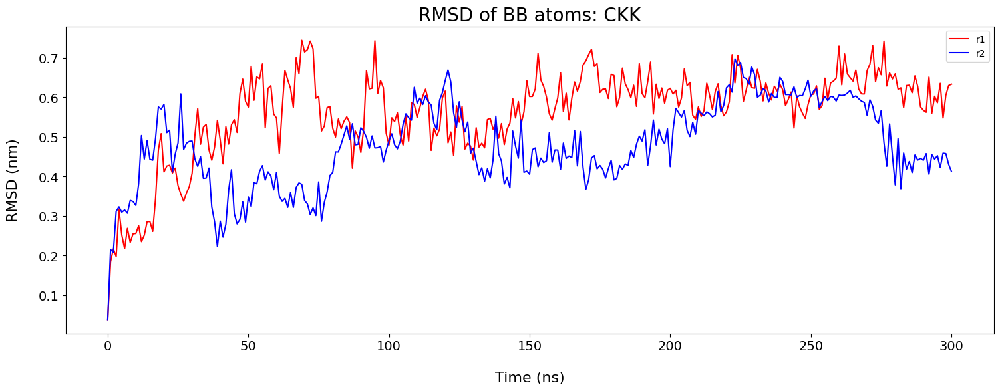

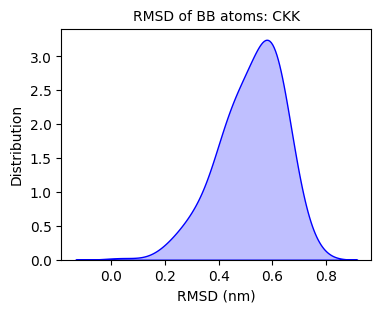

In [46]:
rmsd_plot_2reps(groups[0], groupnames[0], 'bb')
rmsd_kde_plot(groups[0], groupnames[0], 'bb')

### CKK Ca2+

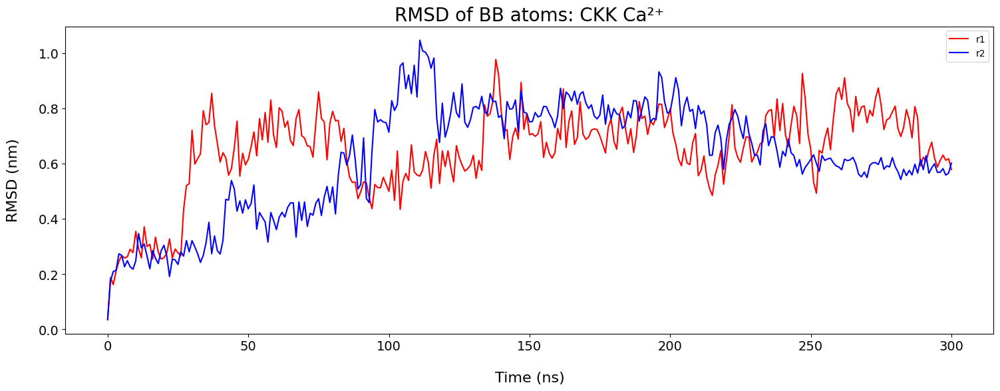

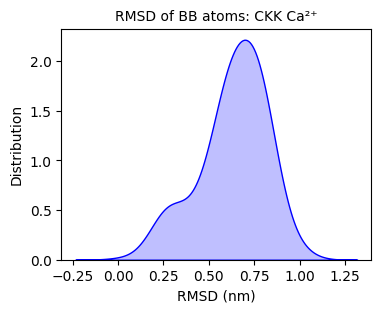

In [47]:
rmsd_plot_2reps(groups[1], groupnames[1], 'bb')
rmsd_kde_plot(groups[1], groupnames[1], 'bb')

### CKK - CKK Ca2+

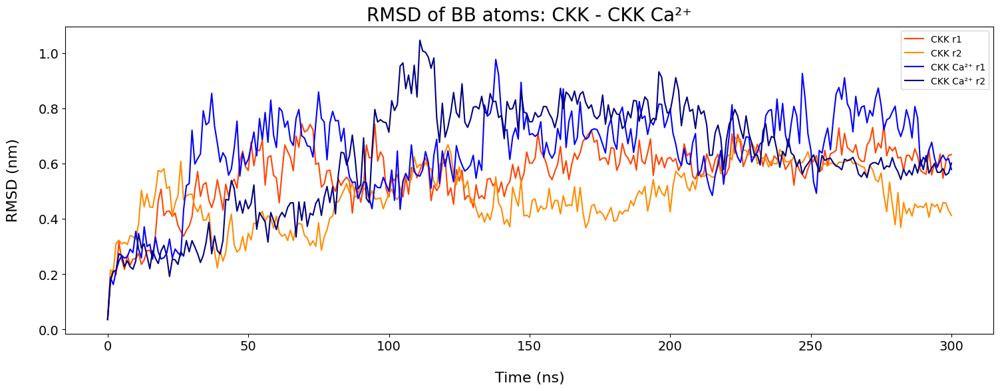

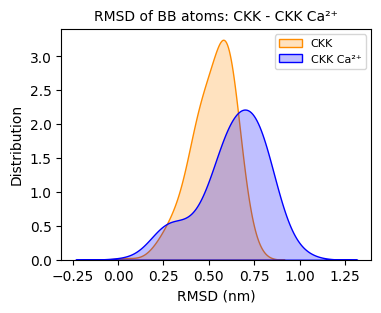

In [48]:
rmsd_plot_4reps(groups[0:2], groupnames[0:2], 'bb')
rmsd_kde_plot_2_groups(groups[0:2], groupnames[0:2], 'bb')

### M13

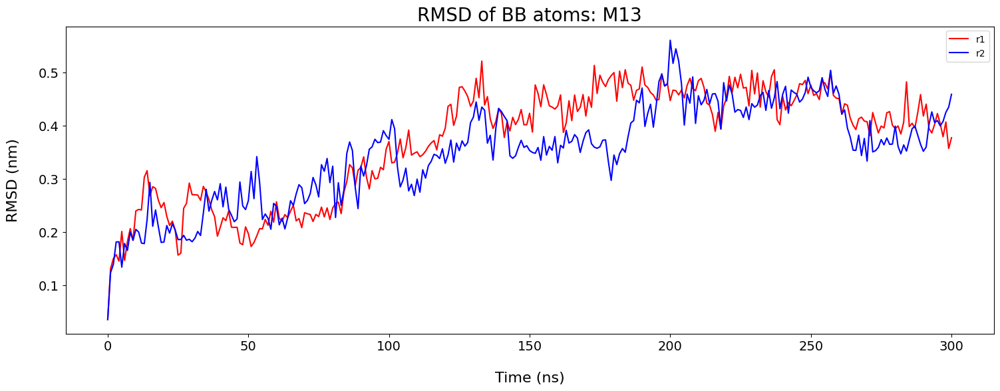

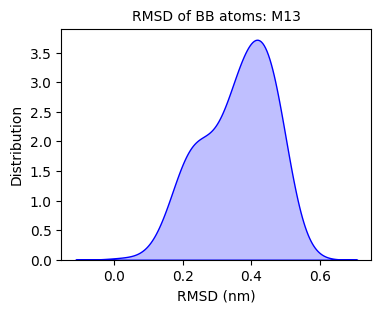

In [49]:
rmsd_plot_2reps(groups[2], groupnames[2], 'bb')
rmsd_kde_plot(groups[2], groupnames[2], 'bb')

### M13 Ca2+

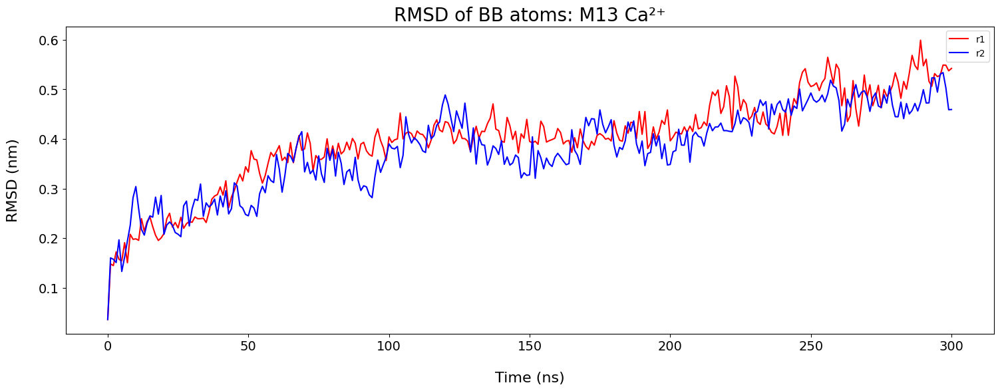

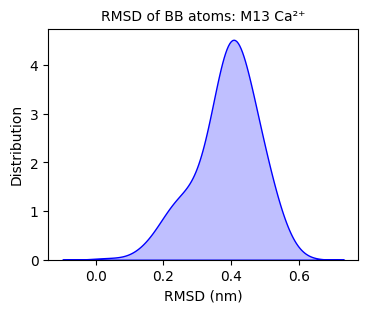

In [50]:
rmsd_plot_2reps(groups[3], groupnames[3], 'bb')
rmsd_kde_plot(groups[3], groupnames[3], 'bb')

### M13 - M13 Ca2+

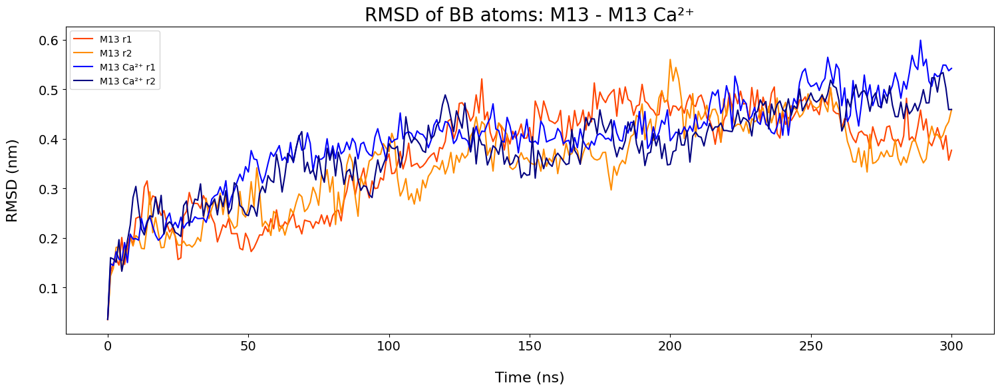

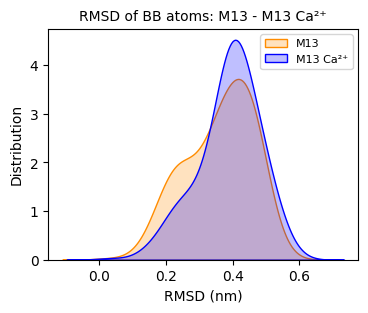

In [51]:
rmsd_plot_4reps(groups[2:4], groupnames[2:4],'bb')
rmsd_kde_plot_2_groups(groups[2:4], groupnames[2:4],'bb')

## RMSD CA (_GROMACS_)

### CKK

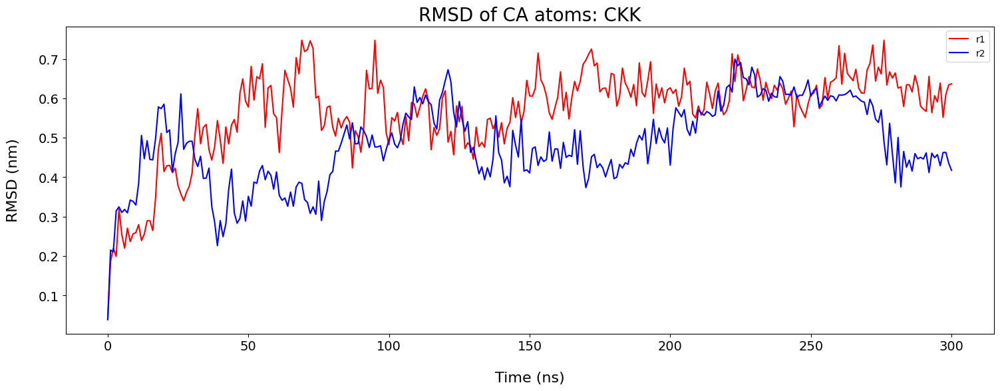

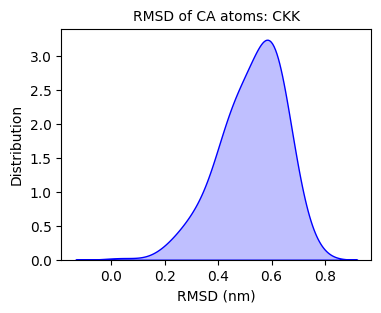

In [52]:
rmsd_plot_2reps(groups[0], groupnames[0], 'ca')
rmsd_kde_plot(groups[0], groupnames[0], 'ca')

### CKK Ca2+

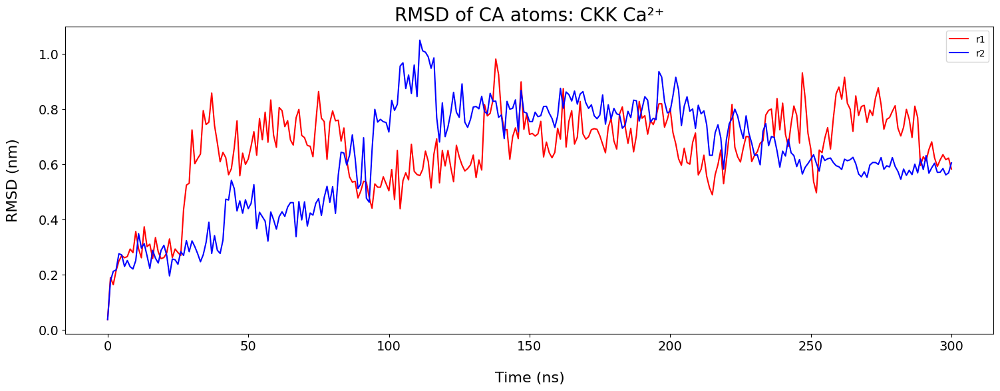

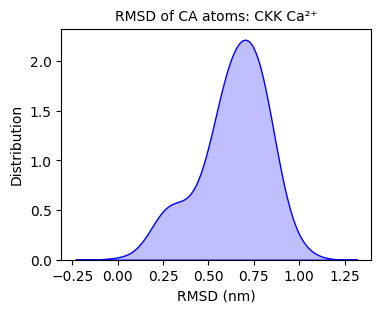

In [53]:
rmsd_plot_2reps(groups[1], groupnames[1], 'ca')
rmsd_kde_plot(groups[1], groupnames[1], 'ca')

### CKK - CKK Ca2+

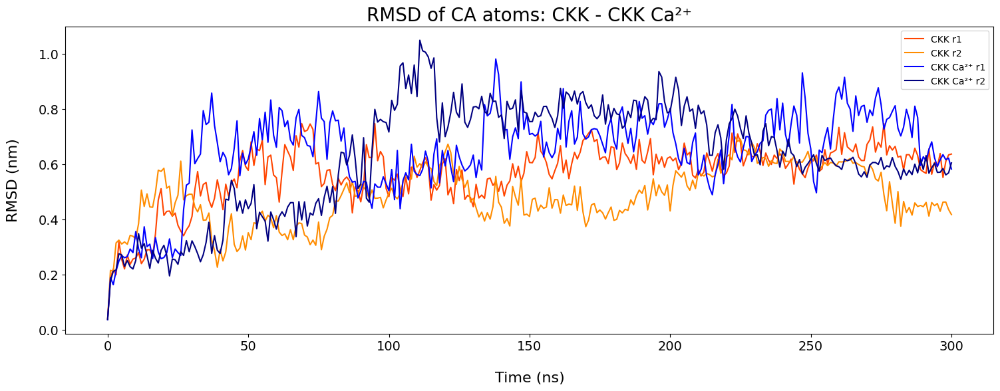

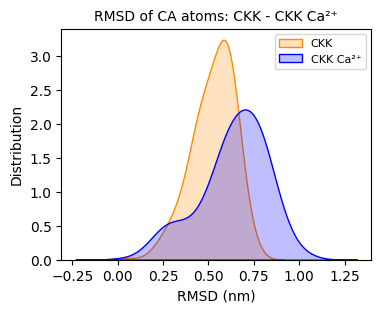

In [54]:
rmsd_plot_4reps(groups[0:2], groupnames[0:2], 'ca')
rmsd_kde_plot_2_groups(groups[0:2], groupnames[0:2], 'ca')

### M13

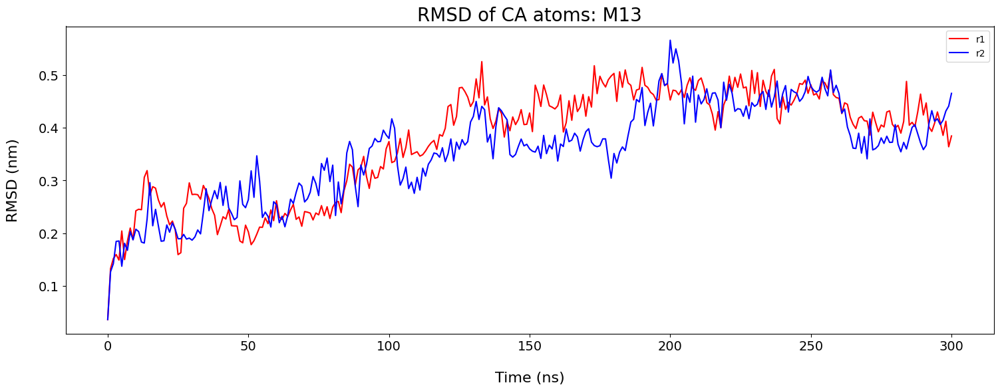

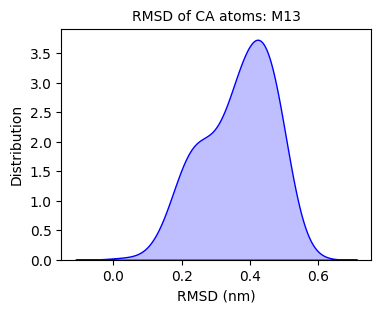

In [55]:
rmsd_plot_2reps(groups[2], groupnames[2], 'ca')
rmsd_kde_plot(groups[2], groupnames[2], 'ca')

### M13 Ca2+

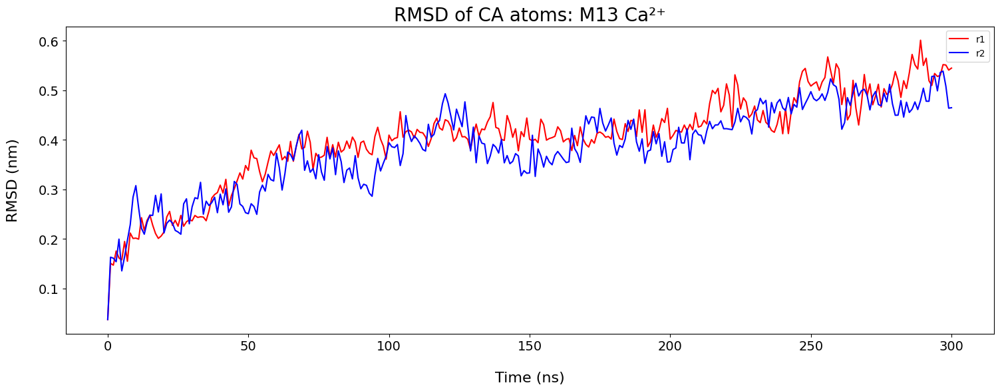

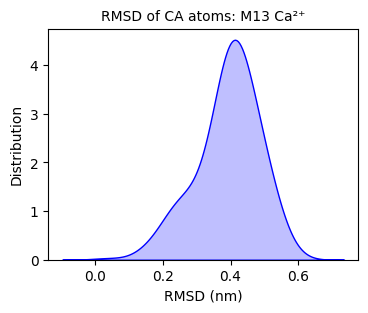

In [56]:
rmsd_plot_2reps(groups[3], groupnames[3], 'ca')
rmsd_kde_plot(groups[3], groupnames[3], 'ca')

### M13 - M13 Ca2+

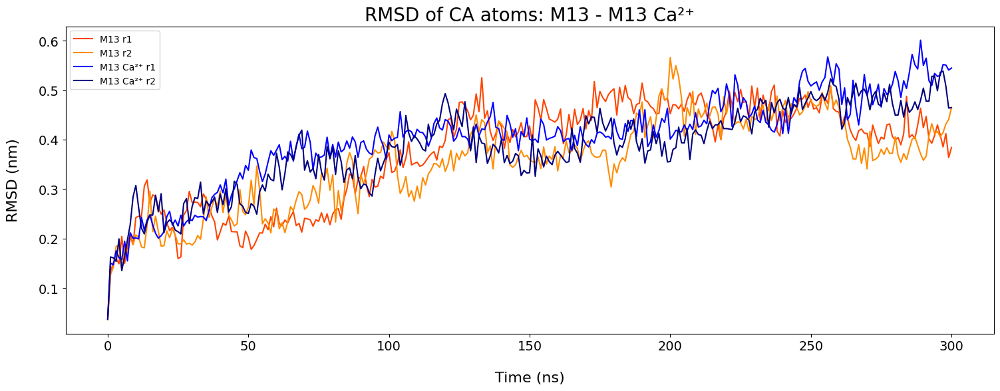

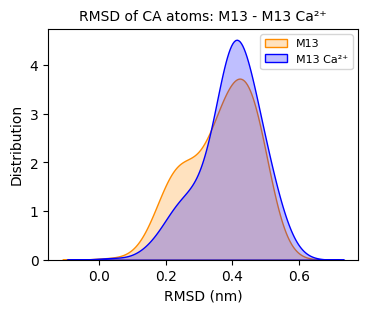

In [57]:
rmsd_plot_4reps(groups[2:4], groupnames[2:4], 'ca')
rmsd_kde_plot_2_groups(groups[2:4], groupnames[2:4], 'ca')

## RMSD CA Selection (_MDAnalysis_)
Compute RMSD

N- and C- termini excluded, to only include:

>- Ile 18 - Leu 386 (CKK)
>- Ile 18 - Leu 377 (M13)

In [80]:
def rmsd_plot_2reps_mda(u1: mda.Universe, u2: mda.Universe, selection: str, groupname: str, bandwidth=0.5):
    def plot_rmsd(df, label, color):
        x, y = df['Frame'], df['Selection']
        ax1.plot(x, y, c=color, label=label)

    R1 = rms.RMSD(u1, select=selection)
    R1.run()

    R2 = rms.RMSD(u2, select=selection)
    R2.run()

    fig, ax1 = plt.subplots(figsize=(18, 6))

    for R, label, color in [(R1, 'r1', 'r'), (R2, 'r2', 'b')]:
        df = pd.DataFrame(R.results.rmsd, columns=['Frame', 'Time (ns)', 'Selection'])
        plot_rmsd(df, label, color)

    ax1.set_title(f"RMSD of {selection} atoms: {groupname}", fontsize=20)
    ax1.set_xlabel('Time (ns)', fontsize=16, labelpad=20)
    ax1.set_ylabel('RMSD (nm)', fontsize=16, labelpad=20)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    ax1.set_ylabel(r'RMSD ($\AA$)')
    
    fout= f'{outdir}/rmsd_sel_{groupname}_{selection}'
    _fout= fout.replace(' ','_')
    plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')
    
    ####################### KDE plot
    plt.figure(figsize=[4, 3])
    
    def kde_plot(df, label, color):
        x, y = df['Frame'], df['Selection']
        sns.kdeplot(y, fill=True, color=color, bw_method=bandwidth, label=label)
        
    for R, label, color in [(R1, 'r1', 'darkorange'), (R2, 'r2', 'b')]:
        df = pd.DataFrame(R.results.rmsd, columns=['Frame', 'Time (ns)', 'Selection'])
        kde_plot(df, label, color)

    plt.xlabel(r'RMSD ($\AA$)')
    plt.ylabel('Distribution')
    plt.title(f'RMSD of {selection} atoms: {groupname}', fontsize=10)
    
    leg = plt.legend(fontsize=8)
    
    fout= f'{outdir}/rmsd_sel_distr_{groupname}_{selection}'
    _fout= fout.replace(' ','_')
    plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')


    plt.show()

In [8]:
def rmsd_plot_4reps_mda(u1: mda.Universe, u2: mda.Universe, selection1: str,
                        u3: mda.Universe, u4: mda.Universe, selection2: str,
                        twogroupnames: list,
                        bandwidth= 0.5):
    
    def plot_rmsd(df, label, color):
        x, y = df['Frame'], df['Selection']
        ax1.plot(x, y, c=color, label=label)

    R1 = rms.RMSD(u1, select=selection1)
    R1.run()
    R2 = rms.RMSD(u2, select=selection1)
    R2.run()
    R3 = rms.RMSD(u3, select=selection2)
    R3.run()
    R4 = rms.RMSD(u4, select=selection2)
    R4.run()

    fig, ax1 = plt.subplots(figsize=(18, 6))

    for R, label, color in [(R1, 'r1', 'orangered'), (R2, 'r2', 'darkorange'), 
                            (R3, 'r1 Ca2+', 'b'), (R4, 'r2 Ca2+', 'navy') ]:
        df = pd.DataFrame(R.results.rmsd, columns=['Frame', 'Time (ns)', 'Selection'])
        plot_rmsd(df, label, color)

    ax1.set_title(f'RMSD of {selection1}: {twogroupnames[0]} - {twogroupnames[1]}', fontsize=20)
    ax1.set_xlabel('Time (ns)', fontsize=16, labelpad=20)
    ax1.set_ylabel('RMSD (nm)', fontsize=16, labelpad=20)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    ax1.set_ylabel(r'RMSD ($\AA$)')
    
    fout= f'{outdir}/rmsd_sel_{twogroupnames[0]}_{twogroupnames[1]}_{selection1}'
    _fout= fout.replace(' ','_')
    plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')
    
    ####################### KDE plot
    plt.figure(figsize=[4, 3])
    
    def kde_plot(df, label, color):
        x, y = df['Frame'], df['Selection']
        sns.kdeplot(y, fill=True, color=color, bw_method=bandwidth, label=label)
    
    datalist=[]
    for R in [(R1), (R2), (R3), (R4)]:
        df = pd.DataFrame(R.results.rmsd, columns=['Frame', 'Time (ns)', 'Selection'])
        x, y = df['Frame'], df['Selection']
        datalist.append(y.values)
    
    data_1= np.concatenate(datalist[:2])
    data_2= np.concatenate(datalist[2:])
    
        # Create kernel density plot
    sns.kdeplot(data_1, fill=True, color='darkorange', bw_method=bandwidth, label=twogroupnames[0])
    sns.kdeplot(data_2, fill=True, color='b', bw_method=bandwidth, label=twogroupnames[1])
    
    plt.xlabel(r'RMSD ($\AA$)')
    plt.ylabel('Distribution')
    plt.title(f'RMSD of {selection1}: {twogroupnames[0]} - {twogroupnames[1]}', fontsize=10)
    
    leg = plt.legend(fontsize=8)
    
    fout= f'{outdir}/rmsd_sel_distr_{twogroupnames[0]}_{twogroupnames[1]}_{selection1}'
    _fout= fout.replace(' ','_')
    plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

    plt.show()

### CKK

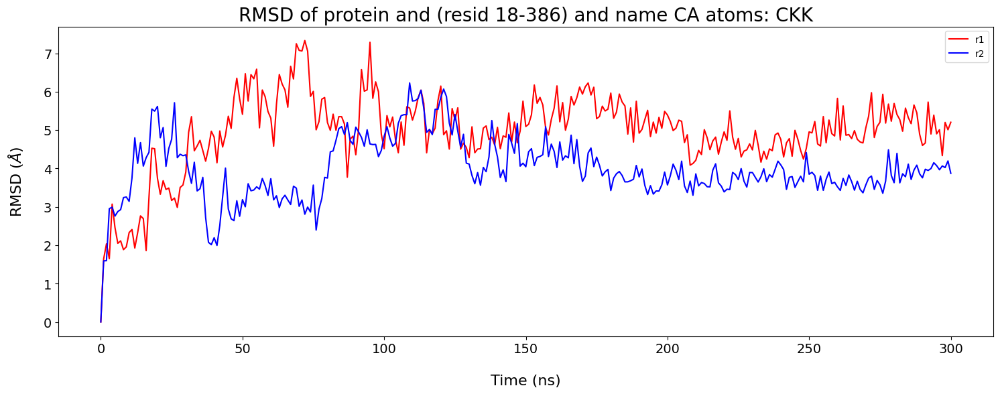

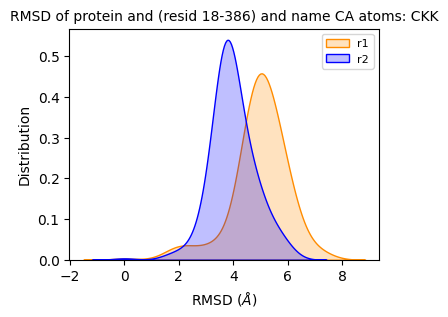

In [82]:
rmsd_plot_2reps_mda(CKK_univs[0], CKK_univs[1], select_CKK, 'CKK')

### M13

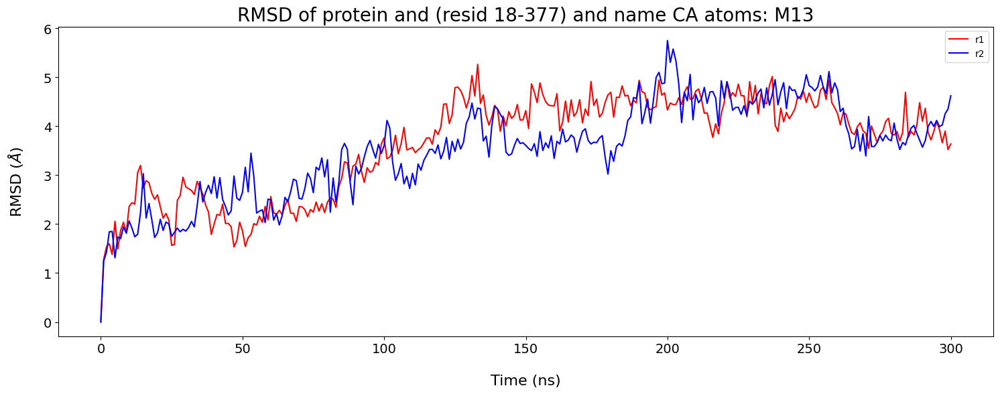

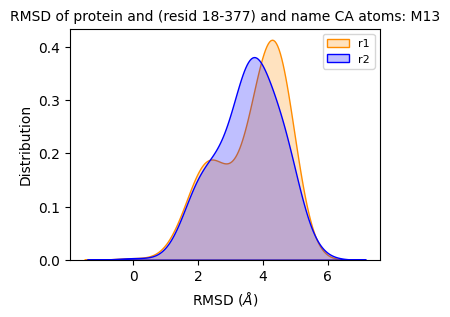

In [83]:
rmsd_plot_2reps_mda(M13_univs[0], M13_univs[1], select_M13, 'M13')

### CKK Ca2+

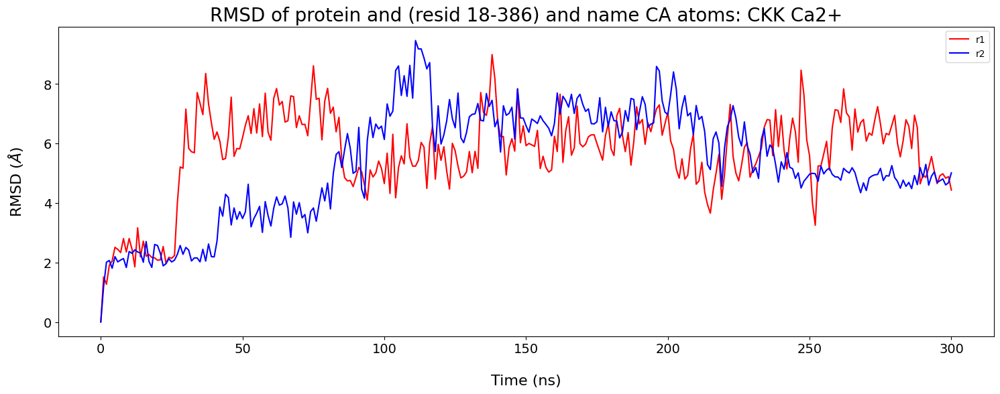

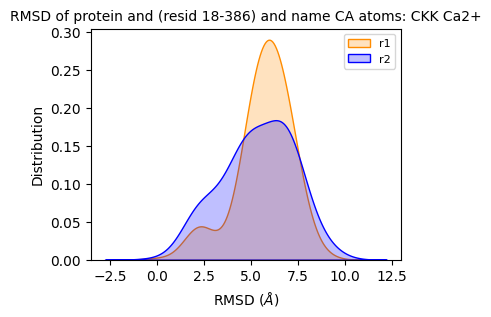

In [84]:
rmsd_plot_2reps_mda(CKK_ca2_univs[0], CKK_ca2_univs[1], select_CKK, 'CKK Ca2+')

### M13 Ca2+

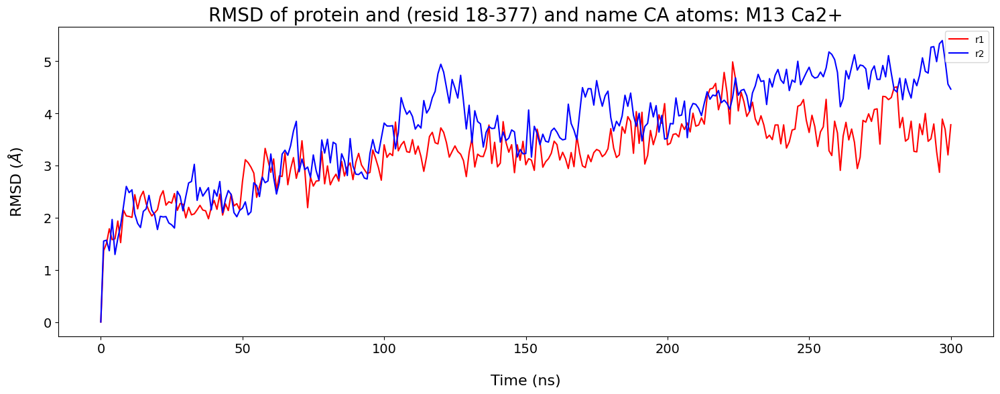

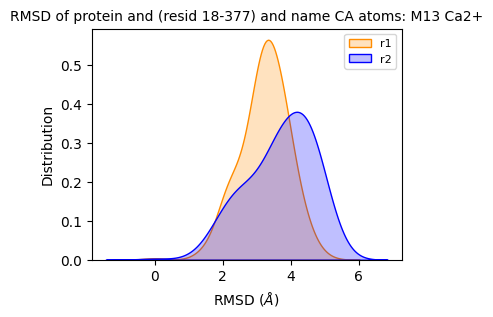

In [85]:
rmsd_plot_2reps_mda(M13_ca2_univs[0], M13_ca2_univs[1], select_M13, 'M13 Ca2+')

### CKK - CKK Ca2+

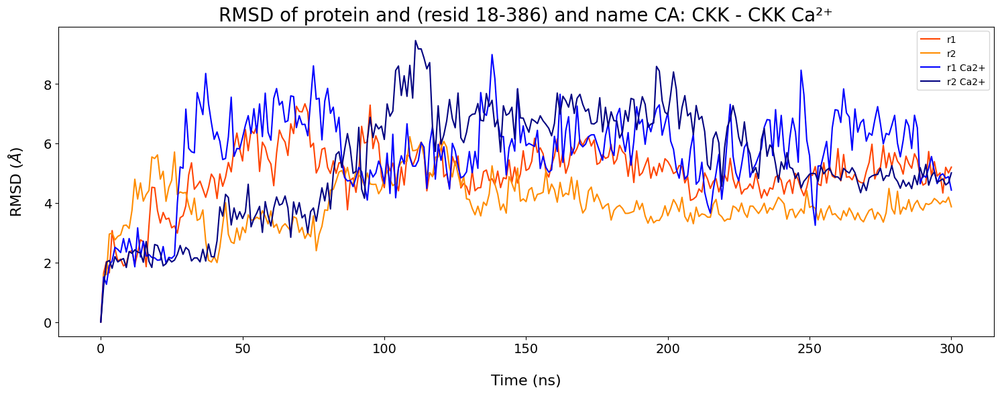

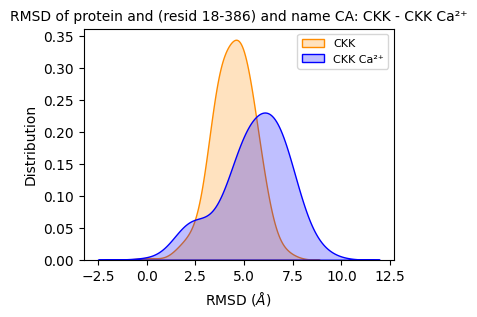

In [13]:
rmsd_plot_4reps_mda(u1= CKK_univs[0], u2= CKK_univs[1], 
                    selection1= select_CKK,
                    u3= CKK_ca2_univs[0], u4= CKK_ca2_univs[1],
                    selection2= select_CKK,
                    twogroupnames= groupnames[0:2])

### M13 - M13 Ca2+

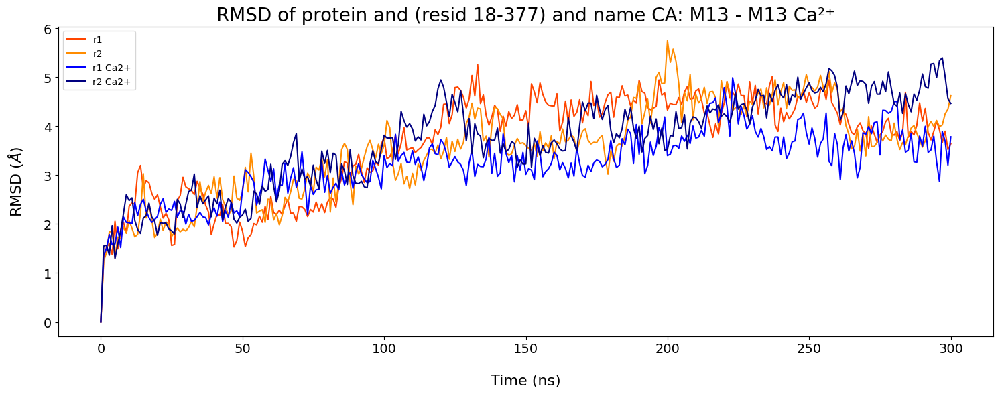

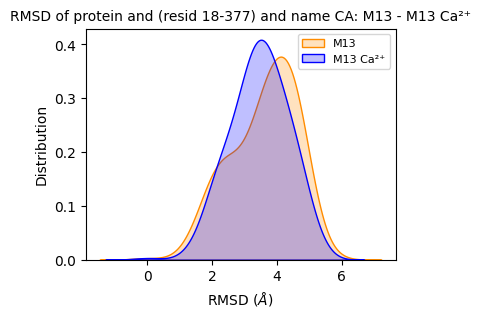

In [14]:
rmsd_plot_4reps_mda(u1= M13_univs[0], u2= M13_univs[1], 
                    selection1= select_M13,
                    u3= M13_ca2_univs[0], u4= M13_ca2_univs[1],
                    selection2= select_M13,
                    twogroupnames= groupnames[2:])

## RMSF

In _highlighted_ plots, N and C termini are hidden, to only show:
- Ile 18 - Leu 386 (CKK)
- Ile 18 - Leu 377 (M13)

Calmodulin highlighted between residues
- 64-240 (CKK)
- 65-231 (M13)

CaM binding peptide highlided between residues 
- 144-169 (CKK)
- 144-160 (M13)     
        

In [77]:
class RMSFPlotter:
    def __init__(self, datadir, outdir):
        self.datadir = datadir
        self.outdir = outdir

    def import_xvg(self, filename, x_column=0 , y_column=1):
        x, y = [], []
        with open(filename) as f:
            for line in f:
                cols = line.split()
                try:
                    x.append(float(cols[x_column]))
                    y.append(float(cols[y_column]))
                except: pass
        return np.array(x),np.array(y)
    
    def two_reps(self, group, groupname):
        filename1 = f'{self.datadir}/{group}/r1/rmsf_r1_init_ca.xvg'
        x1, y1 = self.import_xvg(filename1)
        filename2 = f'{self.datadir}/{group}/r2/rmsf_r2_init_ca.xvg'
        x2, y2 = self.import_xvg(filename2)

        # Plot data
        fig = plt.figure(figsize=[18, 6])
        ax1 = fig.add_subplot(111)
        ax1.set_title(f"RMSF of CA atoms: {groupname}", fontsize=20)
        ax1.set_xlabel('Residue #', fontsize=16, labelpad=20)
        ax1.set_ylabel('RMSF (nm)', fontsize=16, labelpad=20)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)

        ax1.plot(x1, y1, c='r', label='r1')
        ax1.plot(x2, y2, c='b', label='r2')

        leg = ax1.legend()

        fout = f'{self.outdir}/rmsf_{group}_ca'
        plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
        plt.show()
        
    def two_reps_highlight(self, group, groupname):
        filename1 = f'{self.datadir}/{group}/r1/rmsf_r1_init_ca.xvg'
        x1, y1 = self.import_xvg(filename1)
        filename2 = f'{self.datadir}/{group}/r2/rmsf_r2_init_ca.xvg'
        x2, y2 = self.import_xvg(filename2)
        
        # Filter the data to include only values within the range [ile 18, leu 386] (CKK) [ile 18, leu 377] (M13)
        if group.startswith('CKK'): #CKK
            nt, ct= 18, 386
            
        if group.startswith('M13'): #M13
            nt, ct= 18, 377 
            
        x1_filtered, y1_filtered = zip(*[(x, y) for x, y in zip(x1, y1) if nt <= x <= ct])
        x2_filtered, y2_filtered = zip(*[(x, y) for x, y in zip(x2, y2) if nt <= x <= ct])
        
        # Plot data
        fig = plt.figure(figsize=[18, 6])
        ax1 = fig.add_subplot(111)
        ax1.set_title(f"RMSF of CA atoms: {groupname} (Res. {nt}-{ct})", fontsize=20)
        ax1.set_xlabel('Residue #', fontsize=16, labelpad=20)
        ax1.set_ylabel('RMSF (nm)', fontsize=16, labelpad=20)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)

        ax1.plot(x1_filtered, y1_filtered, c='r', label='r1')
        ax1.plot(x2_filtered, y2_filtered, c='b', label='r2')
        

        # Highlight the x-axis range
        if group.startswith('CKK'):
            ax1.axvspan(64, 240, color='red', alpha=0.1, label='CaM')
            ax1.axvspan(144, 169, color='yellow', alpha=0.3, label='CaM binding peptide')
        if group.startswith('M13'):
            ax1.axvspan(65, 231, color='red', alpha=0.1, label='CaM')
            ax1.axvspan(144, 160, color='yellow', alpha=0.3, label='CaM binding peptide')

        leg = ax1.legend()

        fout = f'{self.outdir}/rmsf_{group}_ca_highlight'
        plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
        plt.show()
    
        
    def four_reps(self, twogroups: list, twogroupnames: list):
        if len(twogroups) != 2:
            raise ValueError("twogroups must be a list containing exactly two group names.")
            
        if twogroups[0][:3] != twogroups[1][:3]:
            raise ValueError('twogroups must belong to the same group category')

        filename = f'{self.datadir}/{twogroups[0]}/r1/rmsf_r1_init_ca.xvg'
        x1,y1=self.import_xvg(filename)
        filename = f'{self.datadir}/{twogroups[0]}/r2/rmsf_r2_init_ca.xvg'
        x2,y2=self.import_xvg(filename)
        
        filename = f'{self.datadir}/{twogroups[1]}/r1/rmsf_r1_init_ca.xvg'
        x3,y3=self.import_xvg(filename)
        filename = f'{self.datadir}/{twogroups[1]}/r2/rmsf_r2_init_ca.xvg'
        x4,y4=self.import_xvg(filename)
        
        #plot data
        fig = plt.figure(figsize=[18,6])
        ax1 = fig.add_subplot(111)
        ax1.set_title(f"RMSF of CA atoms: {twogroupnames[0]} - {twogroupnames[1]}", fontsize=20)    
        ax1.set_xlabel('Residue #', fontsize=16, labelpad=20)
        ax1.set_ylabel('RMSF (nm)', fontsize=16, labelpad=20)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        
        ax1.plot(x1,y1,c='orangered',label=f'{twogroupnames[0]} r1')
        ax1.plot(x2,y2,c='darkorange',label=f'{twogroupnames[0]} r2')
        ax1.plot(x3,y3,c='b',label=f'{twogroupnames[1]} r1')
        ax1.plot(x4,y4,c='navy',label=f'{twogroupnames[1]} r2')
        
        leg = ax1.legend()
         
        #plt.grid()
        fout= f'{self.outdir}/rmsf_{twogroups[0]}-{twogroups[1]}_ca'
        plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
        plt.show()   
        
    def four_reps_highlight(self, twogroups: list, twogroupnames: list):
        if len(twogroups) != 2:
            raise ValueError('twogroups must be a list containing exactly two group names.')
            
        if twogroups[0][:3] != twogroups[1][:3]:
            raise ValueError('twogroups must belong to the same group category')

        filename = f'{self.datadir}/{twogroups[0]}/r1/rmsf_r1_init_ca.xvg'
        x1,y1=self.import_xvg(filename)
        filename = f'{self.datadir}/{twogroups[0]}/r2/rmsf_r2_init_ca.xvg'
        x2,y2=self.import_xvg(filename)
        
        filename = f'{self.datadir}/{twogroups[1]}/r1/rmsf_r1_init_ca.xvg'
        x3,y3=self.import_xvg(filename)
        filename = f'{self.datadir}/{twogroups[1]}/r2/rmsf_r2_init_ca.xvg'
        x4,y4=self.import_xvg(filename)
        
        # Filter the data to include only values within the range [ile 18, leu 386] (CKK) [ile 18, leu 377] (M13)
        if twogroups[0].startswith('CKK'):
            nt, ct= 18, 386
            
        if twogroups[0].startswith('M13'):
            nt, ct= 18, 377 
            
        x1_filtered, y1_filtered = zip(*[(x, y) for x, y in zip(x1, y1) if nt <= x <= ct])
        x2_filtered, y2_filtered = zip(*[(x, y) for x, y in zip(x2, y2) if nt <= x <= ct])
        x3_filtered, y3_filtered = zip(*[(x, y) for x, y in zip(x3, y3) if nt <= x <= ct])
        x4_filtered, y4_filtered = zip(*[(x, y) for x, y in zip(x4, y4) if nt <= x <= ct])
        
        #plot data
        fig = plt.figure(figsize=[18,6])
        ax1 = fig.add_subplot(111)
        ax1.set_title(f"RMSF of CA atoms: {twogroupnames[0]} - {twogroupnames[1]} (Res. {nt}-{ct})", fontsize=20)    
        ax1.set_xlabel('Residue #', fontsize=16, labelpad=20)
        ax1.set_ylabel('RMSF (nm)', fontsize=16, labelpad=20)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        
        ax1.plot(x1_filtered,y1_filtered,c='orangered',label=f'{twogroupnames[0]} r1')
        ax1.plot(x2_filtered,y2_filtered,c='darkorange',label=f'{twogroupnames[0]} r2')
        ax1.plot(x3_filtered,y3_filtered,c='b',label=f'{twogroupnames[1]} r1')
        ax1.plot(x4_filtered,y4_filtered,c='navy',label=f'{twogroupnames[1]} r2')
        
        # Highlight the x-axis range
        if twogroups[0].startswith('CKK'):
            ax1.axvspan(64, 240, color='red', alpha=0.1, label='CaM')
            ax1.axvspan(144, 169, color='yellow', alpha=0.3, label='CaM binding peptide')
        if twogroups[0].startswith('M13'):
            ax1.axvspan(65, 231, color='red', alpha=0.1, label='CaM')
            ax1.axvspan(144, 160, color='yellow', alpha=0.3, label='CaM binding peptide')            
        
        leg = ax1.legend()
         
        #plt.grid()
        fout= f'{self.outdir}/rmsf_{twogroups[0]}-{twogroups[1]}_ca_highlight'
        plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
        plt.show()   

In [78]:
rmsf_plotter= RMSFPlotter(datadir, outdir)

### CKK

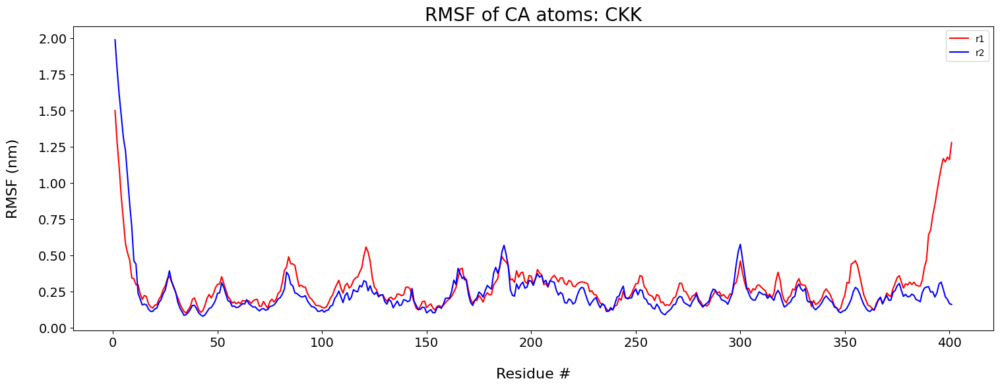

In [63]:
rmsf_plotter.two_reps(groups[0], groupnames[0])

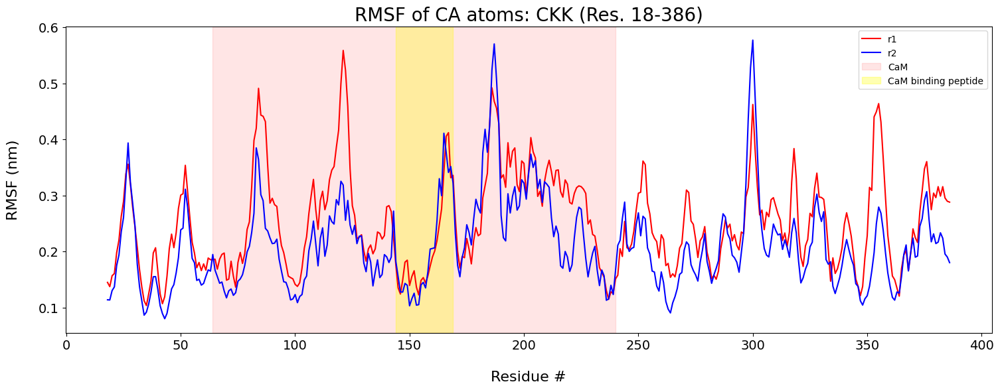

In [64]:
rmsf_plotter.two_reps_highlight(groups[0], groupnames[0])

### CKK Ca2+

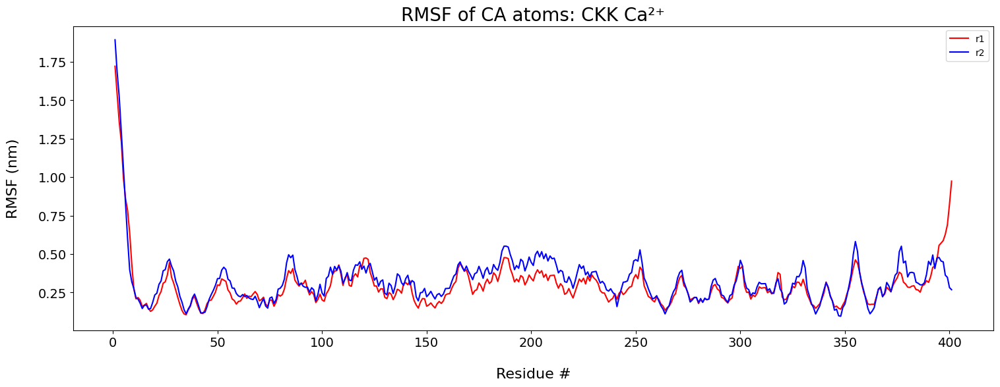

In [65]:
rmsf_plotter.two_reps(groups[1], groupnames[1])

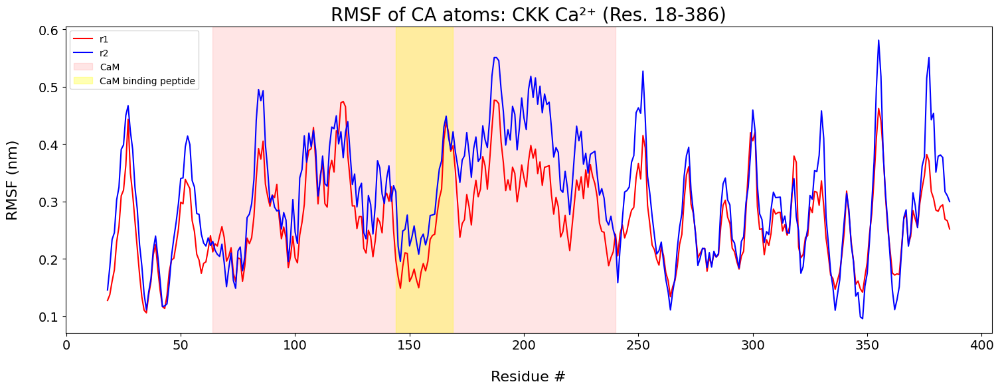

In [66]:
rmsf_plotter.two_reps_highlight(groups[1], groupnames[1])

### CKK-CKK Ca2+

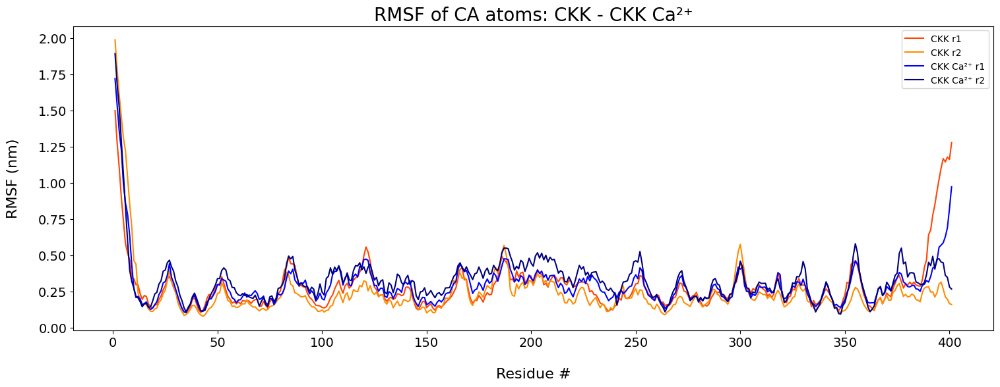

In [67]:
rmsf_plotter.four_reps(groups[0:2], groupnames[0:2])

18 386


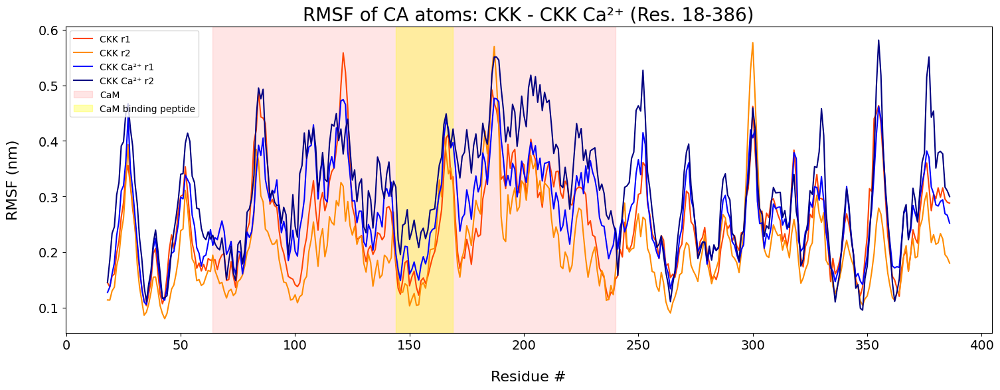

In [68]:
rmsf_plotter.four_reps_highlight(groups[0:2], groupnames[0:2])

### M13

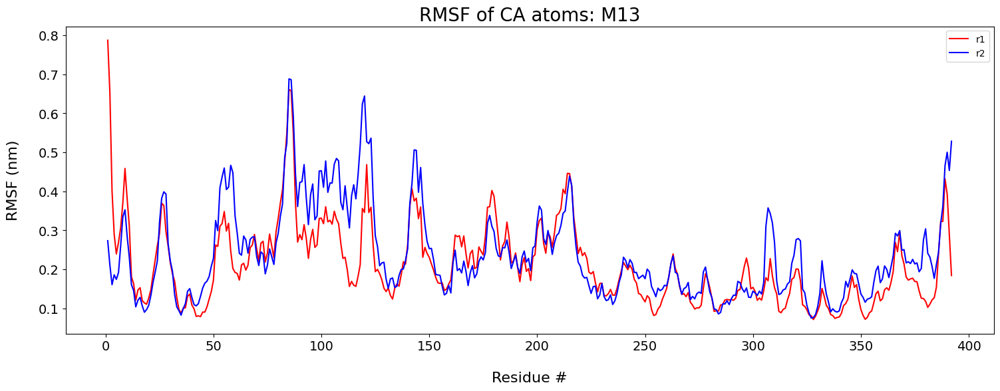

In [69]:
rmsf_plotter.two_reps(groups[2], groupnames[2])

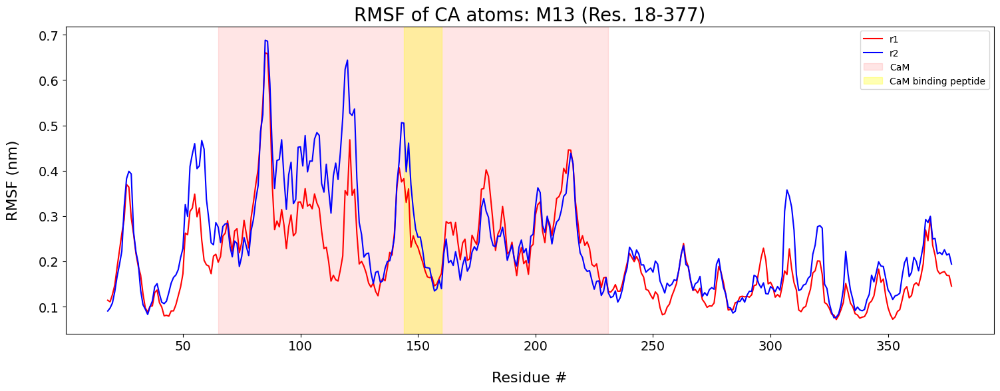

In [70]:
rmsf_plotter.two_reps_highlight(groups[2], groupnames[2])

### M13 Ca2+

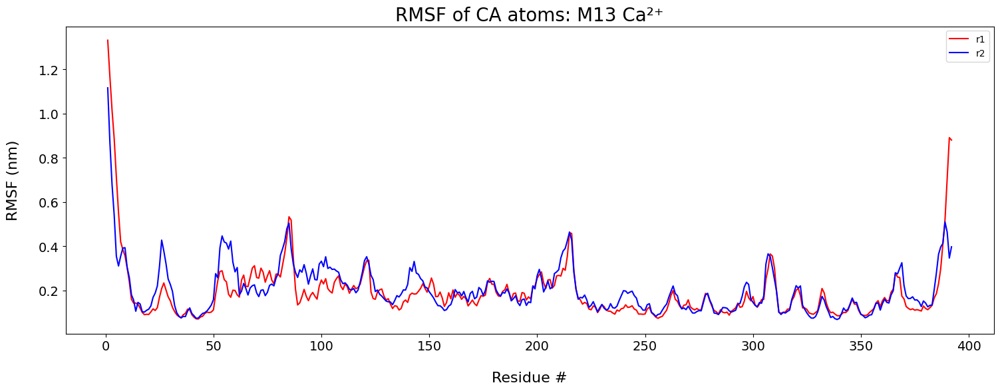

In [71]:
rmsf_plotter.two_reps(groups[3], groupnames[3])

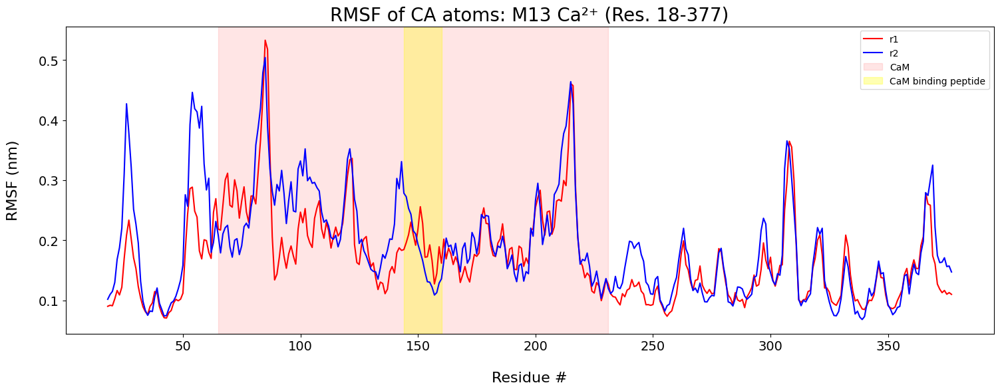

In [72]:
rmsf_plotter.two_reps_highlight(groups[3], groupnames[3])

### M13 - M13 Ca2+

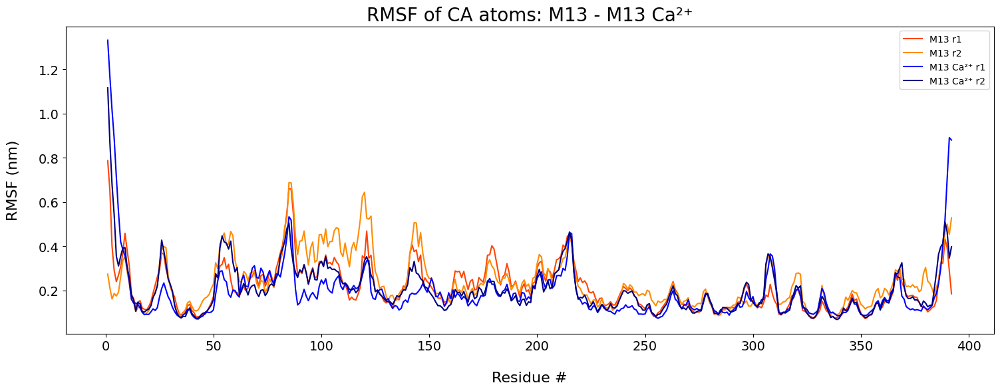

In [73]:
rmsf_plotter.four_reps(groups[2:4], groupnames[2:4])

18 377


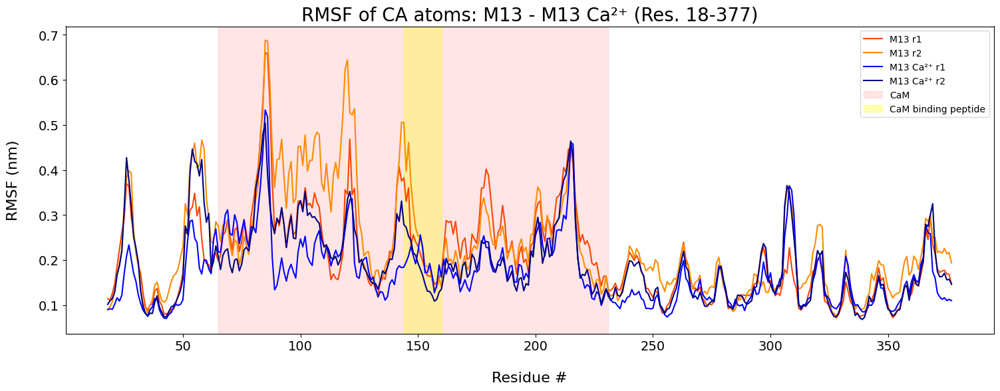

In [74]:
rmsf_plotter.four_reps_highlight(groups[2:4], groupnames[2:4])

## PCA Merged (_Gromacs_)
Whole structure

In [162]:
def var_percentages(group: str):
    """
    returns variance percentages for PCs for a specific merged group, from highest to lowest
    """
    eig_file= f'{datadir}/{group}/merged/eigenval_merged_ca.xvg'
    xr, varr= read_eigenval(eig_file, 0, 1)
    return varr

In [163]:
def plot_eigenvalues(groups: list, groupnames: list):

    if len(groups) != len(groupnames):
        raise ValueError("The number of groups and group names must match.")

    fig, ax1 = plt.subplots(figsize=[18, 6])
    ax1.set_title("Eigenvalues of the covariance matrix CaTEV AC", fontsize=20)
    ax1.set_xlabel('Eigenvector index', fontsize=16, labelpad=20)
    ax1.set_ylabel('(nm\u00b2)', fontsize=16, labelpad=20)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    for group, groupname in zip(groups, groupnames):
        x, y = import_xvg(os.path.join(datadir, f'{group}/merged/eigenval_merged_ca.xvg'), 0, 1)
        ax1.plot(x, y, label=groupname)

    ax1.axis(xmin=0, xmax=40, ymin=0, ymax=40.0)
    leg = ax1.legend()

    fout = os.path.join(outdir, 'eigenvalues_allgroups.png')
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
    plt.show()

### Eigenvalues of the covariance matrix - All groups

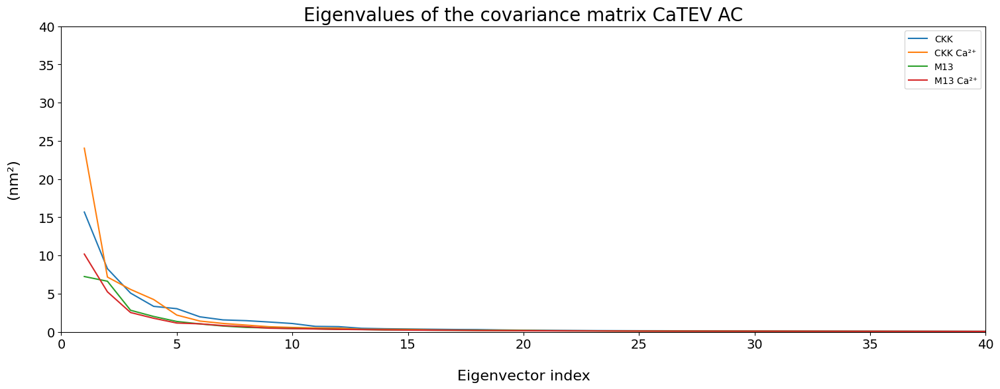

In [164]:
plot_eigenvalues(groups, groupnames)

In [187]:
def plot_PCA(group:str, groupname:str):
    
    #hardcoded for PC1, PC2
    fig=plt.figure(figsize=(10,10))
    filename = f'{datadir}/{group}/merged/2d_merged.xvg'
    x,y=import_xvg(filename,0,1)
    
    allc = [x for x in range(len(x))]
    
    #plt.scatter(x,y,label ='Merged 5-LOX r1 r2 r3', c=allc, cmap='viridis', marker='o')
    plt.scatter(x,y,label =f'{groupname}', c=allc, cmap=plt.cm.get_cmap('plasma', 3))
    
    plt.title(f"2D projection of trajectory - {groupname} ", fontsize=20)
    plt.xlabel(f'PC1 ({var_percentages(group)[0]}%)', fontsize=15)
    plt.ylabel(f'PC2 ({var_percentages(group)[1]}%)', fontsize=15)
    cbar= plt.colorbar(orientation="horizontal", pad=0.1, shrink=0.8, aspect=30)
    cbar.set_label(label='Frame Number', fontsize=10)
    
    #plt.legend(['Merged 5-LOX'])
    fout= f'{outdir}/PCA_merged_{group}.png'
    plt.savefig(fout, facecolor='white', bbox_inches='tight', dpi=300)
    plt.show()
    

### CKK

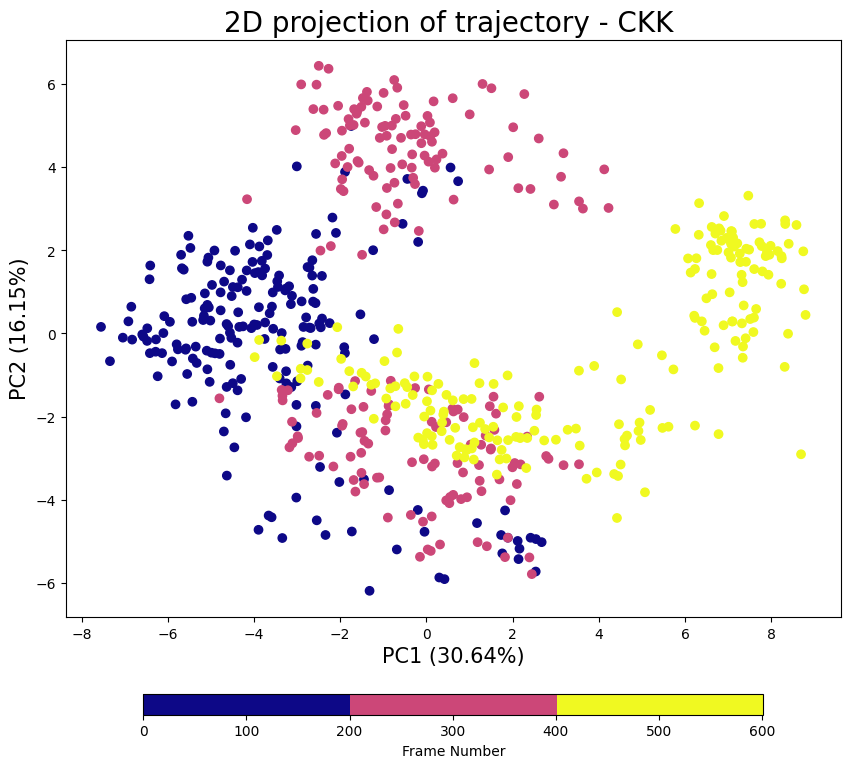

In [188]:
plot_PCA(groups[0], groupnames[0])

### CKK Ca2+

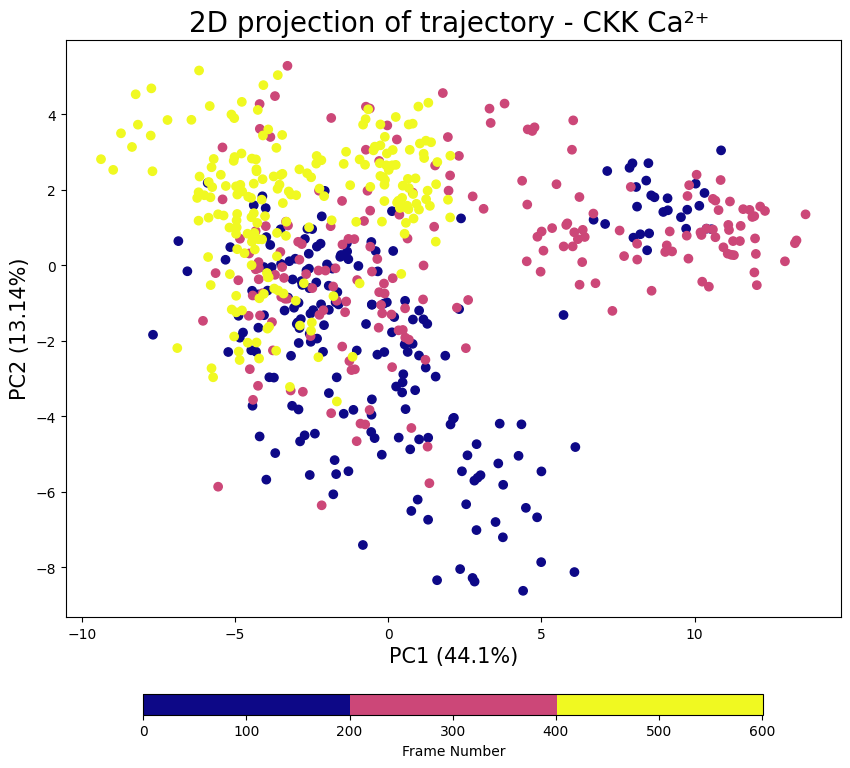

In [190]:
plot_PCA(groups[1], groupnames[1])

### M13

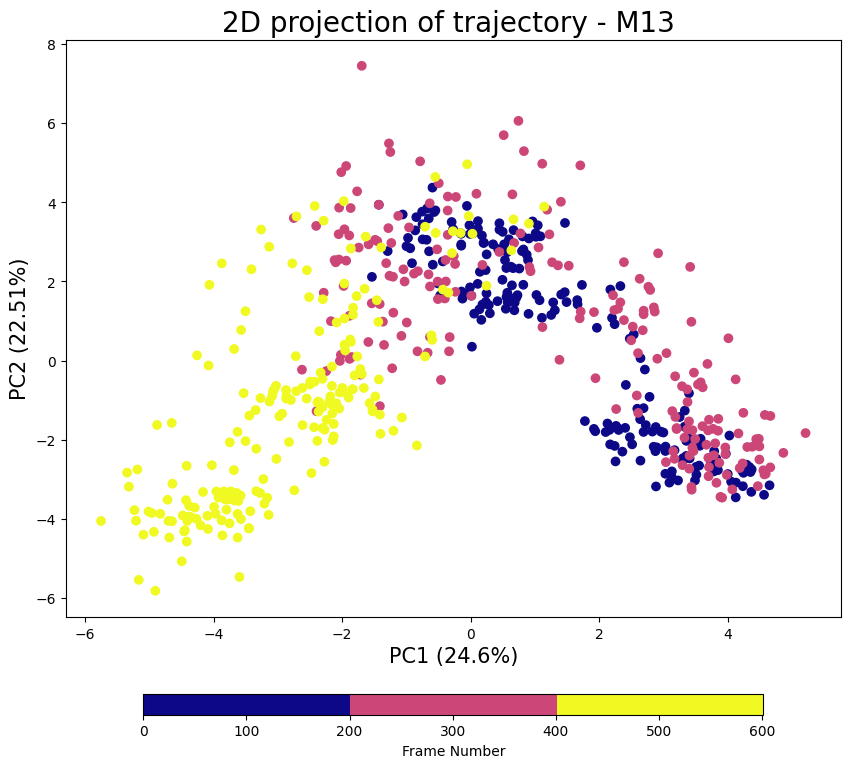

In [189]:
plot_PCA(groups[2], groupnames[2])

### M13 Ca2+

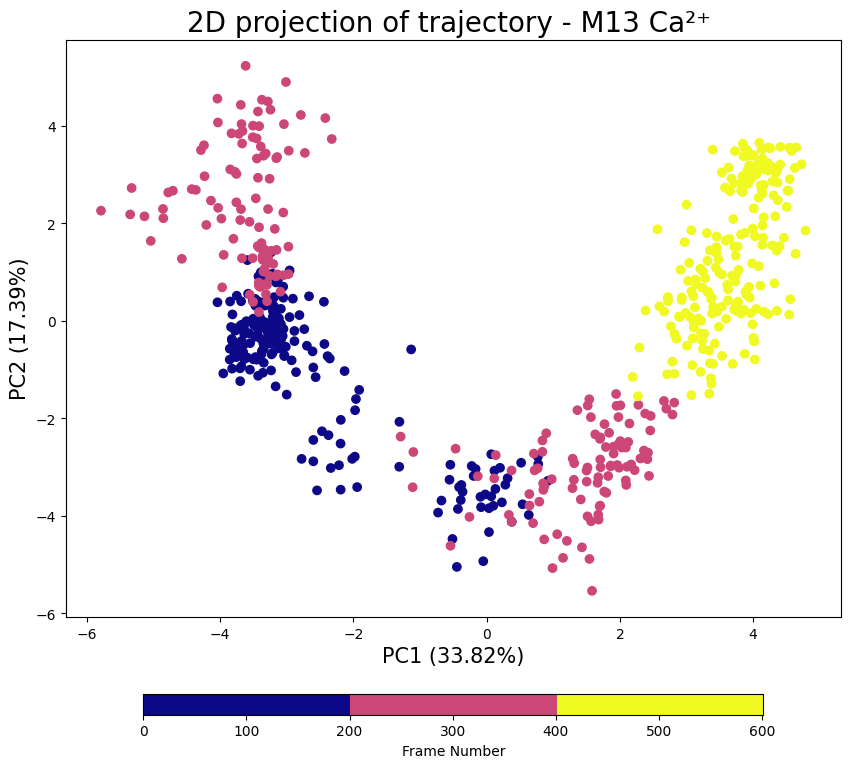

In [191]:
plot_PCA(groups[3], groupnames[3])

## PCA Overlap Ca2+ - not Ca2+ (_MDAnalysis_)
Compute RMSIP between two PC spaces

- N- and C- termini excluded, to only include:

>- Ile 18 - Leu 386 (CKK)
>- Ile 18 - Leu 377 (M13)

- When _frames= None_, all trajectory is considered.

- When _frames= frames_indexes_, first 10 ns of each replica are excluded, to only include:

>- frame 10 to 301
>- frame 311 to 601

In [8]:
def pca_general(u: mda.Universe, select: str, n_components: int = None, frames: np.array = None):
    
    selection= u.select_atoms(select)
    n_selection= len(selection)
    print(f'There are {n_selection} selection atoms in the analysis')
    
    if n_components == None:
        print(f'Calculating PCA for all principal components\n')
    else:
        print(f'Calculating PCA for first {n_components} principal components\n')

    #n_components=None #select all components 
    print ('Aligning to reference structure..')
    aligner= align.AlignTraj(u, u, select=select, in_memory=True).run() #align to reference
    print ('Done\n')
    print ('Performing PCA..')
    
    
    
    if frames is not None:
        print ('Calculating over selected frames!')
        sliced_traj = u.trajectory[frames_list]

        coordinates = np.empty((len(sliced_traj), selection.n_atoms, 3), dtype=np.float32)
        for i, ts in enumerate(sliced_traj):
           coordinates[i] = selection.positions
        u2 = mda.Merge(selection)            # create the protein-only Universe
        u2.load_new(coordinates, format=MemoryReader)
        # the u2 universe now contains the protein with only the frames of interest
        # use the subsampled universe u2 (should also be faster because its in memory)
        
        pca = PCA(u2, select=select, align=False, mean=None, n_components=n_components, verbose=True).run()
        
    else:
        print ('Calculating over all frames!')
        pca= PCA(u, select=select, align=False, mean=None, n_components=n_components, verbose=True).run()
        
        
    print ('Done\n')
    print(f'PCA (eigenvectors x eigenvalues) shape: {pca.results.p_components.shape}\n')
    
    cumu_var= pca.results.cumulated_variance.tolist()
    uncumu_var = [cumu_var[0]] + [cumu_var[i] - cumu_var[i - 1] for i in range(1, len(cumu_var))]
        
    for i in range(10):
        print(f"Cumulated variance PC{i+1}: {pca.results.cumulated_variance[i]:.3f} \t Uncumulated variance PC{i+1}: {uncumu_var[i]:.3f}")
    print ('\n')
       
    x_values = range(1, len(pca.results.cumulated_variance[:10]) + 1)
    y_values = pca.results.cumulated_variance[:10]
    plt.plot(x_values, y_values)
    x_tick_locations = np.arange(1, len(x_values) + 1, 1.00)
    plt.xticks(x_tick_locations)
    plt.xlabel('Principal component')
    plt.ylabel('Cumulative variance')
    
    return (pca, uncumu_var)

In [14]:
""" Frames list to exclude first 10 ns from each replica
"""

range1 = np.arange(10, 301) #include 10 to 300
range2 = np.arange(311, 602) #include 311 to 601
frames_indices = np.concatenate((range1, range2))
frames_list= frames_indices.tolist()

#print(len(range1))
#print(len(range2))
#print(len(frames_indices))
frames_indexes=np.array(frames_list)

### CKK ca2+ - CKK

There are 369 selection atoms in the analysis
Calculating PCA for all principal components

Aligning to reference structure..
Done

Performing PCA..
Calculating over selected frames!


Mean Calculation:   0%|          | 0/582 [00:00<?, ?it/s]

  0%|          | 0/582 [00:00<?, ?it/s]

Done

PCA (eigenvectors x eigenvalues) shape: (1107, 1107)
Cumulated variance PC1: 0.396
Cumulated variance PC2: 0.552
Cumulated variance PC3: 0.658
Cumulated variance PC4: 0.726
Cumulated variance PC5: 0.766
Cumulated variance PC6: 0.792
Cumulated variance PC7: 0.811
Cumulated variance PC8: 0.829
Cumulated variance PC9: 0.844
Cumulated variance PC10: 0.856


Uncumulated variance PC1: 0.396
Uncumulated variance PC2: 0.156
Uncumulated variance PC3: 0.106
Uncumulated variance PC4: 0.068
Uncumulated variance PC5: 0.040
Uncumulated variance PC6: 0.026
Uncumulated variance PC7: 0.019
Uncumulated variance PC8: 0.017
Uncumulated variance PC9: 0.015
Uncumulated variance PC10: 0.013




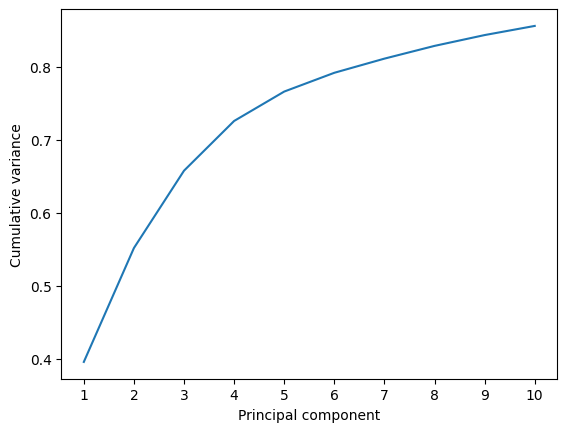

In [32]:
pca_CKK, var_CKK= pca_general(all_merged_univs[0], "protein and (resid 18:386) and name CA", n_components= None, frames= frames_indexes)

There are 369 selection atoms in the analysis
Calculating PCA for all principal components

Aligning to reference structure..
Done

Performing PCA..
Calculating over selected frames!


Mean Calculation:   0%|          | 0/582 [00:00<?, ?it/s]

  0%|          | 0/582 [00:00<?, ?it/s]

Done

PCA (eigenvectors x eigenvalues) shape: (1107, 1107)
Cumulated variance PC1: 0.438
Cumulated variance PC2: 0.593
Cumulated variance PC3: 0.697
Cumulated variance PC4: 0.777
Cumulated variance PC5: 0.812
Cumulated variance PC6: 0.838
Cumulated variance PC7: 0.856
Cumulated variance PC8: 0.871
Cumulated variance PC9: 0.880
Cumulated variance PC10: 0.889


Uncumulated variance PC1: 0.438
Uncumulated variance PC2: 0.156
Uncumulated variance PC3: 0.104
Uncumulated variance PC4: 0.080
Uncumulated variance PC5: 0.035
Uncumulated variance PC6: 0.026
Uncumulated variance PC7: 0.018
Uncumulated variance PC8: 0.015
Uncumulated variance PC9: 0.010
Uncumulated variance PC10: 0.009




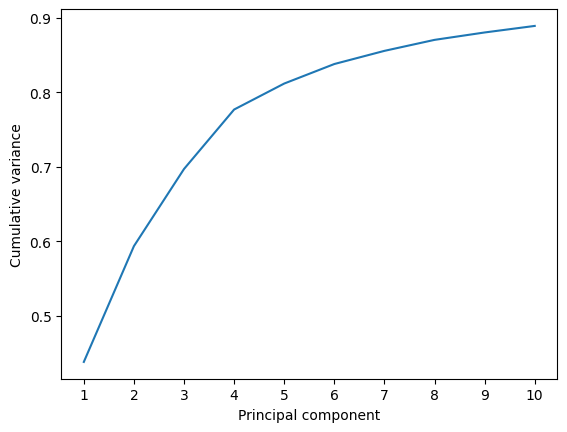

In [34]:
pca_CKK_ca2, var_CKK_ca2= pca_general(all_merged_univs[1], "protein and (resid 18:386) and name CA", n_components=None, frames=frames_indexes)

In [35]:
pca_CKK_ca2.rmsip(pca_CKK,n_components=10)
#mda.analysis.pca.rmsip(pca_CKK.results.p_components.T, pca_CKK_ca2.results.p_components.T, n_components=10)

0.7282016210949511

### CKK r2 ca2+ - CKK

In [61]:
CKK_r2_ca2= mda.Universe(f'/Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r2/step3_input.gro', f'/Volumes/ExFAT/Lab/CaTEV/CKK_ca2+/r2/mdtrj_r2_syst_fit.xtc')

There are 369 selection atoms in the analysis
Calculating PCA for all principal components

Aligning to reference structure..
Done

Performing PCA..


Mean Calculation:   0%|          | 0/301 [00:00<?, ?it/s]

  0%|          | 0/301 [00:00<?, ?it/s]

Done

PCA (eigenvectors x eigenvalues) shape: (1107, 1107)
Cumulated variance PC1: 0.600
Cumulated variance PC2: 0.728
Cumulated variance PC3: 0.832
Cumulated variance PC4: 0.858
Cumulated variance PC5: 0.877
Cumulated variance PC6: 0.890
Cumulated variance PC7: 0.901
Cumulated variance PC8: 0.909
Cumulated variance PC9: 0.916
Cumulated variance PC10: 0.921


Uncumulated variance PC1: 0.600
Uncumulated variance PC2: 0.128
Uncumulated variance PC3: 0.105
Uncumulated variance PC4: 0.026
Uncumulated variance PC5: 0.019
Uncumulated variance PC6: 0.013
Uncumulated variance PC7: 0.012
Uncumulated variance PC8: 0.008
Uncumulated variance PC9: 0.007
Uncumulated variance PC10: 0.006




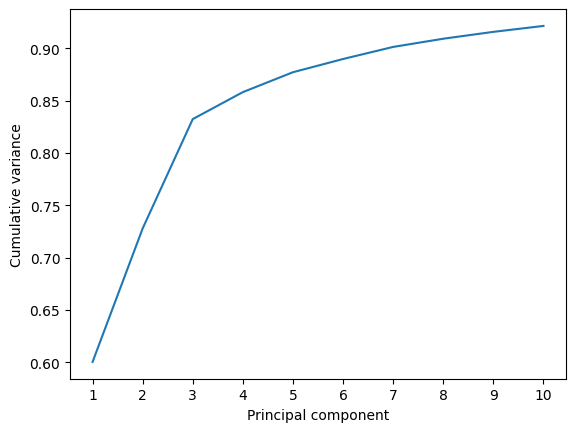

In [261]:
pca_CKK_r2_ca2, var_CKK_r2_ca2= pca(CKK_r2_ca2, "protein and (resid 18:386) and name CA", None)

In [265]:
pca_CKK_r2_ca2.rmsip(pca_CKK,n_components=10)

0.7238906442107682

### M13 ca2+ - M13

There are 360 selection atoms in the analysis
Calculating PCA for all principal components

Aligning to reference structure..
Done

Performing PCA..
Calculating over selected frames!


Mean Calculation:   0%|          | 0/582 [00:00<?, ?it/s]

  0%|          | 0/582 [00:00<?, ?it/s]

Done

PCA (eigenvectors x eigenvalues) shape: (1080, 1080)
Cumulated variance PC1: 0.255
Cumulated variance PC2: 0.482
Cumulated variance PC3: 0.582
Cumulated variance PC4: 0.650
Cumulated variance PC5: 0.698
Cumulated variance PC6: 0.731
Cumulated variance PC7: 0.754
Cumulated variance PC8: 0.774
Cumulated variance PC9: 0.792
Cumulated variance PC10: 0.807


Uncumulated variance PC1: 0.255
Uncumulated variance PC2: 0.227
Uncumulated variance PC3: 0.100
Uncumulated variance PC4: 0.068
Uncumulated variance PC5: 0.048
Uncumulated variance PC6: 0.033
Uncumulated variance PC7: 0.023
Uncumulated variance PC8: 0.020
Uncumulated variance PC9: 0.018
Uncumulated variance PC10: 0.015




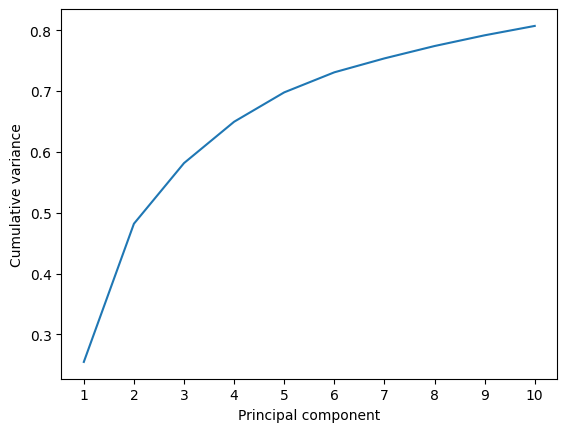

In [36]:
pca_M13, var_M13= pca_general(all_merged_univs[2], "protein and (resid 18:377) and name CA", n_components=None, frames=frames_indexes)

There are 360 selection atoms in the analysis
Calculating PCA for all principal components

Aligning to reference structure..
Done

Performing PCA..
Calculating over selected frames!


Mean Calculation:   0%|          | 0/582 [00:00<?, ?it/s]

  0%|          | 0/582 [00:00<?, ?it/s]

Done

PCA (eigenvectors x eigenvalues) shape: (1080, 1080)
Cumulated variance PC1: 0.340
Cumulated variance PC2: 0.508
Cumulated variance PC3: 0.574
Cumulated variance PC4: 0.620
Cumulated variance PC5: 0.658
Cumulated variance PC6: 0.692
Cumulated variance PC7: 0.723
Cumulated variance PC8: 0.748
Cumulated variance PC9: 0.767
Cumulated variance PC10: 0.782


Uncumulated variance PC1: 0.340
Uncumulated variance PC2: 0.168
Uncumulated variance PC3: 0.066
Uncumulated variance PC4: 0.046
Uncumulated variance PC5: 0.038
Uncumulated variance PC6: 0.034
Uncumulated variance PC7: 0.031
Uncumulated variance PC8: 0.024
Uncumulated variance PC9: 0.020
Uncumulated variance PC10: 0.015




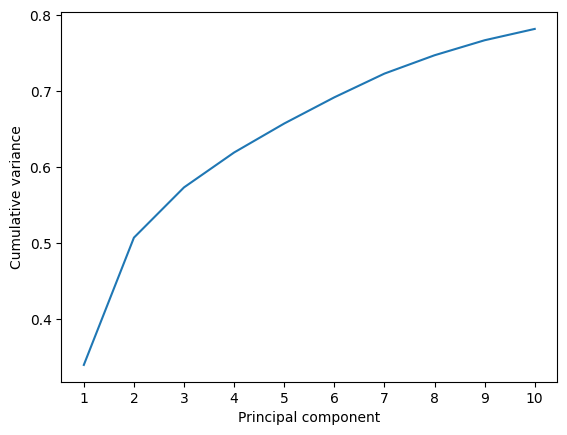

In [38]:
pca_M13_ca2, var_M13_ca2= pca_general(all_merged_univs[3], "protein and (resid 18:377) and name CA", None, frames=frames_indexes)

In [39]:
pca_M13_ca2.rmsip(pca_M13,n_components=10)

0.6871227514173835

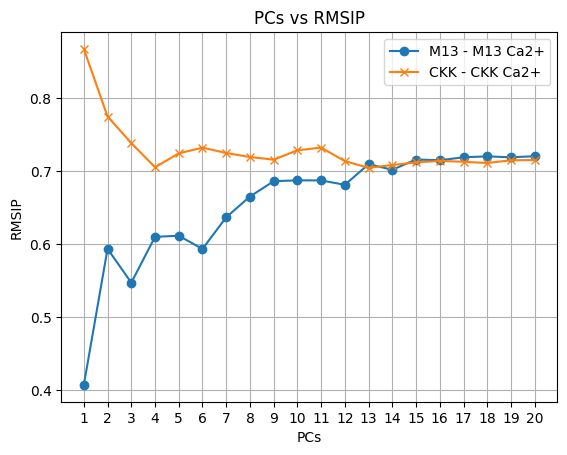

In [40]:
i_values, m13_values, ckk_values = [], [], []


for i in range(1, 21):
    m13 = pca_M13_ca2.rmsip(pca_M13, n_components=i)
    ckk = pca_CKK_ca2.rmsip(pca_CKK, n_components=i)
    
    i_values.append(i)
    m13_values.append(m13)
    ckk_values.append(ckk)

plt.plot(i_values, m13_values, marker='o', label='M13 - M13 Ca2+')
plt.plot(i_values, ckk_values, marker='x', label='CKK - CKK Ca2+')
plt.xlabel('PCs')
x_ticks= np.arange(1, len(i_values)+1, 1)
plt.xticks(x_ticks)
plt.ylabel('RMSIP')
plt.title('PCs vs RMSIP')
plt.grid(True)
plt.legend()

plt.show()

## PCA Projections

Project trajectories on a merged Ca2+ - not Ca2+ pc space

In [9]:
def univ_selector (universe: mda.Universe, selection:str):
    """selects a part of the universe and appends its own trajectory to it
    """
    selected_atoms = universe.select_atoms(selection)
    
    new_universe = mda.Universe.empty(n_atoms=len(selected_atoms))
    new_universe.atoms = selected_atoms
    new_universe.trajectory = universe.trajectory
    
    return new_universe

In [10]:
""" extract PC extreme conformations
"""
def extract_conf(projection: np.ndarray, n_PC: int, universe_to_extract_pdb: mda.Universe, universe_name: str):
    
    u=universe_to_extract_pdb
    df = pd.DataFrame(projection[:, (n_PC-1)], columns=[f'PC{n_PC}'])
    df['Time (ps)'] = df.index * u_M13_merged.trajectory.dt
    
    #determine lowest frame index and value
    index_of_lowest_pc = df[f'PC{n_PC}'].idxmin()
    lowest_pc_value = df[f'PC{n_PC}'].min()
    print(f"0-based index of frame with the lowest PC{n_PC} value:", index_of_lowest_pc)
    print(f"Lowest PC{n_PC} value:", lowest_pc_value)
    
    #export lowest extreme pdb
    u.trajectory[index_of_lowest_pc]
    protein=u.select_atoms("protein")
    with mda.Writer(f"{outdir}/{universe_name}_extreme_PC{n_PC}_low.pdb") as pdb:
        pdb.write(protein)
    
    #determine highest frame index and value
    index_of_highest_pc = df[f'PC{n_PC}'].idxmax()
    highest_pc_value = df[f'PC{n_PC}'].max()
    print(f"0-based index of frame with the highest PC{n_PC} value:", index_of_highest_pc)
    print(f"Highest PC{n_PC} value:", highest_pc_value)
    
    #export highest extreme pdb
    u.trajectory[index_of_highest_pc]
    protein=u.select_atoms("protein")
    with mda.Writer(f"{outdir}/{universe_name}_extreme_PC{n_PC}_high.pdb") as pdb:
        pdb.write(protein)

### CKK

In [11]:
"Create system-merged universe"

pdb1=f'{workdir}/CKK/merged/mdstr_step3_input_prot.gro'
xtc1=f'{workdir}/CKK/merged/mdtrj_merged_prot_fit.xtc'
xtc2=f'{workdir}/CKK_ca2+/merged/mdtrj_merged_prot_fit.xtc'

u_CKK_merged = mda.Universe(pdb1, [xtc1, xtc2])

There are 369 selection atoms in the analysis
Calculating PCA for all principal components

Aligning to reference structure..
Done

Performing PCA..
Calculating over all frames!


Mean Calculation:   0%|          | 0/1204 [00:00<?, ?it/s]

  0%|          | 0/1204 [00:00<?, ?it/s]

Done

PCA (eigenvectors x eigenvalues) shape: (1107, 1107)

Cumulated variance PC1: 0.450 	 Uncumulated variance PC1: 0.450
Cumulated variance PC2: 0.584 	 Uncumulated variance PC2: 0.133
Cumulated variance PC3: 0.684 	 Uncumulated variance PC3: 0.101
Cumulated variance PC4: 0.745 	 Uncumulated variance PC4: 0.061
Cumulated variance PC5: 0.795 	 Uncumulated variance PC5: 0.050
Cumulated variance PC6: 0.828 	 Uncumulated variance PC6: 0.033
Cumulated variance PC7: 0.844 	 Uncumulated variance PC7: 0.016
Cumulated variance PC8: 0.858 	 Uncumulated variance PC8: 0.014
Cumulated variance PC9: 0.869 	 Uncumulated variance PC9: 0.011
Cumulated variance PC10: 0.879 	 Uncumulated variance PC10: 0.010




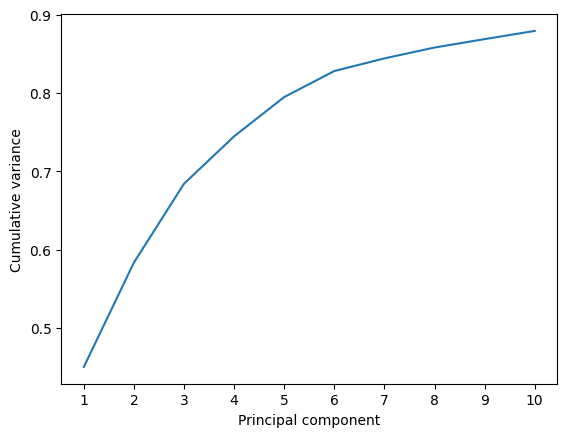

In [12]:
""" Merged PCA space
"""
pca_CKK_merged, var_CKK_merged= pca_general(u_CKK_merged, select= select_CKK)

In [13]:
"""Cross validate with self transformation
"""
sel= u_CKK_merged.select_atoms(select_CKK)
self_project= pca_CKK_merged.transform(sel, n_components=None)
#print (self_project.shape)
#df = pd.DataFrame(self_project, columns=[f'PC{i+1}' for i in range (1107)])
#df['Time (ps)'] = df.index * u_merged.trajectory.dt
#df
#new_df = df.iloc[600:]

"""align, select, and transform universes to project on the merged universe
"""
align.AlignTraj (all_merged_univs[0], u_CKK_merged, select=select_CKK, in_memory=True).run()
new_CKK= univ_selector(all_merged_univs[0], select_CKK)
projection_CKK= pca_CKK_merged.transform(new_CKK, n_components=None)
#print (projection_CKK.shape)
#df = pd.DataFrame(projection_CKK, columns=[f'PC{i+1}' for i in range (1107)])
#df['Time (ps)'] = df.index * u_merged.trajectory.dt
#df

align.AlignTraj (all_merged_univs[1], u_CKK_merged, select=select_CKK, in_memory=True).run()
new_CKK_ca= univ_selector(all_merged_univs[1], select_CKK)
projection_CKK_ca2= pca_CKK_merged.transform(new_CKK_ca, n_components=None)
#print (projection_CKK_ca2.shape)

In [53]:
extract_conf(projection=projection_CKK, n_PC=1, universe_to_extract_pdb= CKK_merged_univ, universe_name= 'CKK_merged')
extract_conf(projection=projection_CKK, n_PC=2, universe_to_extract_pdb= CKK_merged_univ, universe_name= 'CKK_merged')

0-based index of frame with the lowest PC1 value: 73
Lowest PC1 value: -39.45878991141343
0-based index of frame with the highest PC1 value: 579
Highest PC1 value: 106.91850717792128
0-based index of frame with the lowest PC2 value: 302
Lowest PC2 value: -35.57174376774584
0-based index of frame with the highest PC2 value: 69
Highest PC2 value: 64.51605992791559


In [54]:
extract_conf(projection=projection_CKK_ca2, n_PC=1, universe_to_extract_pdb= CKK_ca2_merged_univ, universe_name= 'CKK_ca2+_merged')
extract_conf(projection=projection_CKK_ca2, n_PC=2, universe_to_extract_pdb= CKK_ca2_merged_univ, universe_name= 'CKK_ca2+_merged')

0-based index of frame with the lowest PC1 value: 412
Lowest PC1 value: -106.95829685112771
0-based index of frame with the highest PC1 value: 317
Highest PC1 value: 83.29356630415239
0-based index of frame with the lowest PC2 value: 352
Lowest PC2 value: -64.61164243977014
0-based index of frame with the highest PC2 value: 138
Highest PC2 value: 37.05911646411712


Extremes:

- PC1 high: CKK
- PC1 low: CKK_ca2+
- PC2 high: CKK
- PC2 low: CKK_ca2+

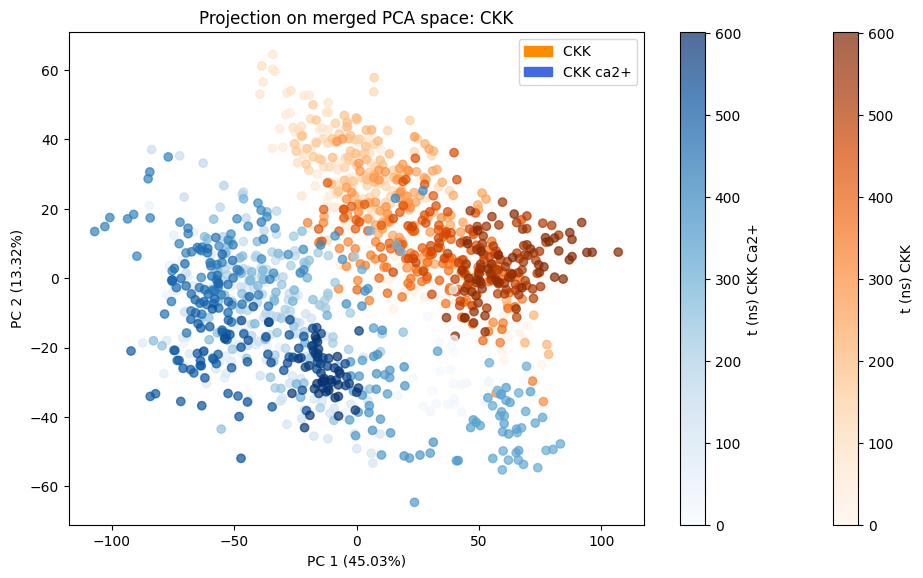

In [15]:
column1_CKK = projection_CKK[:, 0]  # Assuming column 1 is at index 0
column2_CKK = projection_CKK[:, 1]  # Assuming column 2 is at index 1

column1_CKK_ca = projection_CKK_ca2[:, 0]  # Assuming column 1 is at index 0
column2_CKK_ca = projection_CKK_ca2[:, 1]  # Assuming column 2 is at index 1

plt.figure(figsize=(10, 6))

scatter_CKK = plt.scatter(column1_CKK, column2_CKK, c=np.arange(len(column1_CKK)), cmap="Oranges", label='CKK ', alpha=0.7)

scatter_CKK_ca = plt.scatter(column1_CKK_ca, column2_CKK_ca, c=np.arange(len(column1_CKK_ca)), cmap="Blues", label='CKK ca2+', alpha=0.7)

cbar_CKK = plt.colorbar(scatter_CKK, label='t (ns) CKK')
cbar_CKK_ca = plt.colorbar(scatter_CKK_ca, label='t (ns) CKK Ca2+')

plt.xlabel(f'PC 1 ({var_CKK_merged[0] * 100:.2f}%)')
plt.ylabel(f'PC 2 ({var_CKK_merged[1] * 100:.2f}%)')
plt.title('Projection on merged PCA space: CKK')

orange_patch = mpatches.Patch(color='darkorange', label='CKK ')
blue_patch = mpatches.Patch(color='royalblue', label='CKK ca2+')
plt.legend(handles=[orange_patch, blue_patch])

plt.tight_layout(h_pad=0.0, pad=1.5)

fout = os.path.join(f'{outdir}/pca_proj_CKK_{select_CKK}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

plt.show()

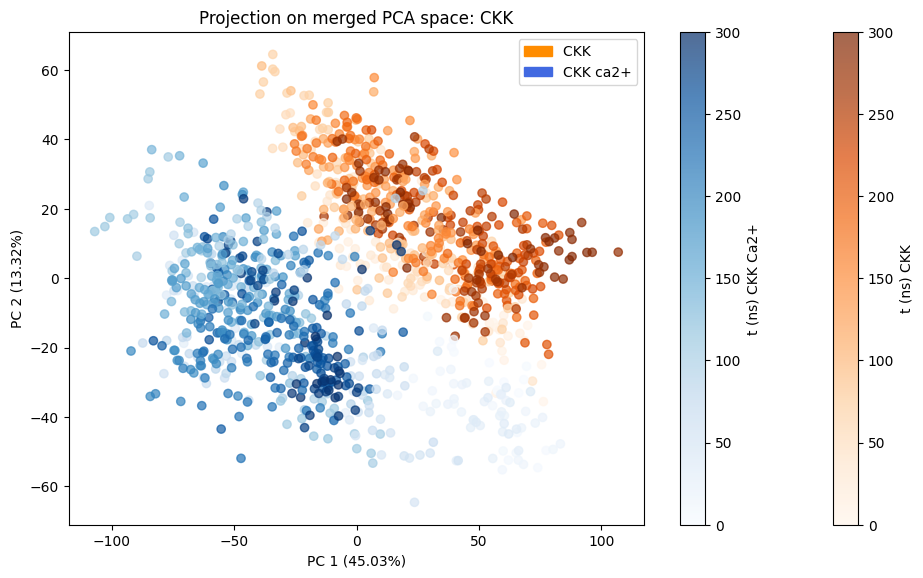

In [16]:
column1_CKK_r1 = projection_CKK[:301, 0]  # Assuming column 1 is at index 0
column1_CKK_r2 = projection_CKK[301:, 0]

column2_CKK_r1 = projection_CKK[:301, 1]  # Assuming column 2 is at index 1
column2_CKK_r2 = projection_CKK[301:, 1]

column1_CKK_ca_r1 = projection_CKK_ca2[:301, 0]  # Assuming column 1 is at index 0
column1_CKK_ca_r2 = projection_CKK_ca2[301:, 0]

column2_CKK_ca_r1 = projection_CKK_ca2[:301, 1]  # Assuming column 2 is at index 1
column2_CKK_ca_r2 = projection_CKK_ca2[301:, 1]


plt.figure(figsize=(10, 6))

scatter_CKK_r1 = plt.scatter(column1_CKK_r1, column2_CKK_r1, c=np.arange(len(column1_CKK_r1)), cmap="Oranges", label='CKK', alpha=0.7)
scatter_CKK_r2 = plt.scatter(column1_CKK_r2, column2_CKK_r2, c=np.arange(len(column1_CKK_r2)), cmap="Oranges", label='CKK', alpha=0.7)


scatter_CKK_ca_r1 = plt.scatter(column1_CKK_ca_r1, column2_CKK_ca_r1, c=np.arange(len(column1_CKK_ca_r1)), cmap="Blues", label='CKK ca2+', alpha=0.7)
scatter_CKK_ca_r2 = plt.scatter(column1_CKK_ca_r2, column2_CKK_ca_r2, c=np.arange(len(column1_CKK_ca_r2)), cmap="Blues", label='CKK ca2+', alpha=0.7)


cbar_CKK = plt.colorbar(scatter_CKK_r1, label='t (ns) CKK')
cbar_CKK_ca = plt.colorbar(scatter_CKK_ca_r1, label='t (ns) CKK Ca2+')

plt.xlabel(f'PC 1 ({var_CKK_merged[0] * 100:.2f}%)')
plt.ylabel(f'PC 2 ({var_CKK_merged[1] * 100:.2f}%)')
plt.title('Projection on merged PCA space: CKK')

orange_patch = mpatches.Patch(color='darkorange', label='CKK ')
blue_patch = mpatches.Patch(color='royalblue', label='CKK ca2+')
plt.legend(handles=[orange_patch, blue_patch])

plt.tight_layout(h_pad=0.0, pad=1.5)

fout = os.path.join(f'{outdir}/pca_proj_time_CKK_{select_CKK}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

plt.show()

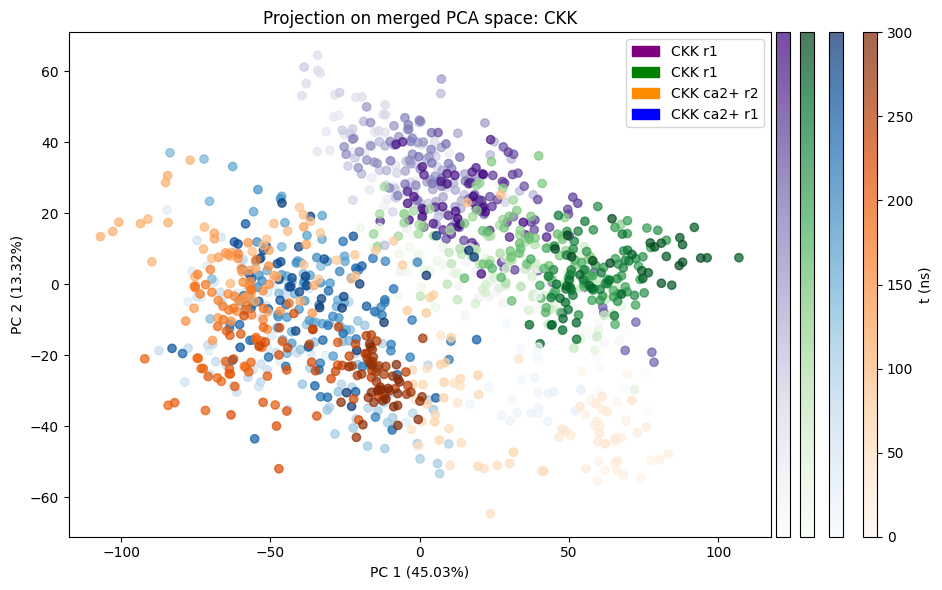

In [20]:
column1_CKK_r1 = projection_CKK[:301, 0]  # Assuming column 1 is at index 0
column1_CKK_r2 = projection_CKK[301:, 0]

column2_CKK_r1 = projection_CKK[:301, 1]  # Assuming column 2 is at index 1
column2_CKK_r2 = projection_CKK[301:, 1]

column1_CKK_ca_r1 = projection_CKK_ca2[:301, 0]  # Assuming column 1 is at index 0
column1_CKK_ca_r2 = projection_CKK_ca2[301:, 0]

column2_CKK_ca_r1 = projection_CKK_ca2[:301, 1]  # Assuming column 2 is at index 1
column2_CKK_ca_r2 = projection_CKK_ca2[301:, 1]

# Set the size of the figure
plt.figure(figsize=(12, 6))  # Adjust the figsize as needed

# Create a grid for the plot and colorbars
gs = plt.GridSpec(1, 3, width_ratios=[10, 1, 1])

# Main plot
ax_main = plt.subplot(gs[0])

# Create scatter plots
scatter_CKK_r1 = ax_main.scatter(column1_CKK_r1, column2_CKK_r1, c=np.arange(len(column1_CKK_r1)), cmap="Purples", label='CKK ', alpha=0.7)
scatter_CKK_r2 = ax_main.scatter(column1_CKK_r2, column2_CKK_r2, c=np.arange(len(column1_CKK_r2)), cmap="Greens", label='CKK ', alpha=0.7)
scatter_CKK_ca_r1 = ax_main.scatter(column1_CKK_ca_r1, column2_CKK_ca_r1, c=np.arange(len(column1_CKK_ca_r1)), cmap="Blues", label='CKK ca2+', alpha=0.7)
scatter_CKK_ca_r2 = ax_main.scatter(column1_CKK_ca_r2, column2_CKK_ca_r2, c=np.arange(len(column1_CKK_ca_r2)), cmap="Oranges", label='CKK ca2+', alpha=0.7)

# Set axis labels and title
ax_main.set_xlabel(f'PC 1 ({var_CKK_merged[0] * 100:.2f}%)')
ax_main.set_ylabel(f'PC 2 ({var_CKK_merged[1] * 100:.2f}%)')
ax_main.set_title('Projection on merged PCA space: CKK')

# Create custom legend
purple_patch = mpatches.Patch(color='purple', label='CKK r1')
green_patch =mpatches.Patch(color='green', label='CKK r1')
blue_patch = mpatches.Patch(color='blue', label='CKK ca2+ r1')
orange_patch = mpatches.Patch(color='darkorange', label='CKK ca2+ r2')
ax_main.legend(handles=[purple_patch, green_patch, orange_patch, blue_patch])

# Colorbars
divider = make_axes_locatable(ax_main)
cax_r1 = divider.append_axes("right", size="2%", pad=0.05)
cax_r2 = divider.append_axes("right", size="2%", pad=0.1)
cax_ca_r1 = divider.append_axes("right", size="2%", pad=0.15)
cax_ca_r2 = divider.append_axes("right", size="2%", pad=0.20)

# Add colorbars
cbar_CKK_r1 = plt.colorbar(scatter_CKK_r1, cax=cax_r1, label='t (ns) CKK r1')
cbar_CKK_r2 = plt.colorbar(scatter_CKK_r2, cax=cax_r2, label='t (ns) CKK r2')
cbar_CKK_ca_r1 = plt.colorbar(scatter_CKK_ca_r1, cax=cax_ca_r1, label='t (ns) CKK Ca2+ r1')
cbar_CKK_ca_r2 = plt.colorbar(scatter_CKK_ca_r2, cax=cax_ca_r2, label='t (ns)')


# Remove the y-axis for the colorbars
cax_r1.yaxis.set_visible(False)
cax_r2.yaxis.set_visible(False)
cax_ca_r1.yaxis.set_visible(False)

plt.tight_layout()

fout = os.path.join(f'{outdir}/pca_proj_timerep_CKK_{select_CKK}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

plt.show()

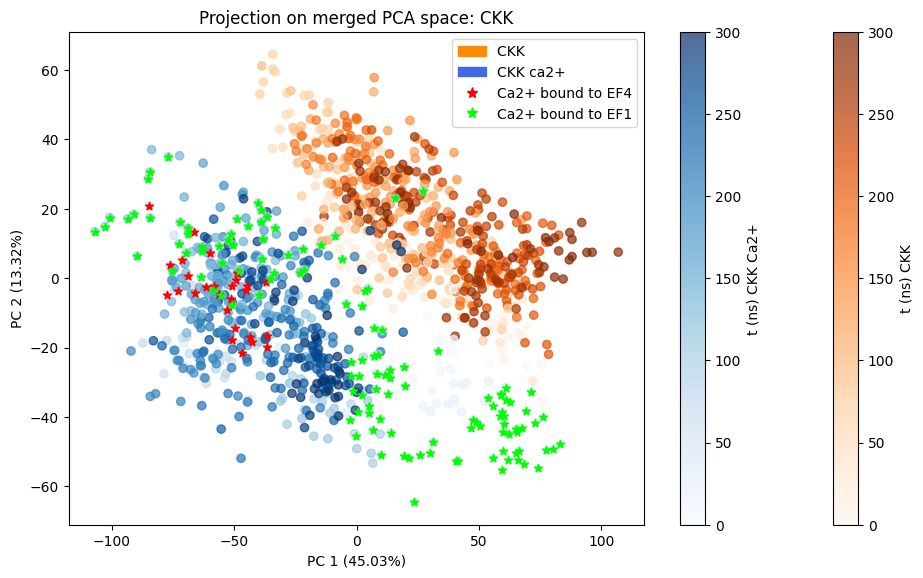

In [21]:
column1_CKK_r1 = projection_CKK[:301, 0]  # Assuming column 1 is at index 0
column1_CKK_r2 = projection_CKK[301:, 0]

column2_CKK_r1 = projection_CKK[:301, 1]  # Assuming column 2 is at index 1
column2_CKK_r2 = projection_CKK[301:, 1]

column1_CKK_ca_full = projection_CKK_ca2[:, 0] # For Ca2+ binding indexing
column1_CKK_ca_r1 = projection_CKK_ca2[:301, 0] 
column1_CKK_ca_r2 = projection_CKK_ca2[301:, 0]

column2_CKK_ca_full = projection_CKK_ca2[:, 1] # For Ca2+ binding indexing
column2_CKK_ca_r1 = projection_CKK_ca2[:301, 1] 
column2_CKK_ca_r2 = projection_CKK_ca2[301:, 1]


plt.figure(figsize=(10, 6))

scatter_CKK_r1 = plt.scatter(column1_CKK_r1, column2_CKK_r1, c=np.arange(len(column1_CKK_r1)), cmap="Oranges", label='CKK', alpha=0.7)
scatter_CKK_r2 = plt.scatter(column1_CKK_r2, column2_CKK_r2, c=np.arange(len(column1_CKK_r2)), cmap="Oranges", label='CKK', alpha=0.7)


scatter_CKK_ca_r1 = plt.scatter(column1_CKK_ca_r1, column2_CKK_ca_r1, c=np.arange(len(column1_CKK_ca_r1)), cmap="Blues", label='CKK ca2+', alpha=0.7)
scatter_CKK_ca_r2 = plt.scatter(column1_CKK_ca_r2, column2_CKK_ca_r2, c=np.arange(len(column1_CKK_ca_r2)), cmap="Blues", label='CKK ca2+', alpha=0.7)
#highlight calcium bound
# Ca2+ binds EF4 in r1 frames 31 - 57 incl.
scatter_CKK_ca_high = plt.scatter(column1_CKK_ca_full[31:58], column2_CKK_ca_full[31:58], c='r', label='Ca2+ bound  to EF4', alpha=1, marker='*')
# Ca2+ binds EF1 in r2 frames 305 - 430 incl.
scatter_CKK_ca_high = plt.scatter(column1_CKK_ca_full[305:430], column2_CKK_ca_full[305:430], c='lime', label='Ca2+ bound to EF1', alpha=1, marker='*')

cbar_CKK = plt.colorbar(scatter_CKK_r1, label='t (ns) CKK')
cbar_CKK_ca = plt.colorbar(scatter_CKK_ca_r1, label='t (ns) CKK Ca2+')

plt.xlabel(f'PC 1 ({var_CKK_merged[0] * 100:.2f}%)')
plt.ylabel(f'PC 2 ({var_CKK_merged[1] * 100:.2f}%)')
plt.title('Projection on merged PCA space: CKK')

orange_patch = mpatches.Patch(color='darkorange', label='CKK ')
blue_patch = mpatches.Patch(color='royalblue', label='CKK ca2+')
high_patch = Line2D([0], [0], marker='*', color='r', label='Ca2+ bound to EF4',
                          markerfacecolor='r', markersize=8, linestyle='None')
high_patch2 = Line2D([0], [0], marker='*', color='lime', label='Ca2+ bound to EF1',
                          markerfacecolor='lime', markersize=8, linestyle='None')
plt.legend(handles=[orange_patch, blue_patch, high_patch, high_patch2])

plt.tight_layout(h_pad=0.0, pad=1.5)

fout = os.path.join(f'{outdir}/pca_proj_timerepca_CKK_{select_CKK}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

plt.show()

In [61]:
pc1 = pca_CKK_merged.p_components[:, 0]
trans1 = self_project[:, 0]
projected = np.outer(trans1, pc1) + pca_CKK_merged.mean.flatten()
coordinates = projected.reshape(len(trans1), -1, 3)
proj1 = mda.Merge(sel)
proj1.load_new(coordinates, order="fac")

<Universe with 369 atoms>

In [141]:
from MDAnalysis.coordinates.PDB import PDBWriter
fout=f'{outdir}/pc1.pdb'
selection= proj1.select_atoms(select_CKK)
with PDBWriter(fout, selection.n_atoms, multiframe=True) as W:
    for ts in proj1.trajectory:
        W.write(selection)

In [19]:
view = nv.show_mdanalysis(proj1.atoms)
view.add_representation("tube")
view

NGLWidget(max_frame=1203)

In [65]:
movie = MovieMaker(
    view,
    step=4,  # keep every 4th frame
    output='pc1.gif',
    #render_params={"factor": 3},  # set to 4 for highest quality
)
movie.make()

IntProgress(value=0, description='Rendering ...', max=150)

In [ ]:
""" Generate movies PC1 PC2 for selected residues in Gromacs
"""
init = 'step3_input'
mini_prefix = 'step4.0_minimization'
equi_prefix = 'step4.1_equilibration'
prod_prefix = 'step5_production'

dirs = ["CKK", "M13"]

for dir in dirs:
    groupdir = os.path.join(workdir, dir)

    os.chdir(groupdir)
    subprocess.run(['gmx', 'covar', '-f', 'mdtrj_merged_prot_fit.xtc', '-s', f'{prod_prefix}.gro', '-o', 'eigenval_merged_ca.xvg', '-tu', 'ns'], input='3 3\n', text=True)
    #subprocess.run(['gmx', 'anaeig', '-v', 'eigenvec.trr', '-f', 'mdtrj_merged_prot_fit.xtc', '-s', f'{prod_prefix}.gro', '-comp', 'eigcomp_merged.xvg', '-rmsf', 
    #                'eigrmsf_merged.xvg', '-2d', '2d_merged.xvg', '-tu', 'ns', '-first', '1', '-last', '2', '-filt', 'filtered_merged.xtc', '-extr', 'extreme_merged_.pdb', 
    #                '-nframes', '10'], input='3 3\n', text=True)

### M13

In [22]:
pdb1=f'{workdir}/M13/merged/mdstr_step3_input_prot.gro'
xtc1=f'{workdir}/M13/merged/mdtrj_merged_prot_fit.xtc'
xtc2=f'{workdir}/M13_ca2+/merged/mdtrj_merged_prot_fit.xtc'

u_M13_merged = mda.Universe(pdb1, [xtc1, xtc2])

There are 360 selection atoms in the analysis
Calculating PCA for all principal components

Aligning to reference structure..
Done

Performing PCA..
Calculating over all frames!


Mean Calculation:   0%|          | 0/1204 [00:00<?, ?it/s]

  0%|          | 0/1204 [00:00<?, ?it/s]

Done

PCA (eigenvectors x eigenvalues) shape: (1080, 1080)

Cumulated variance PC1: 0.214 	 Uncumulated variance PC1: 0.214
Cumulated variance PC2: 0.389 	 Uncumulated variance PC2: 0.175
Cumulated variance PC3: 0.510 	 Uncumulated variance PC3: 0.122
Cumulated variance PC4: 0.595 	 Uncumulated variance PC4: 0.084
Cumulated variance PC5: 0.640 	 Uncumulated variance PC5: 0.045
Cumulated variance PC6: 0.677 	 Uncumulated variance PC6: 0.037
Cumulated variance PC7: 0.704 	 Uncumulated variance PC7: 0.027
Cumulated variance PC8: 0.728 	 Uncumulated variance PC8: 0.024
Cumulated variance PC9: 0.749 	 Uncumulated variance PC9: 0.021
Cumulated variance PC10: 0.768 	 Uncumulated variance PC10: 0.019




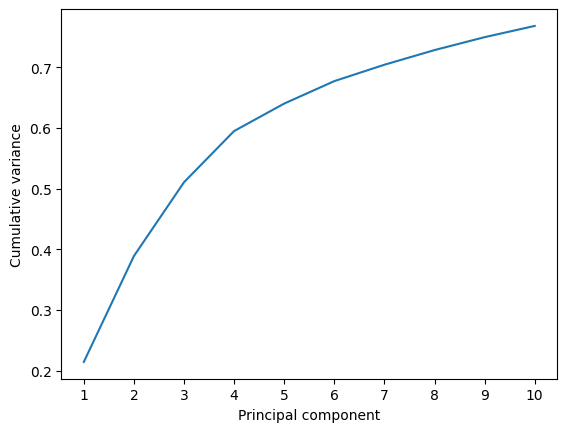

In [23]:
""" Merged PCA space
"""
pca_M13_merged, var_M13_merged= pca_general(u_M13_merged, select= select_M13)

In [24]:
#"""Cross validate with self transformation
#"""
#sel= u_merged.select_atoms(select_CKK)
#self_project= pca_CKK_merged.transform(sel, n_components=None)
#print (self_project.shape)
#df = pd.DataFrame(self_project, columns=[f'PC{i+1}' for i in range (1107)])
#df['Time (ps)'] = df.index * u_merged.trajectory.dt
#df
#new_df = df.iloc[600:]

"""align, select, and transform universes to project on the merged universe
"""
align.AlignTraj (all_merged_univs[2], u_M13_merged, select=select_M13, in_memory=True).run()
new_M13= univ_selector(all_merged_univs[2], select_M13)
projection_M13= pca_M13_merged.transform(new_M13, n_components=None)
#print (projection_M13.shape)
#df = pd.DataFrame(projection_CKK, columns=[f'PC{i+1}' for i in range (1107)])
#df['Time (ps)'] = df.index * u_M13merged.trajectory.dt
#df

align.AlignTraj (all_merged_univs[3], u_M13_merged, select=select_M13, in_memory=True).run()
new_M13_ca= univ_selector(all_merged_univs[3], select_M13)
projection_M13_ca2= pca_M13_merged.transform(new_M13_ca, n_components=None)
#print (projection_M13_ca2.shape)

In [22]:
extract_conf(projection=projection_M13, n_PC=1, universe_to_extract_pdb= M13_merged_univ, universe_name= 'M13_merged')
extract_conf(projection=projection_M13, n_PC=2, universe_to_extract_pdb= M13_merged_univ, universe_name= 'M13_merged')

0-based index of frame with the lowest PC1 value: 316
Lowest PC1 value: -77.88962627686445
0-based index of frame with the highest PC1 value: 501
Highest PC1 value: 40.7214533067626
0-based index of frame with the lowest PC2 value: 354
Lowest PC2 value: -29.977108593262898
0-based index of frame with the highest PC2 value: 563
Highest PC2 value: 58.88259197898467


In [23]:
extract_conf(projection=projection_M13_ca2, n_PC=1, universe_to_extract_pdb= M13_ca2_merged_univ, universe_name= 'M13_ca2+_merged')
extract_conf(projection=projection_M13_ca2, n_PC=2, universe_to_extract_pdb= M13_ca2_merged_univ, universe_name= 'M13_ca2+_merged')

0-based index of frame with the lowest PC1 value: 3
Lowest PC1 value: -53.46627315577415
0-based index of frame with the highest PC1 value: 598
Highest PC1 value: 53.91636204000663
0-based index of frame with the lowest PC2 value: 223
Lowest PC2 value: -54.6001027754267
0-based index of frame with the highest PC2 value: 339
Highest PC2 value: 26.226316066722447


Extremes:

- PC1 high: M13 ca2+
- PC1 low: M13
- PC2 high: M13
- PC2 low: M13 ca2+

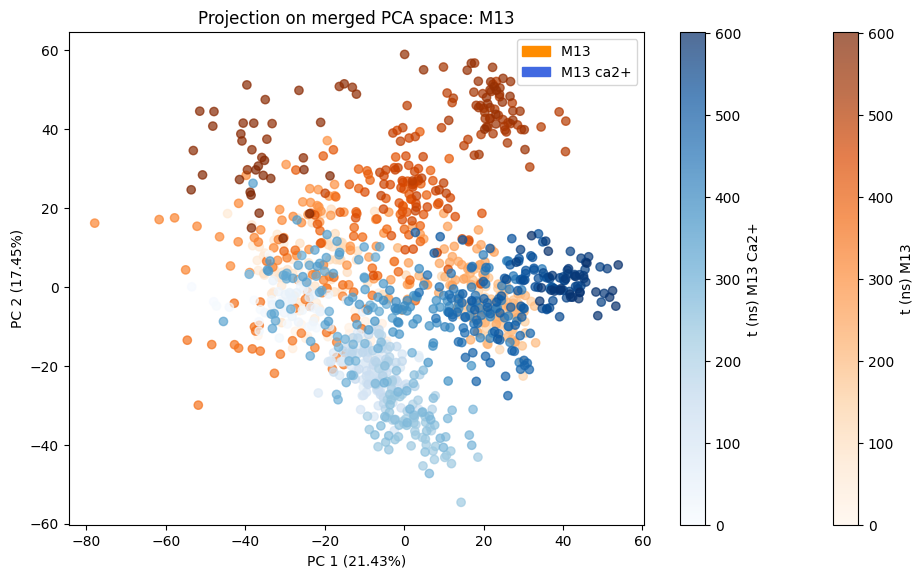

In [25]:
column1_M13 = projection_M13[:, 0]  # Assuming column 1 is at index 0
column2_M13 = projection_M13[:, 1]  # Assuming column 2 is at index 1

column1_M13_ca = projection_M13_ca2[:, 0]  # Assuming column 1 is at index 0
column2_M13_ca = projection_M13_ca2[:, 1]  # Assuming column 2 is at index 1

plt.figure(figsize=(10, 6))

scatter_M13 = plt.scatter(column1_M13, column2_M13, c=np.arange(len(column1_M13)), cmap="Oranges", label='M13 ', alpha=0.7)

scatter_M13_ca = plt.scatter(column1_M13_ca, column2_M13_ca, c=np.arange(len(column1_M13_ca)), cmap="Blues", label='M13 ca2+', alpha=0.7)

cbar_M13 = plt.colorbar(scatter_M13, label='t (ns) M13')
cbar_M13_ca = plt.colorbar(scatter_M13_ca, label='t (ns) M13 Ca2+')

plt.xlabel(f'PC 1 ({var_M13_merged[0] * 100:.2f}%)')
plt.ylabel(f'PC 2 ({var_M13_merged[1] * 100:.2f}%)')
plt.title('Projection on merged PCA space: M13')

orange_patch = mpatches.Patch(color='darkorange', label='M13 ')
blue_patch = mpatches.Patch(color='royalblue', label='M13 ca2+')
plt.legend(handles=[orange_patch, blue_patch])

plt.tight_layout(h_pad=0.0, pad=1.5)

fout = os.path.join(f'{outdir}/pca_proj_M13_{select_M13}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

plt.show()

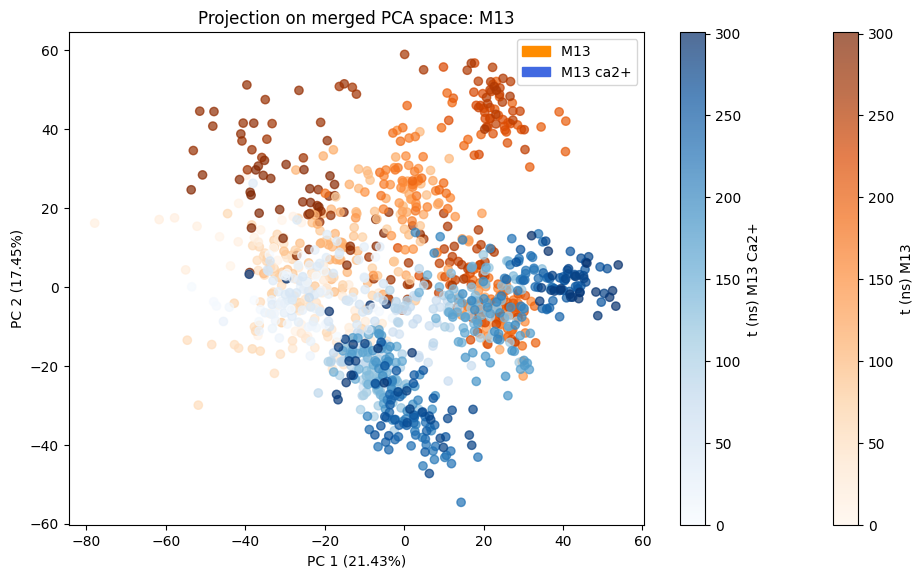

In [26]:
column1_M13_r1 = projection_M13[:302, 0]  # Assuming column 1 is at index 0
column1_M13_r2 = projection_M13[302:, 0]

column2_M13_r1 = projection_M13[:302, 1]  # Assuming column 2 is at index 1
column2_M13_r2 = projection_M13[302:, 1]

column1_M13_ca_r1 = projection_M13_ca2[:302, 0]  # Assuming column 1 is at index 0
column1_M13_ca_r2 = projection_M13_ca2[302:, 0]

column2_M13_ca_r1 = projection_M13_ca2[:302, 1]  # Assuming column 2 is at index 1
column2_M13_ca_r2 = projection_M13_ca2[302:, 1]


plt.figure(figsize=(10, 6))

scatter_M13_r1 = plt.scatter(column1_M13_r1, column2_M13_r1, c=np.arange(len(column1_M13_r1)), cmap="Oranges", label='M13', alpha=0.7)
scatter_M13_r2 = plt.scatter(column1_M13_r2, column2_M13_r2, c=np.arange(len(column1_M13_r2)), cmap="Oranges", label='M13', alpha=0.7)


scatter_M13_ca_r1 = plt.scatter(column1_M13_ca_r1, column2_M13_ca_r1, c=np.arange(len(column1_M13_ca_r1)), cmap="Blues", label='M13 ca2+', alpha=0.7)
scatter_M13_ca_r2 = plt.scatter(column1_M13_ca_r2, column2_M13_ca_r2, c=np.arange(len(column1_M13_ca_r2)), cmap="Blues", label='M13 ca2+', alpha=0.7)


cbar_M13 = plt.colorbar(scatter_M13_r1, label='t (ns) M13')
cbar_M13_ca = plt.colorbar(scatter_M13_ca_r1, label='t (ns) M13 Ca2+')

plt.xlabel(f'PC 1 ({var_M13_merged[0] * 100:.2f}%)')
plt.ylabel(f'PC 2 ({var_M13_merged[1] * 100:.2f}%)')
plt.title('Projection on merged PCA space: M13')

orange_patch = mpatches.Patch(color='darkorange', label='M13 ')
blue_patch = mpatches.Patch(color='royalblue', label='M13 ca2+')
plt.legend(handles=[orange_patch, blue_patch])

plt.tight_layout(h_pad=0.0, pad=1.5)

fout = os.path.join(f'{outdir}/pca_proj_time_M13_{select_M13}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

plt.show()

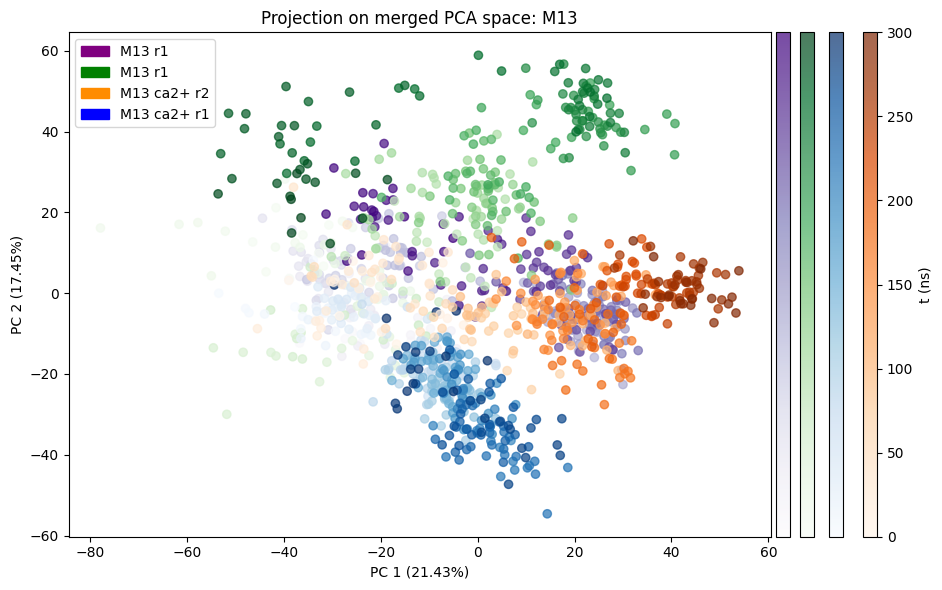

In [27]:
column1_M13_r1 = projection_M13[:301, 0]  # Assuming column 1 is at index 0
column1_M13_r2 = projection_M13[301:, 0]

column2_M13_r1 = projection_M13[:301, 1]  # Assuming column 2 is at index 1
column2_M13_r2 = projection_M13[301:, 1]

column1_M13_ca_r1 = projection_M13_ca2[:301, 0]  # Assuming column 1 is at index 0
column1_M13_ca_r2 = projection_M13_ca2[301:, 0]

column2_M13_ca_r1 = projection_M13_ca2[:301, 1]  # Assuming column 2 is at index 1
column2_M13_ca_r2 = projection_M13_ca2[301:, 1]


# Set the size of the figure
plt.figure(figsize=(12, 6))  # Adjust the figsize as needed

# Create a grid for the plot and colorbars
gs = plt.GridSpec(1, 3, width_ratios=[10, 1, 1])

# Main plot
ax_main = plt.subplot(gs[0])

# Create scatter plots
scatter_M13_r1 = ax_main.scatter(column1_M13_r1, column2_M13_r1, c=np.arange(len(column1_M13_r1)), cmap="Purples", label='M13 ', alpha=0.7)
scatter_M13_r2 = ax_main.scatter(column1_M13_r2, column2_M13_r2, c=np.arange(len(column1_M13_r2)), cmap="Greens", label='M13 ', alpha=0.7)
scatter_M13_ca_r1 = ax_main.scatter(column1_M13_ca_r1, column2_M13_ca_r1, c=np.arange(len(column1_M13_ca_r1)), cmap="Blues", label='M13 ca2+', alpha=0.7)
scatter_M13_ca_r2 = ax_main.scatter(column1_M13_ca_r2, column2_M13_ca_r2, c=np.arange(len(column1_M13_ca_r2)), cmap="Oranges", label='M13 ca2+', alpha=0.7)

# Set axis labels and title
ax_main.set_xlabel(f'PC 1 ({var_M13_merged[0] * 100:.2f}%)')
ax_main.set_ylabel(f'PC 2 ({var_M13_merged[1] * 100:.2f}%)')
ax_main.set_title('Projection on merged PCA space: M13')

# Create custom legend
purple_patch = mpatches.Patch(color='purple', label='M13 r1')
green_patch =mpatches.Patch(color='green', label='M13 r1')
blue_patch = mpatches.Patch(color='blue', label='M13 ca2+ r1')
orange_patch = mpatches.Patch(color='darkorange', label='M13 ca2+ r2')
ax_main.legend(handles=[purple_patch, green_patch, orange_patch, blue_patch])

# Colorbars
divider = make_axes_locatable(ax_main)
cax_r1 = divider.append_axes("right", size="2%", pad=0.05)
cax_r2 = divider.append_axes("right", size="2%", pad=0.1)
cax_ca_r1 = divider.append_axes("right", size="2%", pad=0.15)
cax_ca_r2 = divider.append_axes("right", size="2%", pad=0.20)

# Add colorbars
cbar_M13_r1 = plt.colorbar(scatter_M13_r1, cax=cax_r1, label='t (ns) M13 r1')
cbar_M13_r2 = plt.colorbar(scatter_M13_r2, cax=cax_r2, label='t (ns) M13 r2')
cbar_M13_ca_r1 = plt.colorbar(scatter_M13_ca_r1, cax=cax_ca_r1, label='t (ns) M13 Ca2+ r1')
cbar_M13_ca_r2 = plt.colorbar(scatter_M13_ca_r2, cax=cax_ca_r2, label='t (ns)')


# Remove the y-axis for the colorbars
cax_r1.yaxis.set_visible(False)
cax_r2.yaxis.set_visible(False)
cax_ca_r1.yaxis.set_visible(False)

# Adjust the layout
plt.tight_layout()

fout = os.path.join(f'{outdir}/pca_proj_timerep_M13_{select_M13}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

# Display the plot
plt.show()

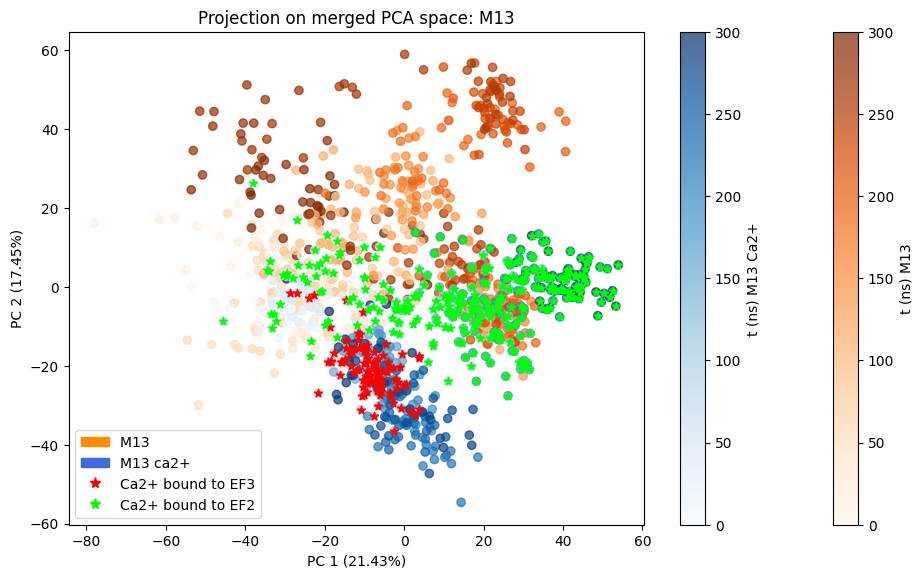

In [28]:
column1_M13_r1 = projection_M13[:301, 0]  # Assuming column 1 is at index 0
column1_M13_r2 = projection_M13[301:, 0]

column2_M13_r1 = projection_M13[:301, 1]  # Assuming column 2 is at index 1
column2_M13_r2 = projection_M13[301:, 1]

column1_M13_ca_full = projection_M13_ca2[:, 0] # For Ca2+ binding indexing
column1_M13_ca_r1 = projection_M13_ca2[:301, 0] 
column1_M13_ca_r2 = projection_M13_ca2[301:, 0]

column2_M13_ca_full = projection_M13_ca2[:, 1] # For Ca2+ binding indexing
column2_M13_ca_r1 = projection_M13_ca2[:301, 1] 
column2_M13_ca_r2 = projection_M13_ca2[301:, 1]


plt.figure(figsize=(10, 6))

scatter_M13_r1 = plt.scatter(column1_M13_r1, column2_M13_r1, c=np.arange(len(column1_M13_r1)), cmap="Oranges", label='M13', alpha=0.7)
scatter_M13_r2 = plt.scatter(column1_M13_r2, column2_M13_r2, c=np.arange(len(column1_M13_r2)), cmap="Oranges", label='M13', alpha=0.7)


scatter_M13_ca_r1 = plt.scatter(column1_M13_ca_r1, column2_M13_ca_r1, c=np.arange(len(column1_M13_ca_r1)), cmap="Blues", label='M13 ca2+', alpha=0.7)
scatter_M13_ca_r2 = plt.scatter(column1_M13_ca_r2, column2_M13_ca_r2, c=np.arange(len(column1_M13_ca_r2)), cmap="Blues", label='M13 ca2+', alpha=0.7)
#highlight calcium bound
#- Ca2+ binds EF3 in r1 > frames 47 - 146
scatter_M13_ca_high = plt.scatter(column1_M13_ca_full[47:146], column2_M13_ca_full[47:146], c='r', label='Ca2+ bound  to EF3', alpha=1, marker='*')
#- Ca2+ binds EF2 in r2 > frames 304 - 602
scatter_M13_ca_high = plt.scatter(column1_M13_ca_full[304:602], column2_M13_ca_full[304:602], c='lime', label='Ca2+ bound to EF2', alpha=1, marker='*')

cbar_M13 = plt.colorbar(scatter_M13_r1, label='t (ns) M13')
cbar_M13_ca = plt.colorbar(scatter_M13_ca_r1, label='t (ns) M13 Ca2+')

plt.xlabel(f'PC 1 ({var_M13_merged[0] * 100:.2f}%)')
plt.ylabel(f'PC 2 ({var_M13_merged[1] * 100:.2f}%)')
plt.title('Projection on merged PCA space: M13')

orange_patch = mpatches.Patch(color='darkorange', label='M13 ')
blue_patch = mpatches.Patch(color='royalblue', label='M13 ca2+')
high_patch = Line2D([0], [0], marker='*', color='r', label='Ca2+ bound to EF3',
                          markerfacecolor='r', markersize=8, linestyle='None')
high_patch2 = Line2D([0], [0], marker='*', color='lime', label='Ca2+ bound to EF2',
                          markerfacecolor='lime', markersize=8, linestyle='None')
plt.legend(handles=[orange_patch, blue_patch, high_patch, high_patch2])

plt.tight_layout(h_pad=0.0, pad=1.5)

fout = os.path.join(f'{outdir}/pca_proj_M13_timerepca_{select_M13}')
_fout= fout.replace(' ','_')
plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')

plt.show()

In [90]:
"""view PC1 motion
"""

sel= u_M13_merged.select_atoms(select_M13)

pc1 = pca_M13_merged.p_components[:, 0]
trans1 = self_project[:, 0]
projected = np.outer(trans1, pc1) + pca_M13_merged.mean.flatten()
coordinates = projected.reshape(len(trans1), -1, 3)
proj1 = mda.Merge(sel)
proj1.load_new(coordinates, order="fac")

view = nv.show_mdanalysis(proj1.atoms)
view.add_representation("tube")
view

NGLWidget(max_frame=1203)

## Salt Bridges
Analysis of VMD Salt Bridges Plugin output:

_A salt bridge is considered to be formed if the distance between any of the oxygen atoms of acidic residues and the nitrogen atoms of basic residues are within the cut-off distance (default 3.2 Angstroms) in at least one frame.
A file is written for each salt bridge, containing the frame number and the distance between the center of mass of the oxygens in the acidic side chain and center of mass of the nitrogens in the basic side chain. Note that this distance is slightly different than the criteria used to identify salt bridges (see above)._

In [192]:
def chord_saltbridges(set_in, set_name):
    # Define your set of connections
    connections = setcleaner(set_in)

    # Convert the set into a list of dictionaries
    data = [{'source': source, 'target': target, 'value': 1} for source, target in connections]

    # Create a DataFrame from the data
    df = pd.DataFrame(data)

    # Load a plotting extension (e.g., 'bokeh' or 'matplotlib')
    hv.extension('bokeh')  # You can also use 'matplotlib' if you prefer

    # Create a Chord diagram using HoloViews
    chord = hv.Chord(df)

    # Customize the appearance (optional)
    chord.opts(
        cmap='Category20',
        edge_cmap='Category20',
        labels='index',
        node_color='index',
        node_size=10,
        width=600,
        height=600,
        title=f'Salt Bridges {set_name}'
    )
    return (chord)
    
def print_saltbridges(refset_in: set, count_refset: list, refset_title: str, 
                      refset_not1: set, set_1_title: str, 
                      refset_not2: set, set_2_title: str, 
                      unique_to_refset: set,
                      specific_res: str = None):
    """ e.g.
    print_saltbridges(wt_set, count_wt_replicas, '5-LO',
                  wt_not_ca, '5-LO CA',
                  wt_not_ph, '5-LO PH',
                  wt_only,
                  'ARG371')
                  """
    
    if not isinstance(refset_in, set):
        raise TypeError("refset_in should be a set")
    if not isinstance(count_refset, list):
        raise TypeError("count_refset should be a list")
    if not isinstance(refset_title, str):
        raise TypeError("refset_title should be a str")
    if not isinstance(refset_not1, set):
        raise TypeError("refset_not1 should be a set")
    if not isinstance(set_1_title, str):
        raise TypeError("set_1_title should be a str")
    if not isinstance(refset_not2, set):
        raise TypeError("refset_not2 should be a set")
    if not isinstance(set_2_title, str):
        raise TypeError("set_2_title should be a str")
    if not isinstance(unique_to_refset, set):
        raise TypeError("unique_to_refset should be a set")
    if specific_res is not None and not isinstance(specific_res, str):
        raise TypeError("specific_res should be a str or None")
   
    print(f'Number of salt bridges in {refset_title} r1,r2,r3 replicas:\n')
    print (count_refset,'\n')
    print(f'Number of salt bridges in {refset_title} r1,r2,r3 intersection:\n')
    print (len(refset_in),'\n')
    print (f'{refset_title} r1, r2, r3 intersection:\n')
    print (refset_in,'\n')
    print (f'In {refset_title} but not in {set_1_title}:\n')
    print(refset_not1,'\n')
    print (f'In {refset_title} but not in {set_2_title}:\n')
    print(refset_not2,'\n')
    print (f'Unique to {refset_title}:\n')
    print(unique_to_refset,'\n')
    
    if specific_res:
        new_findsaltbridge(f'{specific_res}', refset_in)
        
def new_findsaltbridge(query, my_set):
    found_tuples = [tup for tup in my_set if query in tup]
    if found_tuples:
        for tup in found_tuples:
            print(f"{query} found in: {tup}\n")
    else:
        print(f"{query} not found in dataset\n")
        
def setcleaner(myset):
    #removes all letters and '-' from residue names
    new_set= {((int(re.sub(r'[a-zA-Z-]', '', x)), (int(re.sub(r'[a-zA-Z-]', '', y))))) for x, y in myset}
    return (new_set)

## Ca2+ binding

CKK:
- _Ca2+ binds EF4 in r1_
> _frames 31 - 57 incl._
- Ca2+ binds EF1 in r2
> frames 305 - 430 incl.

M13:
- Ca2+ binds EF3 in r1
> frames 47 - 146
- Ca2+ binds EF2 in r2
> frames 304 - 602

### Contacts CaM-Ca2+

In [22]:
def contacts_within_cutoff(u: mda.Universe, group_a, group_b, radius=3.0):
    if not u.select_atoms("resname CAL"):
        raise TypeError('Working only with ca2+ systems!')
    timeseries = []
    for ts in u.trajectory:
        # calculate distances between group_a and group_b
        dist = contacts.distance_array(group_a.positions, group_b.positions)
        # determine which distances <= radius
        n_contacts = contacts.contact_matrix(dist, radius).sum()
        timeseries.append([ts.frame, n_contacts])
    return np.array(timeseries)

def dataframe_creator(u: mda.Universe, binding_group_1: str, binding_group_2: str):
    na= u.select_atoms(binding_group_1)
    nc= u.select_atoms(binding_group_2)

    calbinding= contacts_within_cutoff(u, na, nc)
    df = pd.DataFrame(calbinding, columns=['Frame', 'Contacs'])
    return df

In [24]:
ckk_cam = "((resid 64-240) and (protein))"
ckk_cal = "resname CAL"

m13_cam = "((resid 65-231) and (protein))"
m13_cal = "resname CAL"

ckk_EF1 = "((resid 82 84 86 93) and (protein))"
ckk_EF2 = "((resid 118 120 122 129) and (protein))"
ckk_EF3 = "((resid 185 187 196))"
ckk_EF4 = "((resid 221 223 225 232) and (protein))"

m13_EF1 = "((resid 82 84 86 93) and (protein))"
m13_EF2 = "((resid 118 120 122 129) and (protein))"
m13_EF3 = "((resid 176 178 187))"
m13_EF4 = "((resid 212 214 216 223) and (protein))"

CKK_ca2_dfs = [dataframe_creator(universe, ckk_cam, ckk_cal) for universe in CKK_ca2_univs]
M13_ca2_dfs = [dataframe_creator(universe, m13_cam, m13_cal) for universe in M13_ca2_univs]

In [18]:
def plot_contacts(dataframes_list: list, group: str ):
    
    dfs=dataframes_list
    fig, ax = plt.subplots(1, figsize=[10, 3])
    fig.suptitle(f'{group[0:3]} CaM atom contacts to Ca2+', fontsize=16)

    y_label = 'contacts CaM - Ca\u00B2\u207A (3Å)'
    x_label = 'time (ns)'

    ax.plot(dfs[0].iloc[:,0],dfs[0].iloc[:,1],'r',label='r1')
    ax.plot(dfs[1].iloc[:,0],dfs[1].iloc[:,1],'b',label='r2')

    ax.set_ylabel(y_label)
    ax.set_xlabel(x_label)
    ax.legend()
    
    fout=f'{outdir}/contacts_ca2+_{group}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
    plt.show()

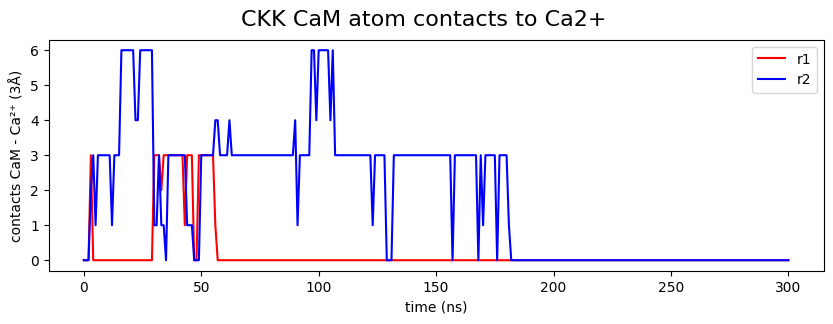

In [138]:
figure=plot_contacts(CKK_dfs, groups[1])

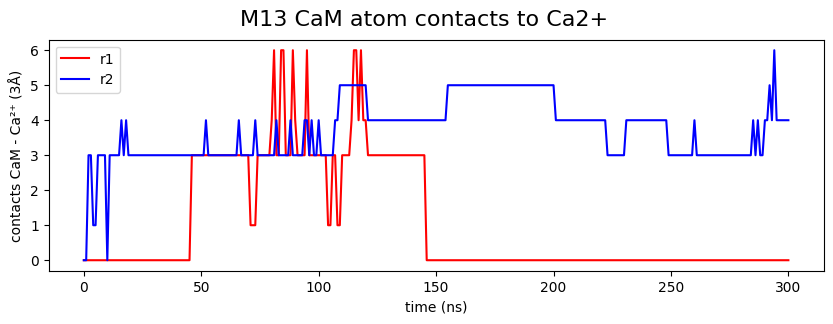

In [139]:
figure=plot_contacts(M13_dfs, groups[3])

### Distances Cam-Ca2+

In [133]:
def plot_distances(u: mda.Universe, sele1: str, sele2: str, title):
    reference_atom = u.select_atoms(sele1)
    target_atoms = u.select_atoms(sele2)
    
    distances = []
    
    for ts in u.trajectory:
        frame_distances = mda.analysis.distances.distance_array(reference_atom.positions, target_atoms.positions, box=ts.dimensions)
        distances.append(frame_distances)
    
    # Extract the time values using ts.frame
    time = [ts.frame for ts in u.trajectory]
    
    plt.figure(figsize=(15, 10))
    for i in range(len(target_atoms)):
        plt.plot(time, [frame_distances[:, i] for frame_distances in distances], label=f"CA-{target_atoms.residues[i].resid}", linewidth=0.5)
    plt.xlabel("Time (ns)")
    plt.ylabel("Distance (Å)")
    plt.title(title)
    
    outname='_'.join(title.replace("-"," ").split())
    fout=f'{outdir}/{outname.lower()}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
    plt.show()
    
    plt.show()

#### CKK Ca2+ r2

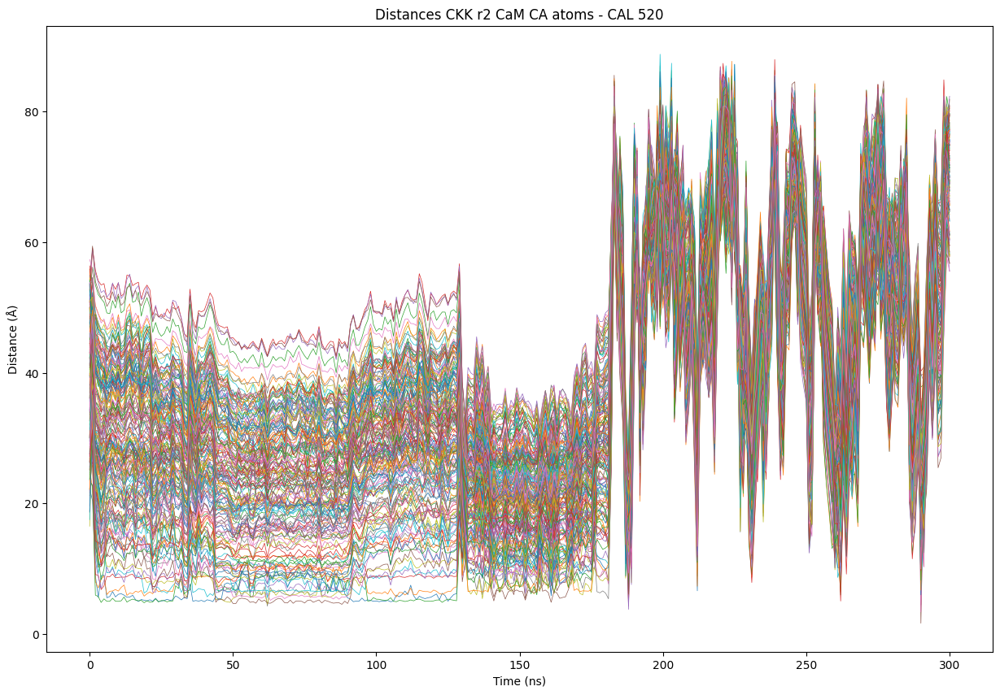

In [134]:
sel1 = "resname CAL and resid 520"
sel2 = "((resid 64-240) and (protein) and (name CA))"
title= "Distances CKK r2 CaM CA atoms - CAL 520"

plot_distances(CKK_universes[1], sel1, sel2, title)

#### M13 Ca2+ r1

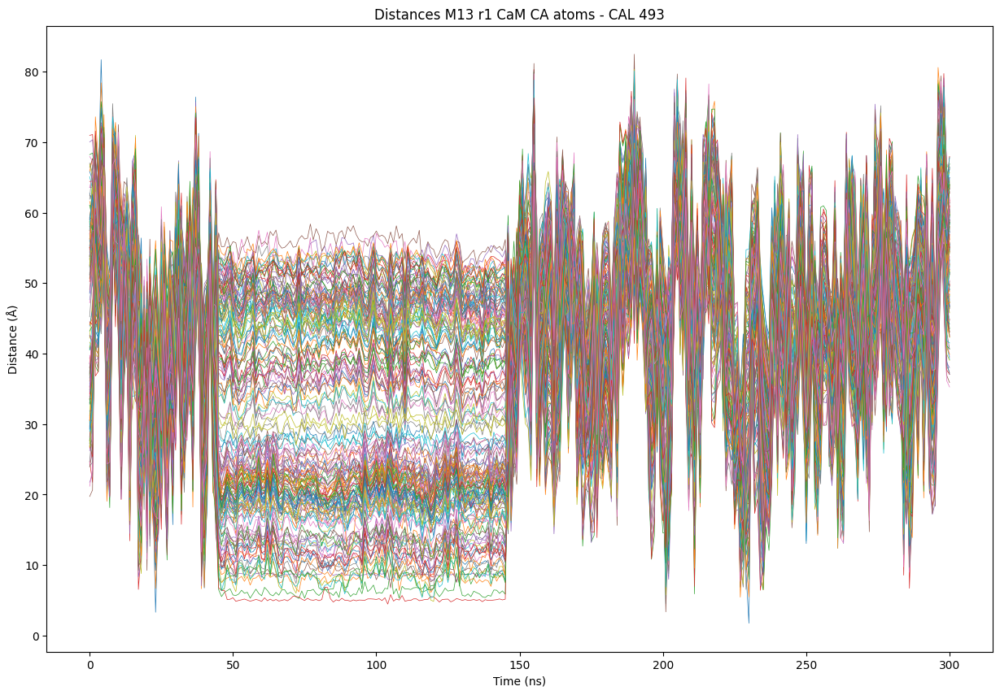

In [135]:
sel1 = "resname CAL and resid 493"
sel2 = "((resid 65-231) and (protein) and (name CA))"
title= "Distances M13 r1 CaM CA atoms - CAL 493"

plot_distances(M13_universes[0], sel1, sel2, title)

#### M13 Ca2+ r2

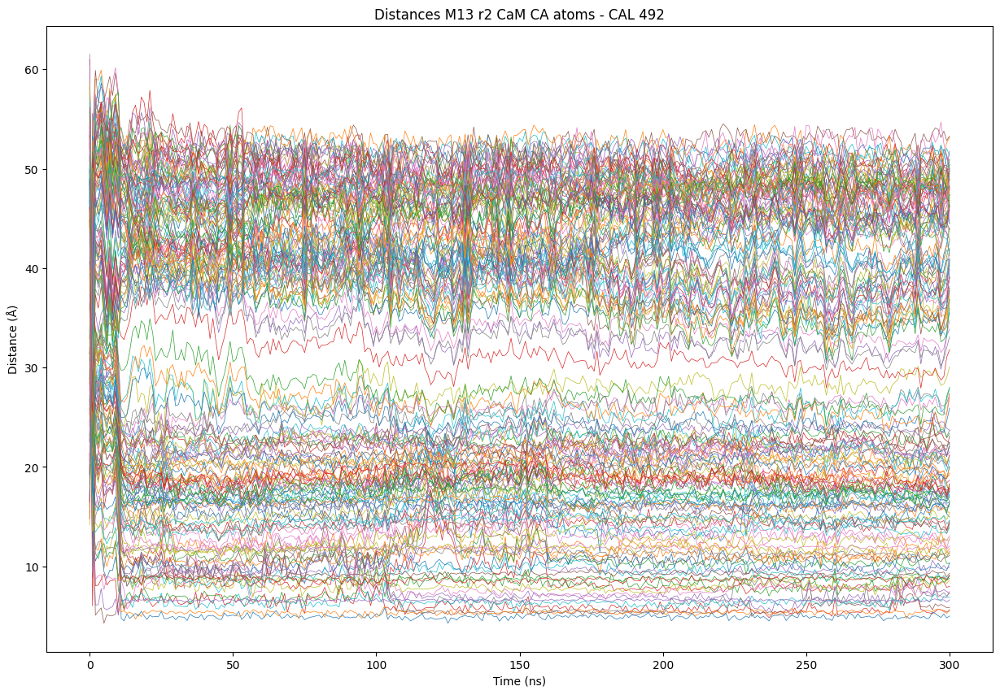

In [136]:
sel1 = "resname CAL and resid 492"
sel2 = "((resid 65-231) and (protein) and (name CA))"
title= "Distances M13 r2 CaM CA atoms - CAL 492"

plot_distances(M13_universes[1], sel1, sel2, title)

## CaM binding peptide SASA

In [5]:
def univ_reps_mdtraj(group: str, rep: str):
    if group.endswith('ca2+'):
        pdb=f'{workdir}/{group}/{rep}/step3_input.gro'
        xtc=f'{workdir}/{group}/{rep}/mdtrj_{rep}_syst_fit.xtc'
    else:    
        pdb=f'{workdir}/{group}/{rep}/mdstr_step3_input_prot.gro'
        xtc=f'{workdir}/{group}/{rep}/mdtrj_{rep}_prot_fit.xtc'
        
    u= (md.load(xtc, top=pdb))
    print (f'Created universe for {group} {rep}:\t{u}')
    return u

In [6]:
def sasa(group:str, rep:str,
        start_res:int, end_res:int):
    
    """Creates Mtraj universe and computes SASA.
    NB: Start and end residues must be passed as 1-indexed
    """
    
    start_time = time.time()
    
    u= univ_reps_mdtraj(group, rep)
    CaM= u.top.select(f"protein and (residue {start_res} to {end_res})") #"residue" selection is 1-indexed, "resid" selection is 0-indexed
    CaM_subtraj= u.atom_slice(CaM)
    sliced= start_res - 1
    print (f'NB {sliced} residues have been cut from N-term')
    sasa= md.shrake_rupley(CaM_subtraj, mode= 'residue')
    
    end_time = time.time()
    execution_time = end_time - start_time
    print (f"Created SASA array with shape {sasa.shape}")
    print(f"Execution time: {execution_time} seconds")
    return sasa

In [7]:
def plot_sasa_4reps (rep1: np.array, rep2: np.array, rep3: np.array, rep4: np.array,
                     name1: str, name2: str,
                     start_residue: int, end_residue: int,
                     res_diff: int):

    """ plot total SASA of start-to-end residues. 
    NOTE res_diff is the amount of residues that were cut away in subtrajectory slicing (=sliced in sasa())
    This is necessary because indexing is now from the subtrajectory N-term.
    """
    
    start= start_residue - res_diff
    end= end_residue - res_diff
    
    def sasa_sum(rep):
        """sums sasa of every residue
        """
        sasa_range= rep[:, start:end+1]  # +1 to include the last residue
        sum_sasa= np.sum(sasa_range, axis=1)
        return sum_sasa
    
    sasa_r1= sasa_sum(rep1)
    sasa_r2= sasa_sum(rep2)
    sasa_r3= sasa_sum(rep3)
    sasa_r4= sasa_sum(rep4)
    
    time = range(0, sasa_r1.shape[0]) # Frames are 0-indexed
    
    fig= plt.figure(figsize=[18, 6])
    ax1= fig.add_subplot(111)
    ax1.plot(time, sasa_r1, label=f'{name1} r1', c='orangered')
    ax1.plot(time, sasa_r2, label=f'{name1} r2', c='darkorange')
    ax1.plot(time, sasa_r3, label=f'{name2} r1', c='b')
    ax1.plot(time, sasa_r4, label=f'{name2} r2', c='navy')
    
    ax1.legend()
    ax1.set_xlabel('Time (ns)')
    ax1.set_ylabel('Total SASA (Å^2)')
    ax1.set_title(f'Total SASA of CaM-binding peptide (res {start_residue}-{end_residue}) over time')
    fout= f'{outdir}/sasa_{name1}_{name1}ca2+_{start_residue}-{end_residue}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')
    
    plt.show()

In [8]:
def kde_sasa_4reps (rep1: np.array, rep2: np.array, rep3: np.array, rep4: np.array,
                    name1: str, name2: str,
                    start_residue: int, end_residue: int,
                    res_diff: int,
                    bandwidth=0.5):
    
    """ plot total SASA distribution of start-to-end residues. 
    NOTE res_diff is the amount of residues that were cut away in subtrajectory slicing (=sliced in sasa())
    This is necessary because indexing is now from the subtrajectory N-term.
    """
    
    start= start_residue - res_diff
    end= end_residue - res_diff
    
    def sasa_sum(rep):
        """sums sasa of every residue
        """
        sasa_range= rep[:, start:end+1]  # +1 to include the last residue
        sum_sasa= np.sum(sasa_range, axis=1)
        return sum_sasa
    
    sasa_r1= sasa_sum(rep1)
    sasa_r2= sasa_sum(rep2)
    sasa_r3= sasa_sum(rep3)
    sasa_r4= sasa_sum(rep4)
    
    sasa_r1r2= np.concatenate((sasa_r1, sasa_r2))
    sasa_r3r4= np.concatenate((sasa_r3, sasa_r4))
    
    plt.figure(figsize=[4, 3])
    
    # Create kernel density plot
    sns.kdeplot(sasa_r1r2, fill=True, color='darkorange', bw_method=bandwidth, label=name1)
    sns.kdeplot(sasa_r3r4, fill=True, color='b', bw_method=bandwidth, label=name2)
    
    plt.xlabel('Total SASA (Å^2)')
    plt.ylabel('Distribution')
    plt.title(f'Total SASA distribution of CaM-binding peptide (res {start_residue}-{end_residue})', fontsize=10)
    
    leg = plt.legend(fontsize=8)
    
    fout= f'{outdir}/sasa_distribution_{name1}_{name1}ca2+_{start_residue}-{end_residue}'
    plt.savefig(fout, dpi=300, facecolor='white', bbox_inches='tight')

    plt.show()

### CKK

In [8]:
sasa_CKK_r1= sasa('CKK', 'r1', 64, 240)

Created universe for CKK r1:	<mdtraj.Trajectory with 301 frames, 6247 atoms, 401 residues, and unitcells>
NB 63 residues have been cut from N-term
Created SASA array with shape (301, 177)
Execution time: 131.08103919029236 seconds


In [9]:
sasa_CKK_r2= sasa('CKK', 'r2', 64, 240)

Created universe for CKK r2:	<mdtraj.Trajectory with 301 frames, 6247 atoms, 401 residues, and unitcells>
NB 63 residues have been cut from N-term
Created SASA array with shape (301, 177)
Execution time: 140.580087184906 seconds


In [11]:
sasa_CKK_ca2_r1= sasa('CKK_ca2+', 'r1', 64, 240)

Created universe for CKK_ca2+ r1:	<mdtraj.Trajectory with 301 frames, 111537 atoms, 35651 residues, and unitcells>
NB 63 residues have been cut from N-term
Created SASA array with shape (301, 177)
Execution time: 130.53908610343933 seconds


In [12]:
sasa_CKK_ca2_r2= sasa('CKK_ca2+', 'r2', 64, 240)

Created universe for CKK_ca2+ r2:	<mdtraj.Trajectory with 301 frames, 111537 atoms, 35651 residues, and unitcells>
NB 63 residues have been cut from N-term
Created SASA array with shape (301, 177)
Execution time: 129.86298537254333 seconds


(301, 177)

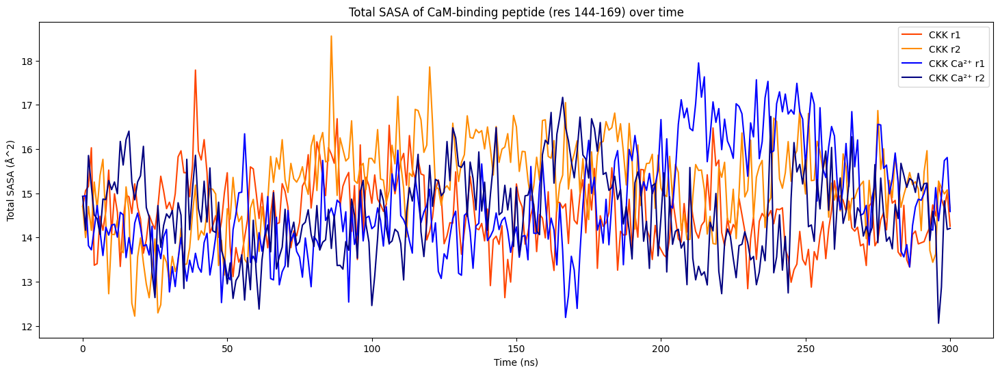

In [35]:
# CaM binding peptide alpha-helix residues: 150-161 (CKK)
plot_sasa_4reps (sasa_CKK_r1, sasa_CKK_r2, sasa_CKK_ca2_r1, sasa_CKK_ca2_r2,
                   groupnames[0], groupnames[1],
                   144, 169,
                   63)

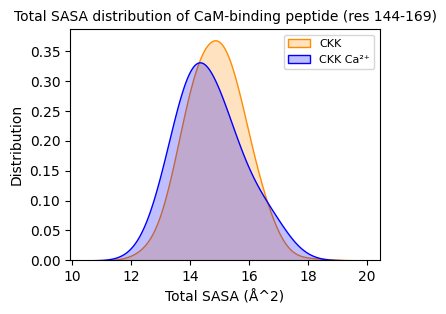

In [64]:
kde_sasa_4reps (sasa_CKK_r1, sasa_CKK_r2, sasa_CKK_ca2_r1, sasa_CKK_ca2_r2,
                   groupnames[0], groupnames[1],
                   144, 169,
                   63)

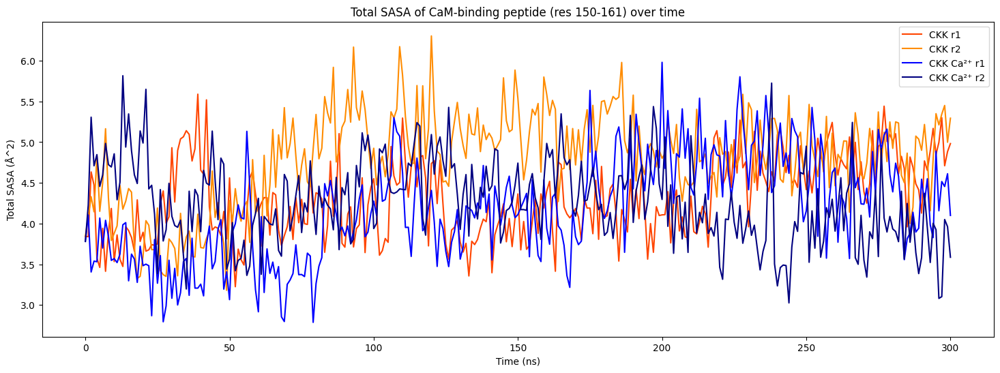

In [38]:
plot_sasa_4reps (sasa_CKK_r1, sasa_CKK_r2, sasa_CKK_ca2_r1, sasa_CKK_ca2_r2,
                   groupnames[0], groupnames[1],
                   150, 161,
                   63)

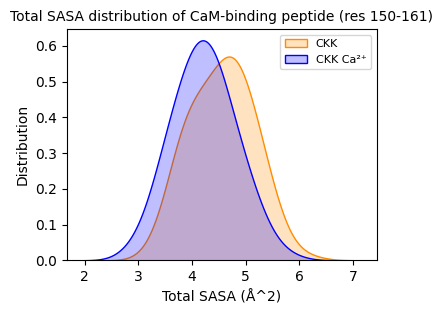

In [65]:
kde_sasa_4reps (sasa_CKK_r1, sasa_CKK_r2, sasa_CKK_ca2_r1, sasa_CKK_ca2_r2,
                   groupnames[0], groupnames[1],
                   150, 161,
                   63)

### M13

In [9]:
sasa_M13_r1= sasa('M13', 'r1', 65, 231)

Created universe for M13 r1:	<mdtraj.Trajectory with 301 frames, 6096 atoms, 392 residues, and unitcells>
NB 64 residues have been cut from N-term
Created SASA array with shape (301, 167)
Execution time: 122.9441568851471 seconds


In [10]:
sasa_M13_r2= sasa('M13', 'r2', 65, 231)

Created universe for M13 r2:	<mdtraj.Trajectory with 301 frames, 6096 atoms, 392 residues, and unitcells>
NB 64 residues have been cut from N-term
Created SASA array with shape (301, 167)
Execution time: 118.88879585266113 seconds


In [11]:
sasa_M13_ca2_r1= sasa('M13_ca2+', 'r1', 65, 231)

Created universe for M13_ca2+ r1:	<mdtraj.Trajectory with 301 frames, 93105 atoms, 29523 residues, and unitcells>
NB 64 residues have been cut from N-term
Created SASA array with shape (301, 167)
Execution time: 117.2219078540802 seconds


In [12]:
sasa_M13_ca2_r2= sasa('M13_ca2+', 'r2', 65, 231)

Created universe for M13_ca2+ r2:	<mdtraj.Trajectory with 301 frames, 93105 atoms, 29523 residues, and unitcells>
NB 64 residues have been cut from N-term
Created SASA array with shape (301, 167)
Execution time: 131.35736322402954 seconds


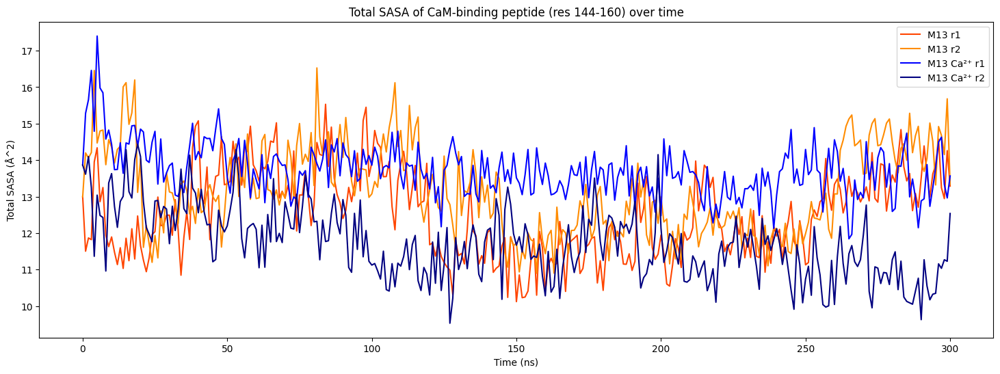

In [14]:
plot_sasa_4reps (sasa_M13_r1, sasa_M13_r2, sasa_M13_ca2_r1, sasa_M13_ca2_r2,
                 groupnames[2], groupnames[3],
                 144, 160,
                 64)

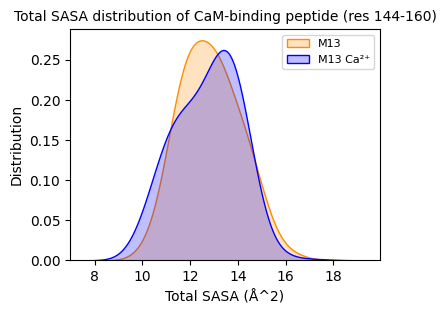

In [15]:
kde_sasa_4reps (sasa_M13_r1, sasa_M13_r2, sasa_M13_ca2_r1, sasa_M13_ca2_r2,
                 groupnames[2], groupnames[3],
                 144, 160,
                 64)

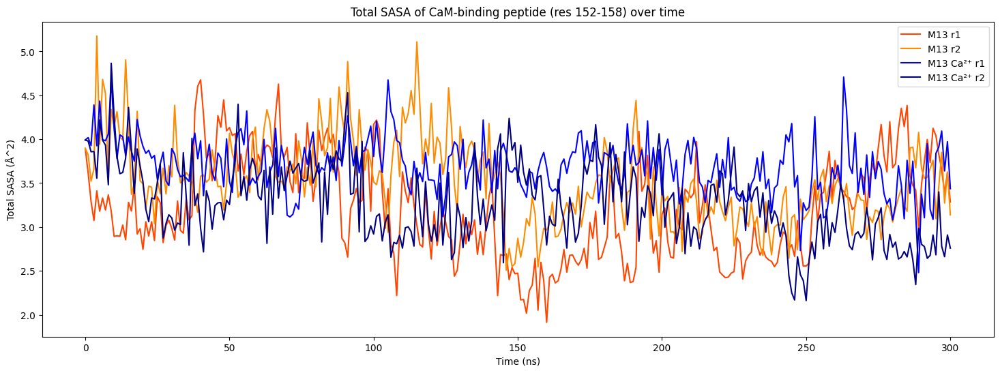

In [17]:
plot_sasa_4reps (sasa_M13_r1, sasa_M13_r2, sasa_M13_ca2_r1, sasa_M13_ca2_r2,
                 groupnames[2], groupnames[3],
                 152, 158,
                 64)

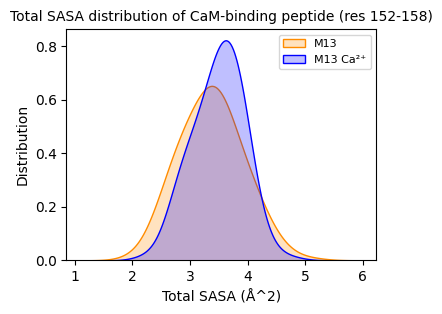

In [18]:
kde_sasa_4reps (sasa_M13_r1, sasa_M13_r2, sasa_M13_ca2_r1, sasa_M13_ca2_r2,
                 groupnames[2], groupnames[3],
                 152, 158,
                 64)

## CaM bp - CaM distances

In [82]:
def distances(u: mda.Universe, selection_1: str, selection_2: str) -> (np.array, np.array):
    
    """returns 
    - frames array
    - distances array between center of mass of two selections
      over a trajectory"
    """
    
    s1 = u.select_atoms (selection_1)
    s2 = u.select_atoms (selection_2)
    distances = []
    for ts in u.trajectory:
        com1 = s1.center_of_mass()
        com2 = s2.center_of_mass()
        distance = mda.analysis.distances.distance_array(com1, com2)
        distances.append(distance)

    flat_distances = np.array(distances).flatten()
    time = [ts.frame for ts in u.trajectory]
    return (time, flat_distances)

In [129]:
def distance_plot_4reps(sel_x: str, sel_y: str,
                        u1: mda.Universe, u2: mda.Universe, u3: mda.Universe, u4: mda.Universe,
                        groupname_1: str, groupname_2: str,
                        bandwidth= 0.5):

    """plots distances between center of mass of two selections
    over four trajectories (two replicates x two groups)
    """
    
    t1, d1=distances(u1, sel_x, sel_y)
    t2, d2=distances(u2, sel_x, sel_y)
    t3, d3=distances(u3, sel_x, sel_y)
    t4, d4=distances(u4, sel_x, sel_y)
    
    if not (len(t1) == len(t2) == len(t3) == len(t4)):
        raise ValueError('universes have different amount of frames')
    
    fig= plt.figure(figsize=[18, 6])
    ax1= fig.add_subplot(111)
    ax1.plot(t1, d1, label=f'{groupname_1} r1', c='orangered')
    ax1.plot(t2, d2, label=f'{groupname_1} r2', c='darkorange')
    ax1.plot(t3, d3, label=f'{groupname_2} r1', c='b')
    ax1.plot(t4, d4, label=f'{groupname_2} r2', c='navy')
    
    ax1.legend()
    ax1.set_xlabel('Time (ns)')
    ax1.set_ylabel('Distance (Å)')
    ax1.set_title(f'Distance ({sel_x}) to ({sel_y}) over time')
    fout= f'{outdir}/distance_{groupname_1}_{groupname_1}ca2+_{sel_x}-{sel_y}'
    _fout= fout.replace(' ','_')
    plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')
    plt.show()

    plt.figure(figsize=[4, 3])
    d1d2= np.concatenate((d1, d2))
    d3d4= np.concatenate((d3, d4))
    # Create kernel density plot
    sns.kdeplot(d1d2, fill=True, color='darkorange', bw_method=bandwidth, label=groupname_1)
    sns.kdeplot(d3d4, fill=True, color='b', bw_method=bandwidth, label=groupname_2)
    
    plt.xlabel('Distance (Å)')
    plt.ylabel('Distribution')
    plt.title(f'Distance distribution ({sel_x}) to ({sel_y})', fontsize=10)
    
    leg = plt.legend(fontsize=8)
    
    fout= f'{outdir}/distance_distr_{groupname_1}_{groupname_1}ca2+_{sel_x}-{sel_y}'
    _fout= fout.replace(' ','_')
    plt.savefig(_fout, dpi=300, facecolor='white', bbox_inches='tight')
    
    plt.show()

### CKK

#### CaM BP Alpha helix- CaM

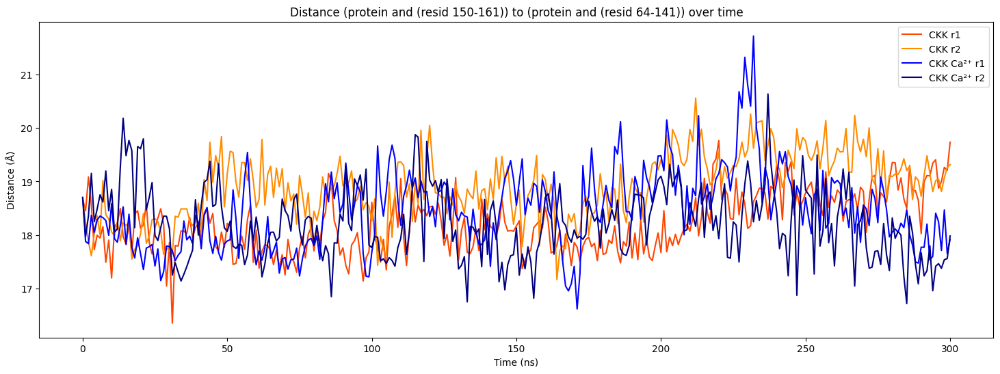

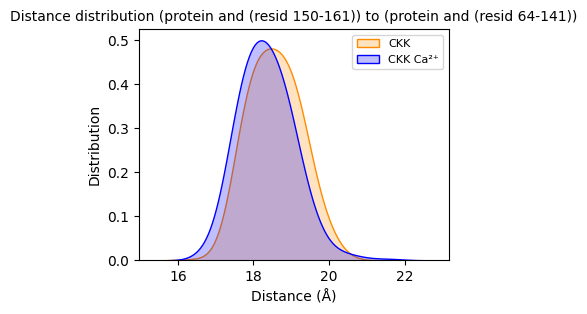

In [130]:
distance_plot_4reps('protein and (resid 150-161)', 'protein and (resid 64-141)',
                   CKK_univs[0], CKK_univs[1], CKK_ca2_univs[0], CKK_ca2_univs[1],
                   groupnames[0], groupnames[1])

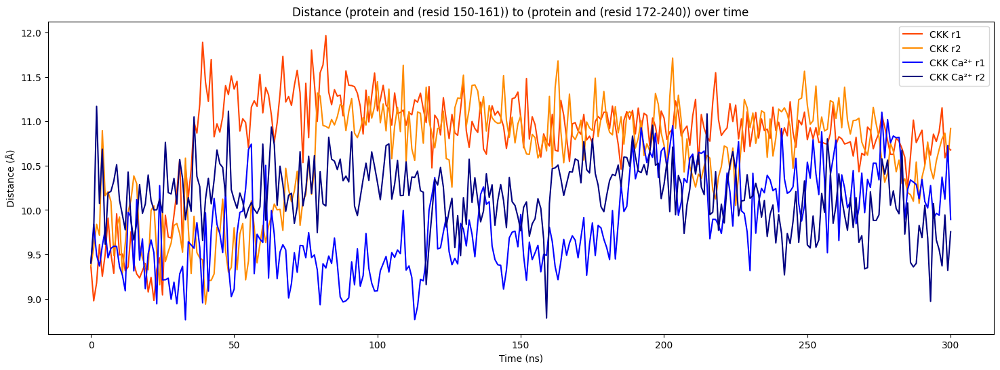

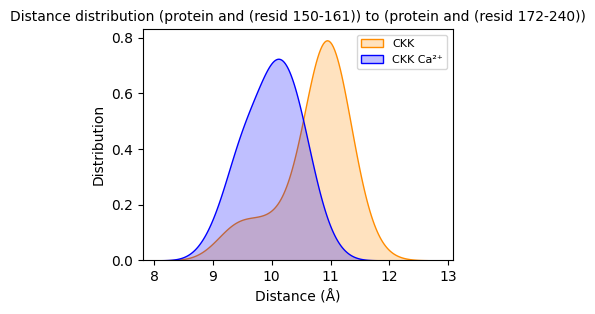

In [131]:
distance_plot_4reps('protein and (resid 150-161)', 'protein and (resid 172-240)',
                   CKK_univs[0], CKK_univs[1], CKK_ca2_univs[0], CKK_ca2_univs[1],
                   groupnames[0], groupnames[1])

#### CaM BP - CaM

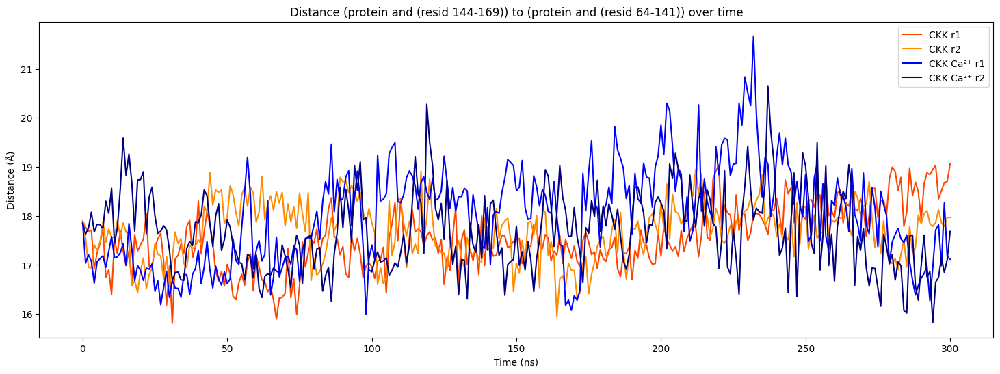

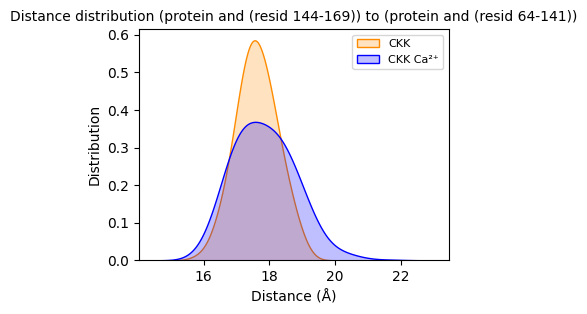

In [132]:
distance_plot_4reps('protein and (resid 144-169)', 'protein and (resid 64-141)',
                   CKK_univs[0], CKK_univs[1], CKK_ca2_univs[0], CKK_ca2_univs[1],
                   groupnames[0], groupnames[1])

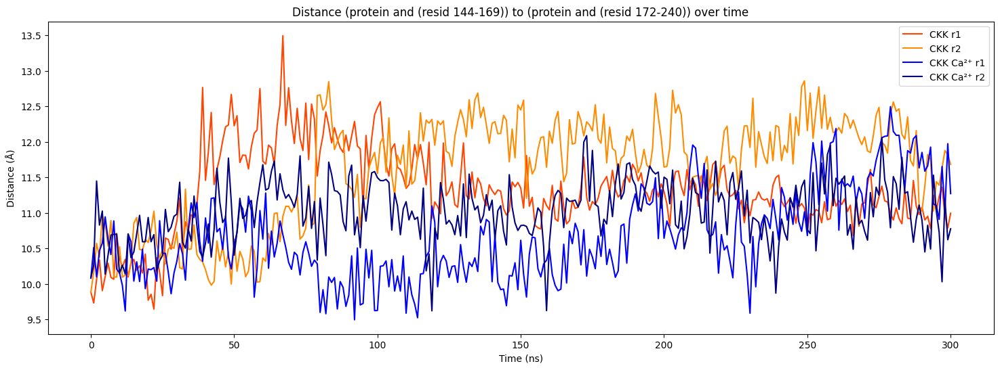

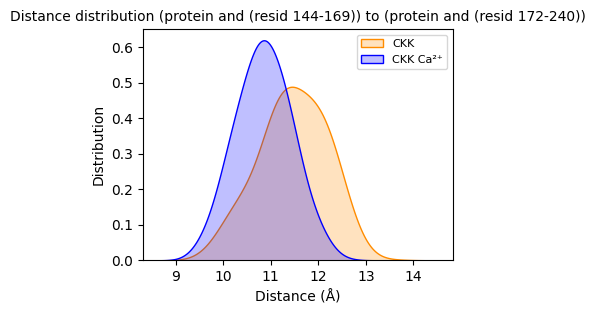

In [133]:
distance_plot_4reps('protein and (resid 144-169)', 'protein and (resid 172-240)',
                   CKK_univs[0], CKK_univs[1], CKK_ca2_univs[0], CKK_ca2_univs[1],
                   groupnames[0], groupnames[1])

#### CaM - CaM

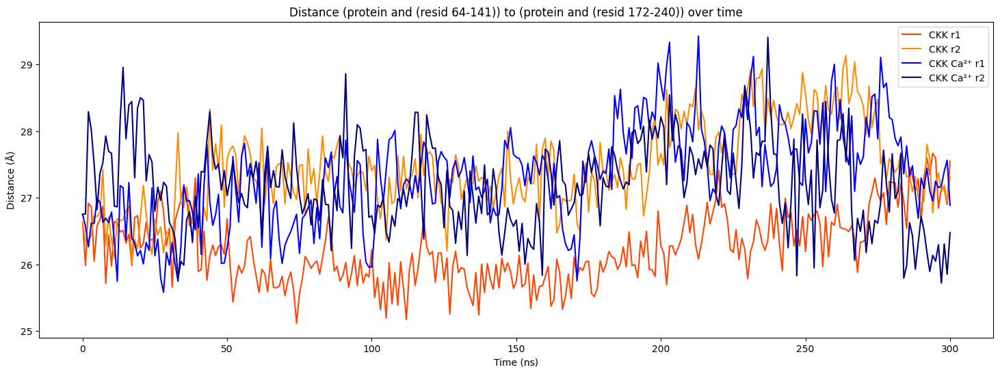

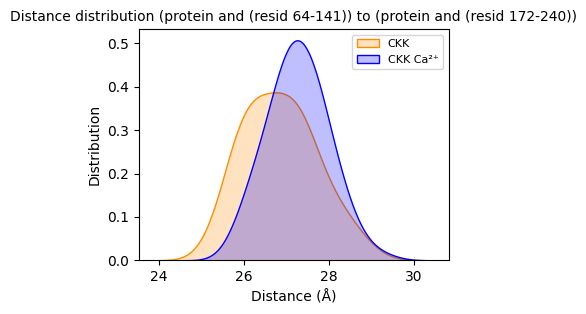

In [134]:
distance_plot_4reps('protein and (resid 64-141)', 'protein and (resid 172-240)',
                   CKK_univs[0], CKK_univs[1], CKK_ca2_univs[0], CKK_ca2_univs[1],
                   groupnames[0], groupnames[1])

### M13

#### CaM BP Alpha helix- CaM

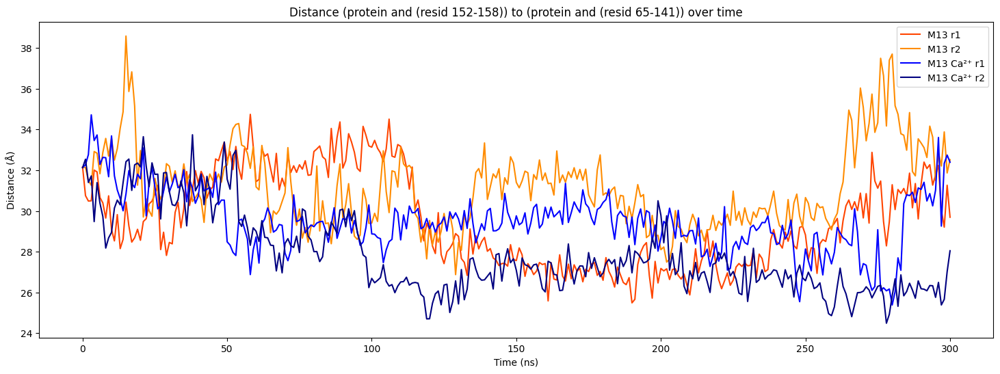

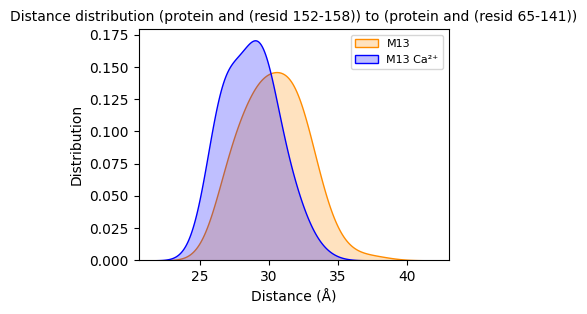

In [135]:
distance_plot_4reps('protein and (resid 152-158)', 'protein and (resid 65-141)',
                   M13_univs[0], M13_univs[1], M13_ca2_univs[0], M13_ca2_univs[1],
                   groupnames[2], groupnames[3])

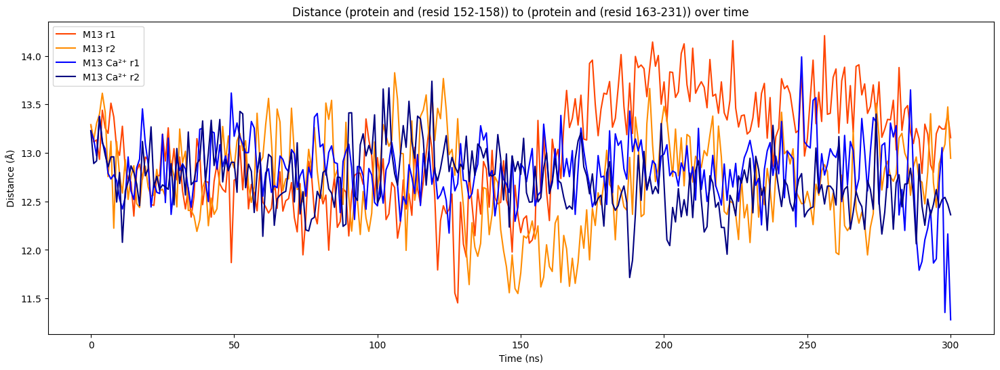

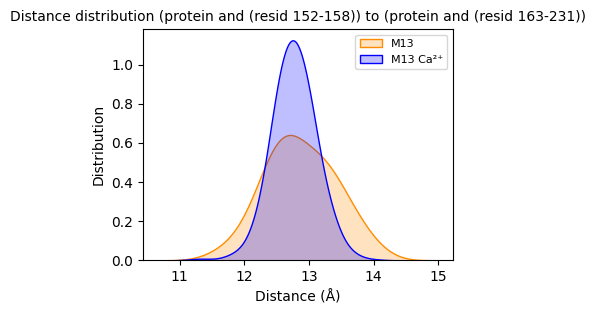

In [136]:
distance_plot_4reps('protein and (resid 152-158)', 'protein and (resid 163-231)',
                   M13_univs[0], M13_univs[1], M13_ca2_univs[0], M13_ca2_univs[1],
                   groupnames[2], groupnames[3])

#### CaM BP - CaM

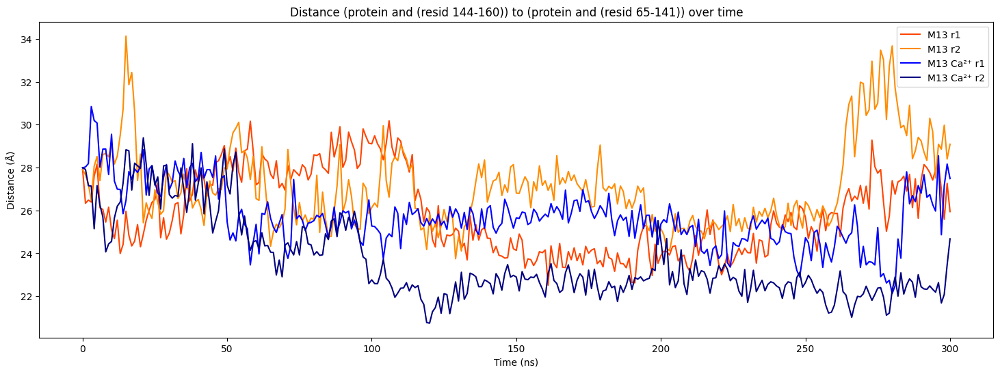

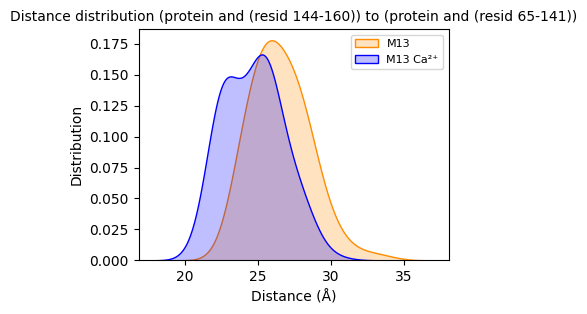

In [137]:
distance_plot_4reps('protein and (resid 144-160)', 'protein and (resid 65-141)',
                   M13_univs[0], M13_univs[1], M13_ca2_univs[0], M13_ca2_univs[1],
                   groupnames[2], groupnames[3])

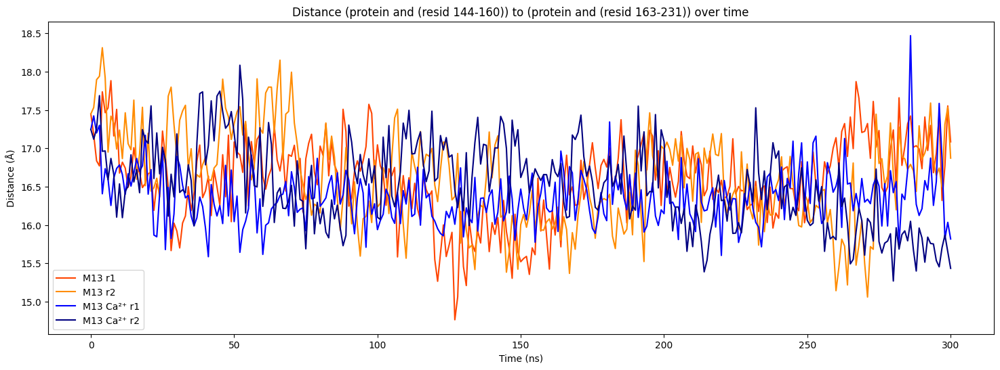

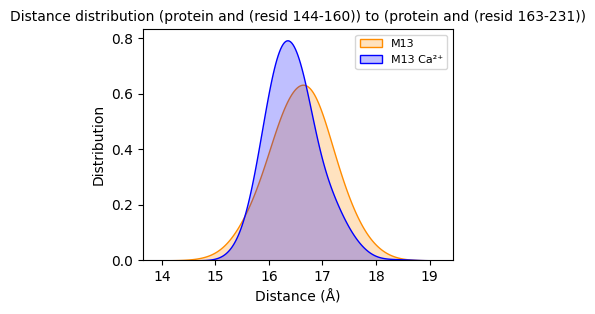

In [138]:
distance_plot_4reps('protein and (resid 144-160)', 'protein and (resid 163-231)',
                   M13_univs[0], M13_univs[1], M13_ca2_univs[0], M13_ca2_univs[1],
                   groupnames[2], groupnames[3])

#### CaM - CaM

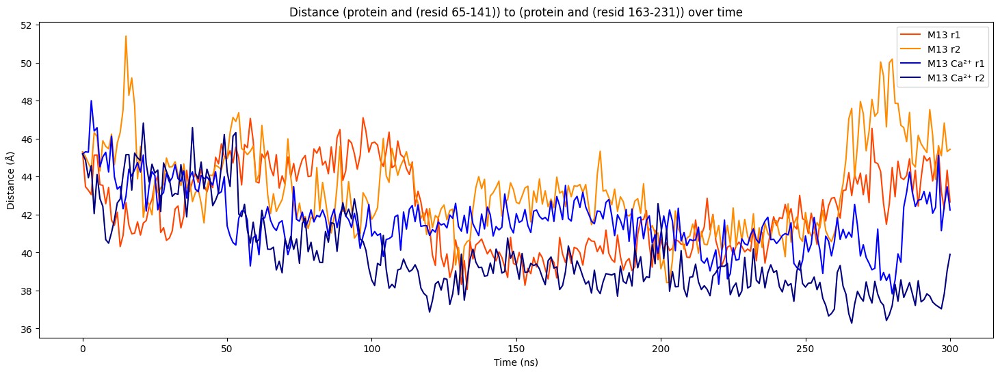

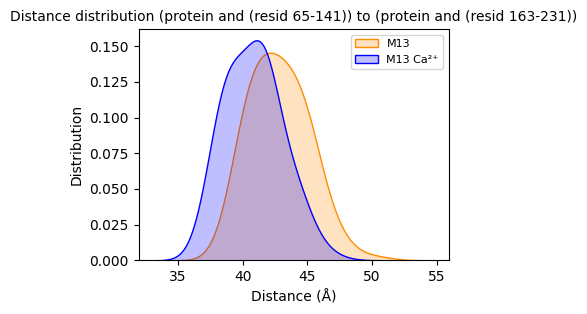

In [139]:
distance_plot_4reps('protein and (resid 65-141)', 'protein and (resid 163-231)',
                   M13_univs[0], M13_univs[1], M13_ca2_univs[0], M13_ca2_univs[1],
                   groupnames[2], groupnames[3])